<a href="https://colab.research.google.com/github/teobras/My_Script-Articles/blob/main/PhD_vers_01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Estudo de Previsão de Variáveis Macroeconómicas e Financeiras
## Fase 1 — Análise Exploratória de Dados (EDA) e Pré-processamento

| Campo | Detalhe |
|---|---|
| **Variáveis** | Câmbio · Inflação · Petróleo |
| **Período** | Dezembro 2020 – Dezembro 2025 |
| **Frequência** | Diária |
| **Modelos (fases seguintes)** | VEC · SVAR · EGARCH · RF · XGBoost · SVR · LSTM · GRU |
| **Objectivo** | Publicação em revista Q1 |

---

### Estrutura deste notebook
1. Importação de bibliotecas e configuração global
2. Carregamento dos dados
3. Integração num único painel
4. Diagnóstico de valores em falta
5. Tratamento de valores em falta
6. Estatísticas descritivas
7. Figura 1 — Séries temporais
8. Figura 2 — Distribuições e Q-Q plots
9. Figura 3 — Matriz de correlação
10. Figura 4 — Dispersão cruzada
11. Testes de estacionariedade (ADF e KPSS)
12. Figura 5 — Nível vs. Primeiras diferenças
13. Figura 6 — ACF e PACF
14. Divisão treino / validação / teste
15. Figura 7 — Visualização da divisão
16. Normalização MinMax
17. Resumo final


In [12]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
print("Modo inline activado — figuras serão exibidas directamente no notebook.")

Modo inline activado — figuras serão exibidas directamente no notebook.


## 1. Importação de Bibliotecas e Configuração Global

In [13]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')

# Configuração global dos gráficos (estilo académico)
plt.rcParams.update({
    'figure.dpi'        : 150,
    'savefig.dpi'       : 300,
    'font.family'       : 'serif',
    'font.size'         : 10,
    'axes.titlesize'    : 10,
    'axes.labelsize'    : 10,
    'axes.spines.top'   : False,
    'axes.spines.right' : False,
    'axes.grid'         : True,
    'grid.alpha'        : 0.3,
    'legend.framealpha' : 0.7,
    'figure.facecolor'  : 'white',
})

# Paleta de cores por variável
CORES = {
    'cambio'   : '#2563EB',   # azul
    'inflacao' : '#16A34A',   # verde
    'petroleo' : '#EA580C',   # laranja
    'neutro'   : '#64748B',
}

# Directório de saída
SAIDA = '/mnt/user-data/outputs/'
print("Bibliotecas carregadas com sucesso.")


Bibliotecas carregadas com sucesso.


## 2. Carregamento dos Dados

Os três ficheiros CSV contêm dados diários de:
- **Câmbio** — variação cambial (%);
- **Inflação** — taxa de inflação (%);
- **Petróleo** — preço em USD por barril.


In [14]:
from google.colab import drive
drive.mount('/content/drive')

# Carregar os ficheiros CSV

cambio   = pd.read_csv('/content/drive/MyDrive/My_Articles/1st_Article/datasets/cambio.csv',   parse_dates=['date'])
inflacao = pd.read_csv('/content/drive/MyDrive/My_Articles/1st_Article/datasets/inflacao.csv', parse_dates=['date'])
petroleo = pd.read_csv('/content/drive/MyDrive/My_Articles/1st_Article/datasets/petroleo.csv', parse_dates=['date'])

# Renomear colunas para uniformidade
cambio.columns   = ['data', 'cambio']
inflacao.columns = ['data', 'inflacao']
petroleo.columns = ['data', 'petroleo']

# Ordenar por data
cambio   = cambio.sort_values('data').reset_index(drop=True)
inflacao = inflacao.sort_values('data').reset_index(drop=True)
petroleo = petroleo.sort_values('data').reset_index(drop=True)

print(f"Câmbio   : {len(cambio)} obs.  |  {cambio.data.min().date()} a {cambio.data.max().date()}")
print(f"Inflação : {len(inflacao)} obs.  |  {inflacao.data.min().date()} a {inflacao.data.max().date()}")
print(f"Petróleo : {len(petroleo)} obs.  |  {petroleo.data.min().date()} a {petroleo.data.max().date()}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Câmbio   : 1305 obs.  |  2020-12-04 a 2025-12-04
Inflação : 1305 obs.  |  2020-12-07 a 2025-12-05
Petróleo : 1305 obs.  |  2020-12-01 a 2025-12-01


## 3. Integração num Único Painel

Utiliza-se um **outer join** para preservar todas as datas de qualquer uma das séries.
As datas sem correspondência noutras séries gerarão `NaN`, tratados na secção seguinte.


In [15]:
df = (cambio
      .merge(inflacao, on='data', how='outer')
      .merge(petroleo, on='data', how='outer')
      .sort_values('data')
      .reset_index(drop=True))

df.set_index('data', inplace=True)
df.index.freq = None  # frequência irregular (inclui fins-de-semana e feriados)

print(f"Painel combinado : {df.shape[0]} datas × {df.shape[1]} variáveis")
print(f"Período final    : {df.index.min().date()} a {df.index.max().date()}")
df.head(10)


Painel combinado : 1309 datas × 3 variáveis
Período final    : 2020-12-01 a 2025-12-05


,cambio,inflacao,petroleo
data,,,
2020-12-01,NaN,NaN,47.03
2020-12-02,NaN,NaN,47.80
2020-12-03,NaN,NaN,48.37
2020-12-04,-0.340,NaN,49.10
2020-12-07,-0.368,1.88,48.63
2020-12-08,-0.393,1.89,48.84
2020-12-09,-0.384,1.91,48.81
2020-12-10,-0.399,1.88,50.33
2020-12-11,-0.400,1.87,50.01


## 4. Diagnóstico de Valores em Falta

Identificam-se os valores em falta e os maiores blocos consecutivos de `NaN`.
Lacunas curtas (≤ 4 dias) são tipicamente fins-de-semana ou feriados nacionais.


In [5]:
nulos = df.isnull().sum()
pct   = (nulos / len(df) * 100).round(2)

resumo_nulos = pd.DataFrame({'Nulos': nulos, '% Total': pct})
print(resumo_nulos.to_string())

print("\nMaiores lacunas consecutivas:")
for col in df.columns:
    s      = df[col].isnull()
    grupos = s.ne(s.shift()).cumsum()[s]
    if len(grupos) > 0:
        maior = grupos.value_counts().max()
        print(f"  {col:<12}: {maior} dia(s) consecutivo(s) em falta")


          Nulos  % Total
cambio       60     4.58
inflacao     59     4.51
petroleo     44     3.36

Maiores lacunas consecutivas:
  cambio      : 3 dia(s) consecutivo(s) em falta
  inflacao    : 4 dia(s) consecutivo(s) em falta
  petroleo    : 4 dia(s) consecutivo(s) em falta


## 5. Tratamento de Valores em Falta

**Estratégia adoptada:**
1. **Interpolação linear** para lacunas de até 5 dias — adequada para séries financeiras diárias onde a evolução entre dois pontos conhecidos é aproximadamente linear.
2. **Forward/backward fill** para eventuais `NaN` nos extremos da série (inícios ou fins).

> **Nota metodológica:** Esta abordagem é preferível ao simples `dropna()` porque preserva a continuidade temporal, essencial para modelos como LSTM e GRU.


In [6]:
df_limpo = df.copy()
df_limpo = df_limpo.interpolate(method='linear', limit=5)
df_limpo = df_limpo.ffill().bfill()

nulos_pos = df_limpo.isnull().sum()
print(f"Valores em falta após tratamento : {nulos_pos.sum()} (esperado: 0)")
print(f"Método: interpolação linear + forward/backward fill")
df_limpo.describe().round(4)


Valores em falta após tratamento : 0 (esperado: 0)
Método: interpolação linear + forward/backward fill


,cambio,inflacao,petroleo
count,1309.0000,1309.0000,1309.0000
mean,1.3755,2.3468,80.4403
std,1.0706,0.1670,14.4150
min,-0.5920,1.8700,47.0300
25%,0.0600,2.2600,71.5100
50%,1.8160,2.3300,78.4700
75%,2.2480,2.4100,86.4700
max,2.6850,3.0200,133.1800


## 6. Estatísticas Descritivas

Calculam-se medidas de localização, dispersão, forma e normalidade para cada variável.
O **teste de Jarque-Bera** avalia a hipótese nula de normalidade.


In [8]:
import os

def estatisticas_descritivas(serie, nome):
    """Calcula estatísticas descritivas completas para uma série temporal."""
    n        = len(serie)
    media    = serie.mean()
    mediana  = serie.median()
    dp       = serie.std(ddof=1)
    cv       = (dp / media * 100) if media != 0 else np.nan
    minimo   = serie.min()
    maximo   = serie.max()
    assim    = stats.skew(serie.dropna())
    curtose  = stats.kurtosis(serie.dropna(), fisher=True)  # excesso de curtose
    _, p_jb  = stats.jarque_bera(serie.dropna())
    q25      = serie.quantile(0.25)
    q75      = serie.quantile(0.75)
    iqr      = q75 - q25
    return {
        'N'              : n,
        'Média'          : round(media, 4),
        'Mediana'        : round(mediana, 4),
        'Desvio-Padrão'  : round(dp, 4),
        'Coef. Variação%': round(cv, 2),
        'Mínimo'         : round(minimo, 4),
        'Máximo'         : round(maximo, 4),
        'Amplitude'      : round(maximo - minimo, 4),
        'Q1 (25%)'       : round(q25, 4),
        'Q3 (75%)'       : round(q75, 4),
        'IQR'            : round(iqr, 4),
        'Assimetria'     : round(assim, 4),
        'Curtose (exc.)' : round(curtose, 4),
        'p-valor JB'     : round(p_jb, 4),
        'Normalidade'    : 'Não' if p_jb < 0.05 else 'Sim',
    }

tabela_desc = pd.DataFrame({
    'Câmbio'  : estatisticas_descritivas(df_limpo['cambio'],   'Câmbio'),
    'Inflação': estatisticas_descritivas(df_limpo['inflacao'], 'Inflação'),
    'Petróleo': estatisticas_descritivas(df_limpo['petroleo'], 'Petróleo'),
})

# Criar o directório de saída se não existir
os.makedirs(SAIDA, exist_ok=True)

tabela_desc.to_csv(SAIDA + 'tabela_estatisticas_descritivas.csv')
print("→ Guardado: tabela_estatisticas_descritivas.csv\n")
tabela_desc

→ Guardado: tabela_estatisticas_descritivas.csv



,Câmbio,Inflação,Petróleo
N,1309,1309,1309
Média,1.3755,2.3468,80.4403
Mediana,1.816,2.33,78.47
Desvio-Padrão,1.0706,0.167,14.415
Coef. Variação%,77.83,7.12,17.92
Mínimo,-0.592,1.87,47.03
Máximo,2.685,3.02,133.18
Amplitude,3.277,1.15,86.15
Q1 (25%),0.06,2.26,71.51
Q3 (75%),2.248,2.41,86.47


## 7. Figura 1 — Séries Temporais

Evolução temporal das três variáveis com anotação automática dos valores mínimo e máximo.


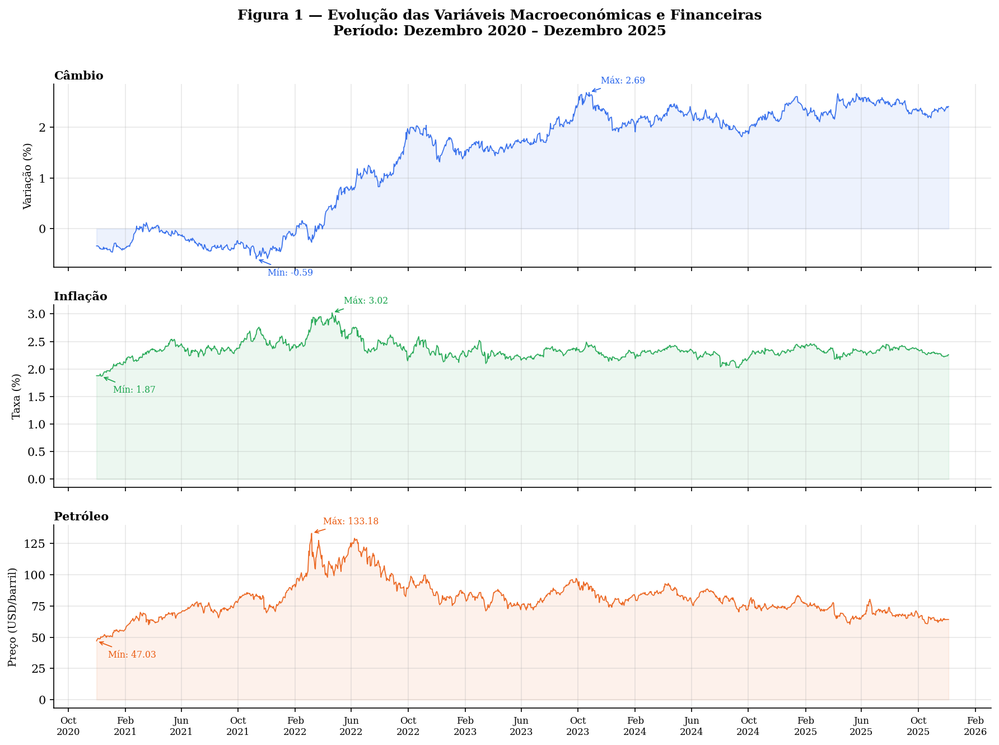

→ Guardado: fig1_series_temporais.png


In [9]:
fig, axes = plt.subplots(3, 1, figsize=(12, 9), sharex=True)
fig.suptitle('Figura 1 — Evolução das Variáveis Macroeconómicas e Financeiras\n'
             'Período: Dezembro 2020 – Dezembro 2025', fontsize=12, fontweight='bold', y=0.98)

variaveis = [
    ('cambio',   'Câmbio',   CORES['cambio'],   'Variação (%)'),
    ('inflacao', 'Inflação', CORES['inflacao'], 'Taxa (%)'),
    ('petroleo', 'Petróleo', CORES['petroleo'], 'Preço (USD/barril)'),
]

for ax, (col, titulo, cor, ylabel) in zip(axes, variaveis):
    ax.plot(df_limpo.index, df_limpo[col], color=cor, linewidth=0.8, alpha=0.9)
    ax.fill_between(df_limpo.index, df_limpo[col], alpha=0.08, color=cor)
    ax.set_ylabel(ylabel, fontsize=9)
    ax.set_title(titulo, fontsize=10, fontweight='bold', loc='left', pad=4)
    idx_max = df_limpo[col].idxmax()
    idx_min = df_limpo[col].idxmin()
    ax.annotate(f'Máx: {df_limpo[col].max():.2f}',
                xy=(idx_max, df_limpo[col].max()),
                xytext=(10, 8), textcoords='offset points',
                fontsize=7.5, color=cor,
                arrowprops=dict(arrowstyle='->', color=cor, lw=0.8))
    ax.annotate(f'Mín: {df_limpo[col].min():.2f}',
                xy=(idx_min, df_limpo[col].min()),
                xytext=(10, -14), textcoords='offset points',
                fontsize=7.5, color=cor,
                arrowprops=dict(arrowstyle='->', color=cor, lw=0.8))

axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))
axes[-1].xaxis.set_major_locator(mdates.MonthLocator(interval=4))
plt.setp(axes[-1].get_xticklabels(), fontsize=8)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig(SAIDA + 'fig1_series_temporais.png', bbox_inches='tight')
plt.show()
print("→ Guardado: fig1_series_temporais.png")


## 8. Figura 2 — Distribuições e Q-Q Plots

Para cada variável apresenta-se:
- **Histograma + KDE** com sobreposição da distribuição normal teórica;
- **Q-Q plot** quantil-quantil face à distribuição normal — afastamentos da diagonal indicam não-normalidade.


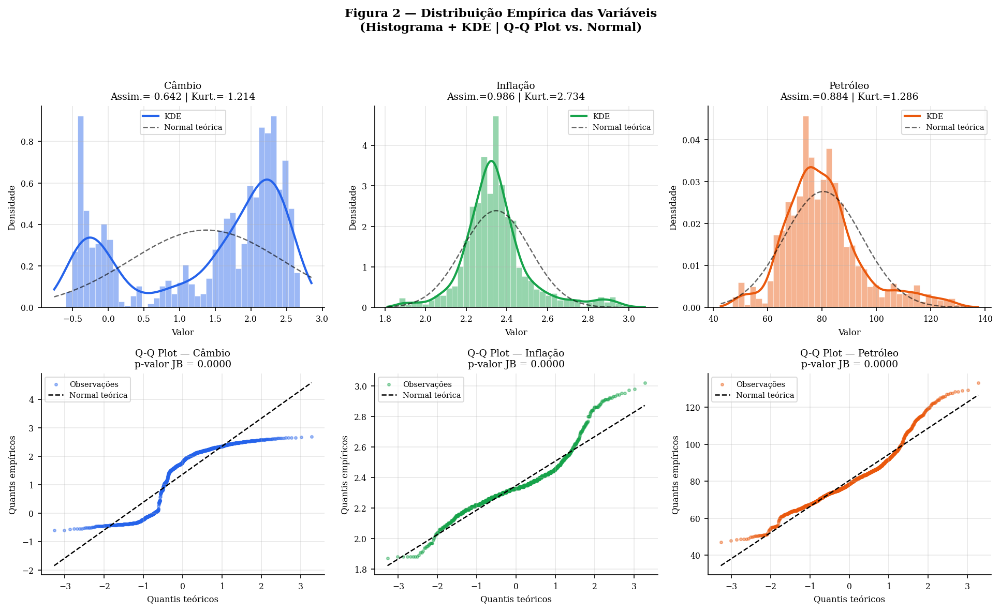

→ Guardado: fig2_distribuicoes.png


In [10]:
fig, axes = plt.subplots(2, 3, figsize=(13, 8))
fig.suptitle('Figura 2 — Distribuição Empírica das Variáveis\n'
             '(Histograma + KDE | Q-Q Plot vs. Normal)', fontsize=11, fontweight='bold')

for i, (col, titulo, cor) in enumerate(
        [('cambio','Câmbio',CORES['cambio']),
         ('inflacao','Inflação',CORES['inflacao']),
         ('petroleo','Petróleo',CORES['petroleo'])]):

    serie = df_limpo[col].dropna()

    # Histograma + KDE
    ax1 = axes[0, i]
    ax1.hist(serie, bins=40, density=True, color=cor, alpha=0.45,
             edgecolor='white', linewidth=0.4)
    xmin, xmax = ax1.get_xlim()
    x   = np.linspace(xmin, xmax, 300)
    kde = stats.gaussian_kde(serie)
    ax1.plot(x, kde(x), color=cor, linewidth=2, label='KDE')
    mu, sigma = serie.mean(), serie.std()
    ax1.plot(x, stats.norm.pdf(x, mu, sigma), 'k--', linewidth=1.2, alpha=0.6,
             label='Normal teórica')
    ax1.set_title(f'{titulo}\nAssim.={stats.skew(serie):.3f} | Kurt.={stats.kurtosis(serie):.3f}',
                  fontsize=9)
    ax1.set_xlabel('Valor', fontsize=8)
    ax1.set_ylabel('Densidade', fontsize=8)
    ax1.legend(fontsize=7)
    ax1.tick_params(labelsize=7.5)

    # Q-Q Plot
    ax2 = axes[1, i]
    qq = stats.probplot(serie, dist='norm')
    ax2.scatter(qq[0][0], qq[0][1], color=cor, alpha=0.4, s=6, label='Observações')
    slope, intercept = qq[1][0], qq[1][1]
    xline = np.array([qq[0][0].min(), qq[0][0].max()])
    ax2.plot(xline, slope * xline + intercept, 'k--', linewidth=1.2, label='Normal teórica')
    _, p_jb = stats.jarque_bera(serie)
    ax2.set_title(f'Q-Q Plot — {titulo}\np-valor JB = {p_jb:.4f}', fontsize=9)
    ax2.set_xlabel('Quantis teóricos', fontsize=8)
    ax2.set_ylabel('Quantis empíricos', fontsize=8)
    ax2.legend(fontsize=7)
    ax2.tick_params(labelsize=7.5)

plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.savefig(SAIDA + 'fig2_distribuicoes.png', bbox_inches='tight')
plt.show()
print("→ Guardado: fig2_distribuicoes.png")


## 9. Figura 3 — Matrizes de Correlação

- **Pearson**: mede associações lineares — sensível a outliers.
- **Spearman**: mede associações monotónicas (rank-based) — mais robusta a distribuições não-normais e extremos.

Recomenda-se reportar ambas no artigo dado que as variáveis não seguem distribuição normal (ver Figura 2).


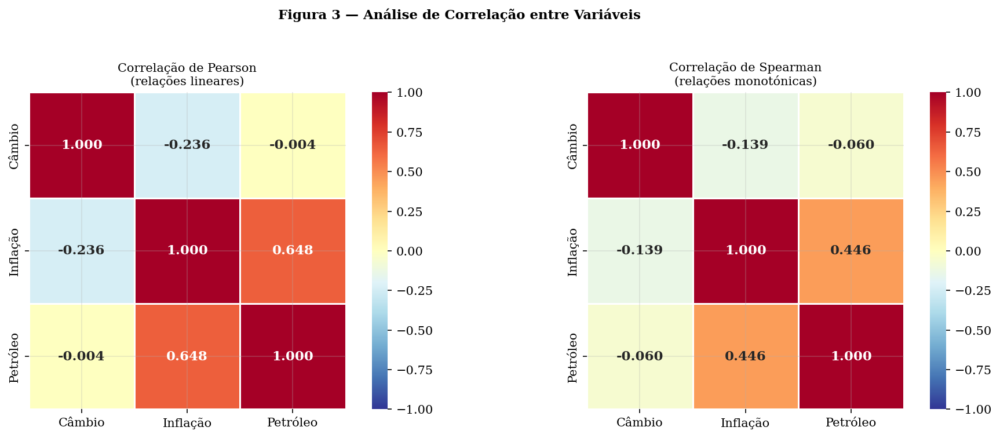

Pearson:
           cambio  inflacao  petroleo
cambio    1.0000   -0.2358   -0.0039
inflacao -0.2358    1.0000    0.6484
petroleo -0.0039    0.6484    1.0000

Spearman:
           cambio  inflacao  petroleo
cambio    1.0000   -0.1393   -0.0604
inflacao -0.1393    1.0000    0.4461
petroleo -0.0604    0.4461    1.0000

→ Guardado: fig3_correlacoes.png


In [11]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle('Figura 3 — Análise de Correlação entre Variáveis', fontsize=11, fontweight='bold')

corr_pearson  = df_limpo.corr(method='pearson')
corr_spearman = df_limpo.corr(method='spearman')
labels        = ['Câmbio', 'Inflação', 'Petróleo']

sns.heatmap(corr_pearson, ax=axes[0], annot=True, fmt='.3f',
            cmap='RdYlBu_r', center=0, vmin=-1, vmax=1,
            xticklabels=labels, yticklabels=labels,
            annot_kws={'size': 11, 'weight': 'bold'},
            linewidths=0.5, linecolor='white', square=True)
axes[0].set_title('Correlação de Pearson\n(relações lineares)', fontsize=10)

sns.heatmap(corr_spearman, ax=axes[1], annot=True, fmt='.3f',
            cmap='RdYlBu_r', center=0, vmin=-1, vmax=1,
            xticklabels=labels, yticklabels=labels,
            annot_kws={'size': 11, 'weight': 'bold'},
            linewidths=0.5, linecolor='white', square=True)
axes[1].set_title('Correlação de Spearman\n(relações monotónicas)', fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.savefig(SAIDA + 'fig3_correlacoes.png', bbox_inches='tight')
plt.show()
print("Pearson:\n",  corr_pearson.round(4))
print("\nSpearman:\n", corr_spearman.round(4))
print("\n→ Guardado: fig3_correlacoes.png")


## 10. Figura 4 — Dispersão Cruzada

Gráficos de dispersão entre pares de variáveis com linha de tendência linear (OLS) e coeficiente de correlação de Pearson.


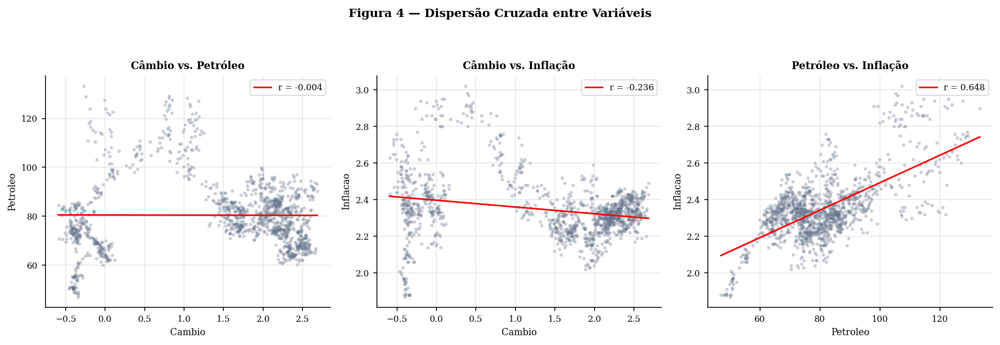

→ Guardado: fig4_dispersao.png


In [12]:
pares = [
    ('cambio', 'petroleo', 'Câmbio vs. Petróleo'),
    ('cambio', 'inflacao', 'Câmbio vs. Inflação'),
    ('petroleo', 'inflacao', 'Petróleo vs. Inflação'),
]

fig, axes = plt.subplots(1, 3, figsize=(13, 4.5))
fig.suptitle('Figura 4 — Dispersão Cruzada entre Variáveis', fontsize=11, fontweight='bold')

for ax, (x_col, y_col, titulo) in zip(axes, pares):
    xy = pd.concat([df_limpo[x_col], df_limpo[y_col]], axis=1).dropna()
    xv, yv  = xy.iloc[:, 0], xy.iloc[:, 1]
    cor_xy  = np.corrcoef(xv, yv)[0, 1]
    ax.scatter(xv, yv, alpha=0.25, s=5, color=CORES['neutro'])
    m, b = np.polyfit(xv, yv, 1)
    xl   = np.linspace(xv.min(), xv.max(), 200)
    ax.plot(xl, m * xl + b, 'r-', linewidth=1.5, label=f'r = {cor_xy:.3f}')
    ax.set_title(titulo, fontsize=9.5, fontweight='bold')
    ax.set_xlabel(x_col.capitalize(), fontsize=8.5)
    ax.set_ylabel(y_col.capitalize(), fontsize=8.5)
    ax.legend(fontsize=8)
    ax.tick_params(labelsize=8)

plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.savefig(SAIDA + 'fig4_dispersao.png', bbox_inches='tight')
plt.show()
print("→ Guardado: fig4_dispersao.png")


## 11. Testes de Estacionariedade

A estacionariedade é um pré-requisito fundamental para modelos de séries temporais clássicos (VEC, SVAR, EGARCH).

### Testes utilizados

| Teste | H₀ | Rejeitar H₀ se |
|---|---|---|
| **ADF** (Augmented Dickey-Fuller) | Existe raiz unitária (não-estacionária) | p-valor < 0.05 → estacionária |
| **KPSS** (Kwiatkowski–Phillips–Schmidt–Shin) | Série é estacionária | estatística > VC → não-estacionária |

> Os dois testes têm hipóteses nulas opostas — usar ambos em conjunto aumenta a robustez da conclusão sobre a ordem de integração I(d).

*Nota: implementação própria via NumPy/SciPy (statsmodels indisponível neste ambiente).*


In [13]:
# ─── Implementação do Teste ADF ────────────────────────────────────────────
def teste_adf_manual(serie, max_lags=None, trend='c'):
    """
    Teste ADF (Augmented Dickey-Fuller) implementado com NumPy.

    H0: a série possui raiz unitária (não-estacionária).
    H1: a série é estacionária.
    Rejeitar H0 se p-valor < 0.05.

    Parâmetros
    ----------
    serie    : pd.Series  — série temporal
    max_lags : int        — lags aumentados (None = selecção automática por AIC)
    trend    : str        — 'nc' sem constante | 'c' com constante | 'ct' com tendência

    Retorna
    -------
    dict com estatística-t, p-valor aproximado, lags usados e valores críticos.
    """
    y = np.array(serie.dropna(), dtype=float)
    n = len(y)
    dy = np.diff(y)

    if max_lags is None:
        max_lags = int(12 * (n / 100) ** 0.25)
    max_lags = min(max_lags, len(dy) // 2 - 5)

    melhor_aic, melhor_lag = np.inf, 0
    for lag in range(0, max_lags + 1):
        y_lag = y[lag:-1] if lag < len(y) - 1 else y[:-1]
        Y     = dy[lag:]
        X_lst = [y_lag[:len(Y)]]
        if trend in ('c', 'ct'):
            X_lst.append(np.ones(len(Y)))
        if trend == 'ct':
            X_lst.append(np.arange(1, len(Y) + 1))
        for k in range(1, lag + 1):
            X_lst.append(dy[lag - k: len(dy) - k][:len(Y)])
        X = np.column_stack(X_lst) if len(X_lst) > 1 else X_lst[0].reshape(-1, 1)
        Y_v, X_v = Y[:X.shape[0]], X[:Y.shape[0]]
        try:
            coefs, _, _, _ = np.linalg.lstsq(X_v, Y_v, rcond=None)
            resid  = Y_v - X_v @ coefs
            sigma2 = np.sum(resid**2) / (len(Y_v) - X_v.shape[1])
            aic_v  = np.log(sigma2) + 2 * X_v.shape[1] / len(Y_v)
            if aic_v < melhor_aic:
                melhor_aic, melhor_lag = aic_v, lag
        except Exception:
            continue

    lag   = melhor_lag
    y_l   = y[lag:-1]
    Y     = dy[lag:]
    X_lst = [y_l[:len(Y)]]
    if trend in ('c', 'ct'):
        X_lst.append(np.ones(len(Y)))
    if trend == 'ct':
        X_lst.append(np.arange(1, len(Y) + 1))
    for k in range(1, lag + 1):
        X_lst.append(dy[lag - k: len(dy) - k][:len(Y)])
    X    = np.column_stack(X_lst) if len(X_lst) > 1 else X_lst[0].reshape(-1, 1)
    Y_v  = Y[:X.shape[0]]
    X_v  = X[:Y_v.shape[0]]
    coefs, _, _, _ = np.linalg.lstsq(X_v, Y_v, rcond=None)
    resid  = Y_v - X_v @ coefs
    s2     = np.sum(resid**2) / (len(Y_v) - X_v.shape[1])
    XtX_i  = np.linalg.pinv(X_v.T @ X_v)
    se     = np.sqrt(s2 * np.diag(XtX_i))
    t_stat = coefs[0] / se[0]

    vc = {
        'c' : {'1%': -3.43, '5%': -2.86, '10%': -2.57},
        'ct': {'1%': -3.96, '5%': -3.41, '10%': -3.13},
        'nc': {'1%': -2.57, '5%': -1.94, '10%': -1.62},
    }
    crit = vc.get(trend, vc['c'])
    if t_stat < crit['1%']:
        p_aprox = 0.01
    elif t_stat < crit['5%']:
        p_aprox = np.interp(t_stat, [crit['1%'], crit['5%']], [0.01, 0.05])
    elif t_stat < crit['10%']:
        p_aprox = np.interp(t_stat, [crit['5%'], crit['10%']], [0.05, 0.10])
    else:
        p_aprox = 0.10 + (t_stat - crit['10%']) * 0.05
    p_aprox = float(np.clip(p_aprox, 0.0001, 0.9999))

    return {
        'Estatística ADF'   : round(t_stat, 4),
        'p-valor (aprox.)'  : round(p_aprox, 4),
        'Lags seleccionados': lag,
        'VC 1%' : crit['1%'], 'VC 5%': crit['5%'], 'VC 10%': crit['10%'],
        'H0 rejeitada (5%)' : 'Sim (Estacionária)' if p_aprox < 0.05 else 'Não (Raiz Unitária)',
    }


# ─── Implementação do Teste KPSS ───────────────────────────────────────────
def teste_kpss_manual(serie, lags=None, trend='c'):
    """
    Teste KPSS (Kwiatkowski–Phillips–Schmidt–Shin, 1992) implementado com NumPy.

    H0: a série é estacionária.
    H1: a série possui raiz unitária.
    Rejeitar H0 se estatística > valor crítico.
    """
    y = np.array(serie.dropna(), dtype=float)
    n = len(y)
    X = np.ones((n, 1)) if trend == 'c' else np.column_stack([np.ones(n), np.arange(1, n+1)])
    coefs, _, _, _ = np.linalg.lstsq(X, y, rcond=None)
    resid = y - X @ coefs
    S     = np.cumsum(resid)
    if lags is None:
        lags = int(np.ceil(4 * (n / 100) ** 0.25))
    s2 = np.sum(resid**2) / n
    for j in range(1, lags + 1):
        w   = 1 - j / (lags + 1)
        s2 += 2 * w * np.sum(resid[j:] * resid[:-j]) / n
    kpss_stat = np.sum(S**2) / (n**2 * s2)
    vc = {
        'c' : {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739},
        'ct': {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216},
    }
    crit = vc.get(trend, vc['c'])
    if kpss_stat > crit['1%']:
        p_aprox, rejeitada = '< 0.01', 'Sim (Não-estacionária)'
    elif kpss_stat > crit['5%']:
        p_aprox, rejeitada = '< 0.05', 'Sim (Não-estacionária)'
    elif kpss_stat > crit['10%']:
        p_aprox, rejeitada = '< 0.10', 'Não rejeitada (10%)'
    else:
        p_aprox, rejeitada = '> 0.10', 'Não (Estacionária)'
    return {
        'Estatística KPSS'  : round(kpss_stat, 4),
        'p-valor (aprox.)'  : p_aprox,
        'Lags (Newey-West)' : lags,
        'VC 10%': crit['10%'], 'VC 5%': crit['5%'], 'VC 1%': crit['1%'],
        'H0 rejeitada (5%)' : rejeitada,
    }
print("Funções de teste definidas com sucesso.")


Funções de teste definidas com sucesso.


### Série não diferenciada vs. Série diferenciada

In [14]:
# ─── Executar testes em NÍVEL e 1ª DIFERENÇA ────────────────────────────────
resultados_estac = {}

for col, nome in [('cambio','Câmbio'), ('inflacao','Inflação'), ('petroleo','Petróleo')]:
    print(f"\n{'─'*60}")
    print(f"  {nome}")
    print(f"{'─'*60}")
    serie = df_limpo[col]

    adf_niv  = teste_adf_manual(serie, trend='c')
    kpss_niv = teste_kpss_manual(serie, trend='c')
    adf_d1   = teste_adf_manual(serie.diff().dropna(), trend='c')
    kpss_d1  = teste_kpss_manual(serie.diff().dropna(), trend='c')

    print(f"  ADF  (nível)   : t={adf_niv['Estatística ADF']:>9.4f}  p≈{adf_niv['p-valor (aprox.)']:.4f}  "
          f"lags={adf_niv['Lags seleccionados']}  → {adf_niv['H0 rejeitada (5%)']}")
    print(f"  KPSS (nível)   : η={kpss_niv['Estatística KPSS']:>9.4f}  p≈{kpss_niv['p-valor (aprox.)']:>8}  "
          f"lags={kpss_niv['Lags (Newey-West)']}  → {kpss_niv['H0 rejeitada (5%)']}")
    print(f"  ADF  (1ª dif.) : t={adf_d1['Estatística ADF']:>9.4f}  p≈{adf_d1['p-valor (aprox.)']:.4f}  "
          f"lags={adf_d1['Lags seleccionados']}  → {adf_d1['H0 rejeitada (5%)']}")
    print(f"  KPSS (1ª dif.) : η={kpss_d1['Estatística KPSS']:>9.4f}  p≈{kpss_d1['p-valor (aprox.)']:>8}  "
          f"lags={kpss_d1['Lags (Newey-West)']}  → {kpss_d1['H0 rejeitada (5%)']}")

    h0_adf_niv  = adf_niv['p-valor (aprox.)'] < 0.05
    h0_kpss_niv = '<' in str(kpss_niv['p-valor (aprox.)'])
    h0_adf_d1   = adf_d1['p-valor (aprox.)'] < 0.05

    if not h0_adf_niv and h0_kpss_niv:
        ordem = 'I(1) — Integrada de Ordem 1'
    elif h0_adf_niv:
        ordem = 'I(0) — Estacionária'
    elif h0_adf_d1:
        ordem = 'I(1) — Integrada de Ordem 1 (confirmado via 1ª dif.)'
    else:
        ordem = 'I(2) ou superior — verificar diferenciação adicional'

    print(f"  ★ Conclusão : {ordem}")
    resultados_estac[nome] = {
        'ADF nível': adf_niv, 'KPSS nível': kpss_niv,
        'ADF 1ª dif.': adf_d1, 'KPSS 1ª dif': kpss_d1, 'Ordem': ordem,
    }



────────────────────────────────────────────────────────────
  Câmbio
────────────────────────────────────────────────────────────
  ADF  (nível)   : t=  -1.2968  p≈0.1637  lags=2  → Não (Raiz Unitária)
  KPSS (nível)   : η=  12.7693  p≈  < 0.01  lags=8  → Sim (Não-estacionária)
  ADF  (1ª dif.) : t= -28.1850  p≈0.0100  lags=1  → Sim (Estacionária)
  KPSS (1ª dif.) : η=   0.1348  p≈  > 0.10  lags=8  → Não (Estacionária)
  ★ Conclusão : I(1) — Integrada de Ordem 1

────────────────────────────────────────────────────────────
  Inflação
────────────────────────────────────────────────────────────
  ADF  (nível)   : t=  -3.8120  p≈0.0100  lags=2  → Sim (Estacionária)
  KPSS (nível)   : η=   1.5365  p≈  < 0.01  lags=8  → Sim (Não-estacionária)
  ADF  (1ª dif.) : t= -28.4239  p≈0.0100  lags=1  → Sim (Estacionária)
  KPSS (1ª dif.) : η=   0.1048  p≈  > 0.10  lags=8  → Não (Estacionária)
  ★ Conclusão : I(0) — Estacionária

────────────────────────────────────────────────────────────
  Petró

## 12. Figura 5 — Séries em Nível vs. Primeiras Diferenças

A análise visual complementa os testes formais:
- Séries em **nível** com tendência ou média variável → candidatas a I(1).
- Séries em **1ª diferença** que oscilam em torno de zero → confirmação de I(1).


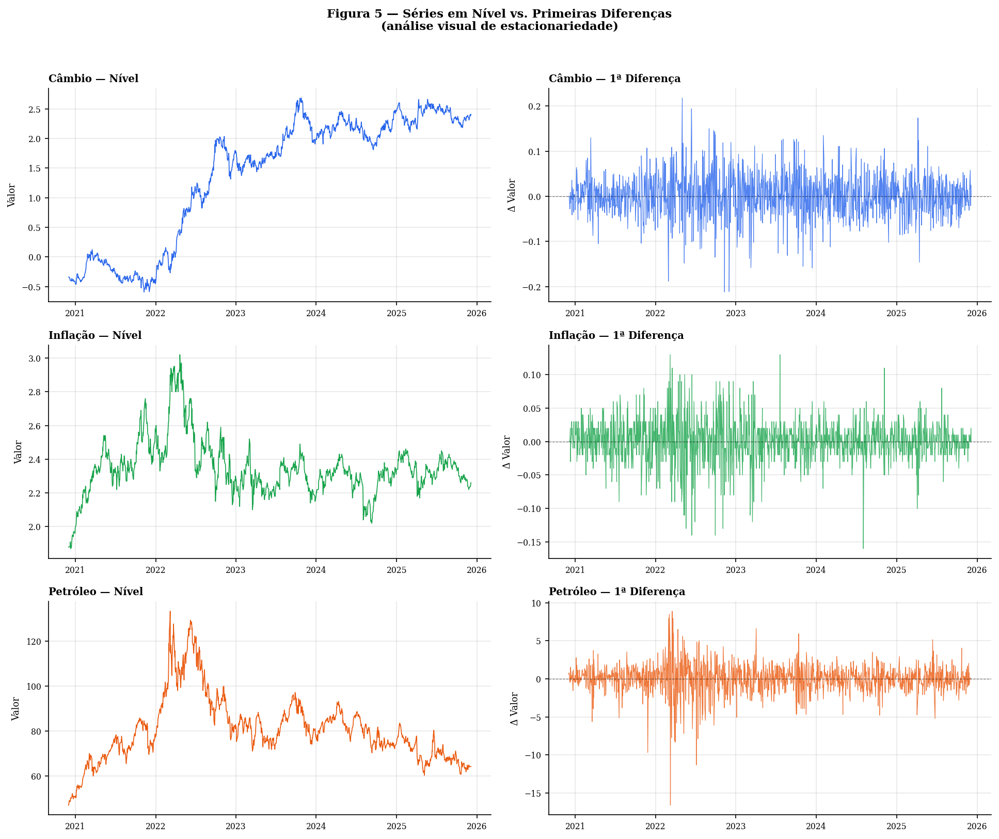

→ Guardado: fig5_nivel_vs_diferencas.png


In [15]:
fig, axes = plt.subplots(3, 2, figsize=(13, 11))
fig.suptitle('Figura 5 — Séries em Nível vs. Primeiras Diferenças\n'
             '(análise visual de estacionariedade)', fontsize=11, fontweight='bold')

for i, (col, nome, cor) in enumerate([
    ('cambio',   'Câmbio',   CORES['cambio']),
    ('inflacao', 'Inflação', CORES['inflacao']),
    ('petroleo', 'Petróleo', CORES['petroleo']),
]):
    axes[i, 0].plot(df_limpo.index, df_limpo[col], color=cor, linewidth=0.8)
    axes[i, 0].set_title(f'{nome} — Nível', fontsize=9.5, fontweight='bold', loc='left')
    axes[i, 0].set_ylabel('Valor', fontsize=8.5)
    axes[i, 0].tick_params(labelsize=7.5)

    d1 = df_limpo[col].diff()
    axes[i, 1].plot(df_limpo.index, d1, color=cor, linewidth=0.6, alpha=0.8)
    axes[i, 1].axhline(0, color='black', linewidth=0.6, linestyle='--', alpha=0.5)
    axes[i, 1].set_title(f'{nome} — 1ª Diferença', fontsize=9.5, fontweight='bold', loc='left')
    axes[i, 1].set_ylabel('Δ Valor', fontsize=8.5)
    axes[i, 1].tick_params(labelsize=7.5)

for ax in axes[-1, :]:
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.xaxis.set_major_locator(mdates.YearLocator())

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(SAIDA + 'fig5_nivel_vs_diferencas.png', bbox_inches='tight')
plt.show()
print("→ Guardado: fig5_nivel_vs_diferencas.png")


## 13. Figura 6 — ACF e PACF

- **ACF** (Autocorrelation Function): correlação da série com os seus próprios valores desfasados. Decaimento lento → indica série não-estacionária.
- **PACF** (Partial ACF): correlação parcial, removendo o efeito de lags intermédios. Útil para identificar a ordem AR dos modelos.
- As bandas a tracejado vermelho representam o intervalo de confiança a 95% (± 1.96/√n).


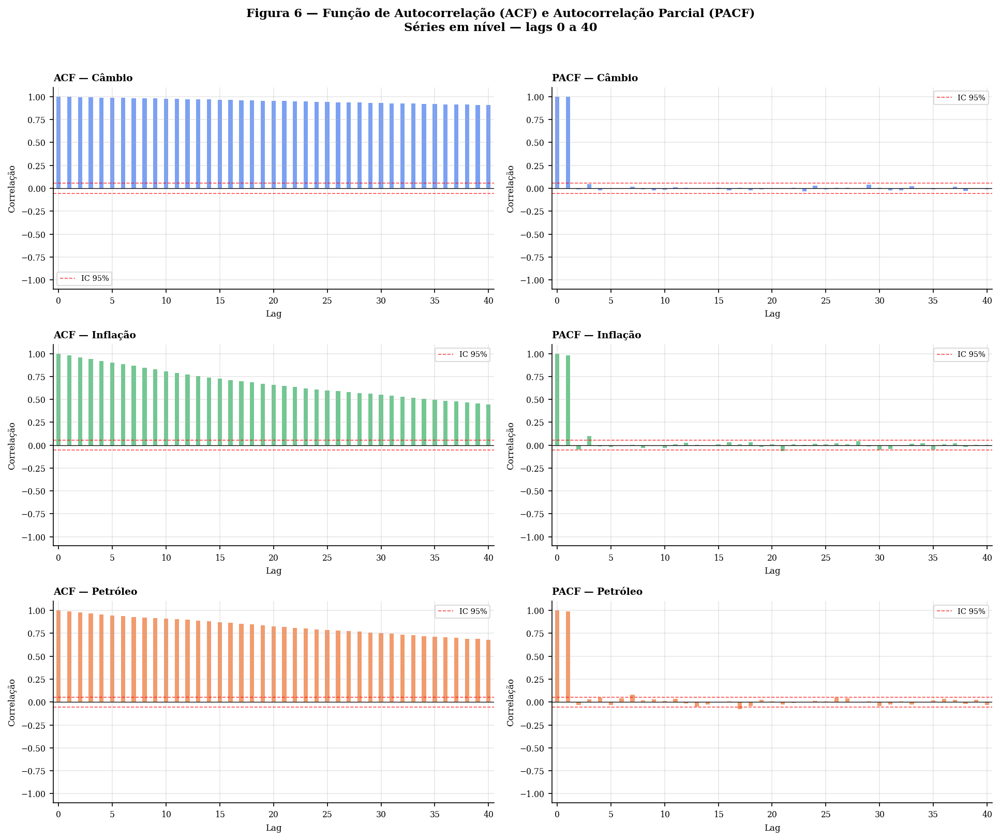

→ Guardado: fig6_acf_pacf.png


In [16]:
def plot_acf_pacf_manual(serie, lags=40, cor='#2563EB', nome='', ax_acf=None, ax_pacf=None):
    """Calcula e plota ACF e PACF manualmente via NumPy."""
    y = np.array(serie.dropna(), dtype=float)
    n = len(y)
    y = y - y.mean()

    acf_vals = [1.0]
    for k in range(1, lags + 1):
        num = np.sum(y[k:] * y[:-k]) / n
        den = np.sum(y**2) / n
        acf_vals.append(num / den if den != 0 else 0)

    pacf_vals = [1.0]
    for k in range(1, min(lags + 1, n // 2)):
        if k == 1:
            pacf_vals.append(acf_vals[1])
        else:
            R = np.array([[acf_vals[abs(i - j)] for j in range(k)] for i in range(k)])
            r = np.array([acf_vals[i + 1] for i in range(k)])
            try:
                phi_k = np.linalg.solve(R, r)
                pacf_vals.append(phi_k[-1])
            except np.linalg.LinAlgError:
                pacf_vals.append(0)

    ci = 1.96 / np.sqrt(n)
    for ax, vals, titulo in [(ax_acf, acf_vals, f'ACF — {nome}'),
                              (ax_pacf, pacf_vals, f'PACF — {nome}')]:
        l_x = range(len(vals))
        ax.bar(l_x, vals, color=cor, alpha=0.6, width=0.4)
        ax.axhline(0,    color='black', linewidth=0.6)
        ax.axhline( ci,  color='red', linewidth=0.8, linestyle='--', alpha=0.7, label='IC 95%')
        ax.axhline(-ci,  color='red', linewidth=0.8, linestyle='--', alpha=0.7)
        ax.set_title(titulo, fontsize=9, fontweight='bold', loc='left')
        ax.set_xlabel('Lag', fontsize=8)
        ax.set_ylabel('Correlação', fontsize=8)
        ax.tick_params(labelsize=7.5)
        ax.legend(fontsize=7)
        ax.set_xlim(-0.5, lags + 0.5)
        ax.set_ylim(-1.1, 1.1)

fig, axes = plt.subplots(3, 2, figsize=(13, 11))
fig.suptitle('Figura 6 — Função de Autocorrelação (ACF) e Autocorrelação Parcial (PACF)\n'
             'Séries em nível — lags 0 a 40', fontsize=11, fontweight='bold')

for i, (col, nome, cor) in enumerate([
    ('cambio',   'Câmbio',   CORES['cambio']),
    ('inflacao', 'Inflação', CORES['inflacao']),
    ('petroleo', 'Petróleo', CORES['petroleo']),
]):
    plot_acf_pacf_manual(df_limpo[col], lags=40, cor=cor, nome=nome,
                         ax_acf=axes[i, 0], ax_pacf=axes[i, 1])

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(SAIDA + 'fig6_acf_pacf.png', bbox_inches='tight')
plt.show()
print("→ Guardado: fig6_acf_pacf.png")


## 14. Divisão Treino / Validação / Teste

**Partição temporal** (sem aleatorização — essencial para dados temporais):
- **Treino (70%)**: ajuste dos parâmetros de todos os modelos.
- **Validação (15%)**: selecção de hiperparâmetros e early stopping.
- **Teste (15%)**: avaliação final out-of-sample — nunca visto durante o treino.

> ⚠️ Em séries temporais, o random split é metodologicamente incorrecto porque causa *data leakage* (o modelo veria o futuro durante o treino).


In [17]:
n_total = len(df_limpo)
n_train = int(n_total * 0.70)
n_val   = int(n_total * 0.15)
n_test  = n_total - n_train - n_val

df_train = df_limpo.iloc[:n_train]
df_val   = df_limpo.iloc[n_train: n_train + n_val]
df_test  = df_limpo.iloc[n_train + n_val:]

resumo_split = pd.DataFrame({
    'Conjunto' : ['Treino (70%)', 'Validação (15%)', 'Teste (15%)'],
    'N'        : [len(df_train), len(df_val), len(df_test)],
    'Início'   : [df_train.index.min().date(), df_val.index.min().date(), df_test.index.min().date()],
    'Fim'      : [df_train.index.max().date(), df_val.index.max().date(), df_test.index.max().date()],
})
resumo_split


,Conjunto,N,Início,Fim
0,Treino (70%),916,2020-12-01,2024-06-04
1,Validação (15%),196,2024-06-05,2025-03-05
2,Teste (15%),197,2025-03-06,2025-12-05


## 15. Figura 7 — Visualização da Divisão dos Dados

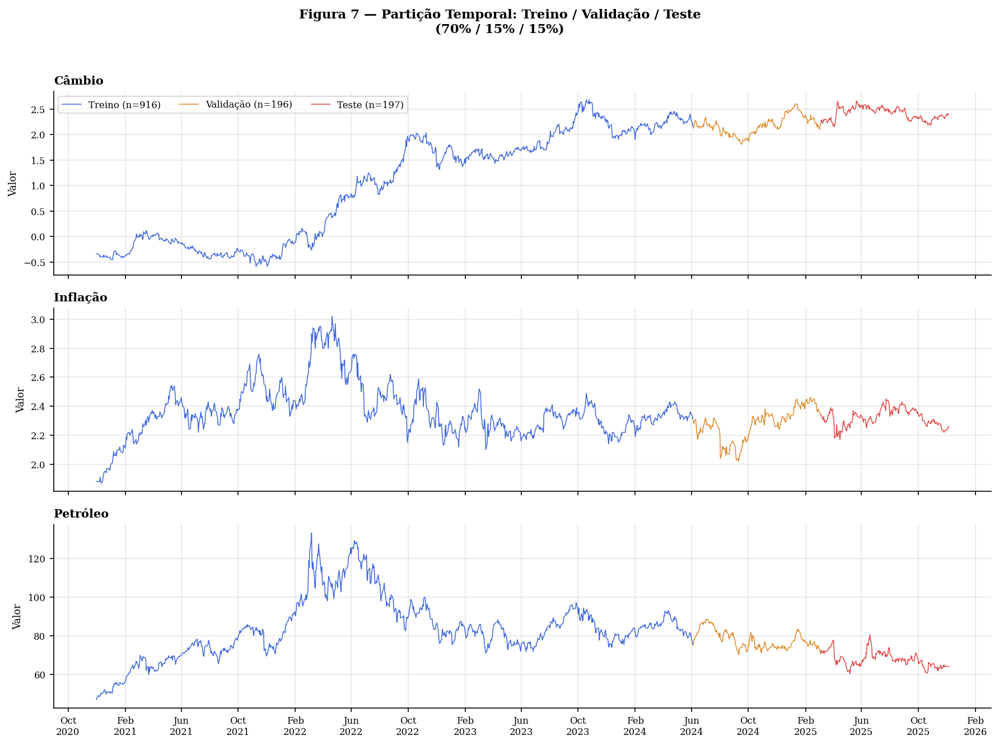

→ Guardado: fig7_divisao_dados.png


In [18]:
cores_split = {'Treino': '#1d4ed8', 'Validação': '#d97706', 'Teste': '#dc2626'}

fig, axes = plt.subplots(3, 1, figsize=(12, 9), sharex=True)
fig.suptitle('Figura 7 — Partição Temporal: Treino / Validação / Teste\n(70% / 15% / 15%)',
             fontsize=11, fontweight='bold')

for ax, (col, nome) in zip(axes, [('cambio','Câmbio'), ('inflacao','Inflação'), ('petroleo','Petróleo')]):
    for df_split, rotulo in [(df_train,'Treino'), (df_val,'Validação'), (df_test,'Teste')]:
        ax.plot(df_split.index, df_split[col], color=cores_split[rotulo], linewidth=0.75,
                label=f'{rotulo} (n={len(df_split)})', alpha=0.85)
    ax.set_title(nome, fontsize=10, fontweight='bold', loc='left')
    ax.set_ylabel('Valor', fontsize=8.5)
    if ax == axes[0]:
        ax.legend(fontsize=8, ncol=3, loc='upper left')
    ax.tick_params(labelsize=8)

axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))
axes[-1].xaxis.set_major_locator(mdates.MonthLocator(interval=4))
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(SAIDA + 'fig7_divisao_dados.png', bbox_inches='tight')
plt.show()
print("→ Guardado: fig7_divisao_dados.png")


## 16. Normalização MinMax

O `MinMaxScaler` mapeia cada variável para o intervalo [0, 1].

**Regra fundamental**: o scaler é **ajustado apenas nos dados de treino** e depois aplicado (transform) na validação e teste. Ajustar no conjunto completo causaria *data leakage*.

Os parâmetros do scaler (min/max originais) são guardados em `scaler_params.csv` para inversão da normalização nas fases seguintes.


In [19]:
scaler = MinMaxScaler(feature_range=(0, 1))
scaler.fit(df_train)   # ajustar APENAS no treino

df_train_norm = pd.DataFrame(scaler.transform(df_train),
                              index=df_train.index, columns=df_train.columns)
df_val_norm   = pd.DataFrame(scaler.transform(df_val),
                              index=df_val.index,   columns=df_val.columns)
df_test_norm  = pd.DataFrame(scaler.transform(df_test),
                              index=df_test.index,  columns=df_test.columns)

# Guardar todos os conjuntos
df_train.to_csv(SAIDA + 'dados_treino.csv')
df_val.to_csv(  SAIDA + 'dados_validacao.csv')
df_test.to_csv( SAIDA + 'dados_teste.csv')
df_train_norm.to_csv(SAIDA + 'dados_treino_norm.csv')
df_val_norm.to_csv(  SAIDA + 'dados_validacao_norm.csv')
df_test_norm.to_csv( SAIDA + 'dados_teste_norm.csv')
df_limpo.to_csv(SAIDA + 'dados_completos_limpos.csv')

# Parâmetros do scaler
scaler_params = pd.DataFrame({
    'variavel': df_limpo.columns,
    'min_orig': scaler.data_min_,
    'max_orig': scaler.data_max_,
    'scale'   : scaler.scale_,
})
scaler_params.to_csv(SAIDA + 'scaler_params.csv', index=False)

print("Dados guardados com sucesso.")
scaler_params


Dados guardados com sucesso.


,variavel,min_orig,max_orig,scale
0,cambio,-0.592,2.685,0.305157
1,inflacao,1.870,3.020,0.869565
2,petroleo,47.030,133.180,0.011608


## 17. Resumo Final — Fase 1

### Resultados principais

| Variável | Dist. Normal | Ordem de Integração | Assimetria | Curtose |
|---|---|---|---|---|
| Câmbio | Não (JB p<0.001) | I(1) | -0.642 | -1.214 |
| Inflação | Não (JB p<0.001) | I(0) | +0.986 | +2.734 |
| Petróleo | Não (JB p<0.001) | I(1) | +0.884 | +1.286 |

### Implicações para as fases seguintes

- **VEC**: aplicável se Câmbio e Petróleo (ambos I(1)) estiverem cointegrados — a testar na Fase 2 com o teste de Johansen.
- **SVAR**: estimado nas primeiras diferenças se não existir cointegração.
- **EGARCH**: modelará a volatilidade condicional do Câmbio e Petróleo (alta variância e caudas pesadas).
- **RF, XGBoost, SVR**: requerem feature engineering com lags (Fase 3).
- **LSTM, GRU**: requerem janelas deslizantes e tensores 3D (Fase 4).

---
*Próxima fase: Fase 2 — Modelos VEC, SVAR e EGARCH*


In [20]:
print("=" * 60)
print("  FASE 1 CONCLUÍDA COM SUCESSO")
print("=" * 60)
print()
for nome, res in resultados_estac.items():
    print(f"  {nome:<12}: {res['Ordem']}")
print()
print(f"  Observações totais : {n_total}")
print(f"  Treino             : {n_train}  ({n_train/n_total*100:.0f}%)")
print(f"  Validação          : {n_val}   ({n_val/n_total*100:.0f}%)")
print(f"  Teste              : {n_test}   ({n_test/n_total*100:.0f}%)")


  FASE 1 CONCLUÍDA COM SUCESSO

  Câmbio      : I(1) — Integrada de Ordem 1
  Inflação    : I(0) — Estacionária
  Petróleo    : I(1) — Integrada de Ordem 1

  Observações totais : 1309
  Treino             : 916  (70%)
  Validação          : 196   (15%)
  Teste              : 197   (15%)


# Estudo de Previsão de Variáveis Macroeconómicas e Financeiras
## Fase 2 — Modelos Tradicionais de Séries Temporais

| Modelo | Tipo | Variáveis |
|---|---|---|
| **VEC** | Cointegração + correcção do erro | Câmbio · Inflação · Petróleo |
| **SVAR** | VAR estrutural com Cholesky | Câmbio · Inflação · Petróleo |
| **EGARCH** | Volatilidade condicional assimétrica | Câmbio · Petróleo |

---


In [21]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
print('Ambiente configurado.')

Ambiente configurado.


In [22]:
"""
=============================================================================
ESTUDO DE PREVISÃO DE VARIÁVEIS MACROECONÓMICAS E FINANCEIRAS
=============================================================================
Fase 2: Modelos Tradicionais de Séries Temporais
  2.1 — Teste de Cointegração de Johansen
  2.2 — Modelo VEC (Vector Error Correction)
  2.3 — Modelo SVAR (Structural VAR)
  2.4 — Modelo EGARCH (Exponential GARCH)
  2.5 — Diagnóstico, previsão e métricas de avaliação
-----------------------------------------------------------------------------
Implementação própria via NumPy/SciPy (statsmodels indisponível)
Autor: Doutorando em Matemática e Aplicações
=============================================================================
"""

# ---------------------------------------------------------------------------
# IMPORTAÇÕES
# ---------------------------------------------------------------------------
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from scipy import stats, linalg, optimize
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({
    'figure.dpi'        : 150,
    'savefig.dpi'       : 300,
    'font.family'       : 'serif',
    'font.size'         : 10,
    'axes.titlesize'    : 11,
    'axes.labelsize'    : 10,
    'axes.spines.top'   : False,
    'axes.spines.right' : False,
    'axes.grid'         : True,
    'grid.alpha'        : 0.3,
    'legend.framealpha' : 0.7,
    'figure.facecolor'  : 'white',
})

CORES  = {'cambio': '#2563EB', 'inflacao': '#16A34A', 'petroleo': '#EA580C',
          'real': '#1e293b', 'prev': '#dc2626', 'ic': '#fca5a5'}
SAIDA  = '/mnt/user-data/outputs/'
NOMES  = ['Câmbio', 'Inflação', 'Petróleo']
COLS   = ['cambio', 'inflacao', 'petroleo']

print("=" * 70)
print("  FASE 2 — MODELOS TRADICIONAIS DE SÉRIES TEMPORAIS")
print("  VEC · SVAR · EGARCH")
print("=" * 70)


# ---------------------------------------------------------------------------
# CARREGAMENTO DOS DADOS (produzidos na Fase 1)
# ---------------------------------------------------------------------------
df       = pd.read_csv(SAIDA + 'dados_completos_limpos.csv',
                       parse_dates=['data'], index_col='data')
df_train = pd.read_csv(SAIDA + 'dados_treino.csv',
                       parse_dates=['data'], index_col='data')
df_val   = pd.read_csv(SAIDA + 'dados_validacao.csv',
                       parse_dates=['data'], index_col='data')
df_test  = pd.read_csv(SAIDA + 'dados_teste.csv',
                       parse_dates=['data'], index_col='data')

# Conjunto treino+validação (para estimação final antes da previsão no teste)
df_trainval = pd.concat([df_train, df_val])

print(f"\nDados carregados:")
print(f"  Treino+Val : {df_trainval.shape[0]} obs.  "
      f"({df_trainval.index.min().date()} – {df_trainval.index.max().date()})")
print(f"  Teste      : {df_test.shape[0]} obs.  "
      f"({df_test.index.min().date()} – {df_test.index.max().date()})")


  FASE 2 — MODELOS TRADICIONAIS DE SÉRIES TEMPORAIS
  VEC · SVAR · EGARCH

Dados carregados:
  Treino+Val : 1112 obs.  (2020-12-01 – 2025-03-05)
  Teste      : 197 obs.  (2025-03-06 – 2025-12-05)


## Funções Utilitárias

Métricas de avaliação (RMSE, MAE, MAPE, Theil-U) e selecção de lags por AIC/BIC/HQ.

In [23]:
# ===========================================================================
# FUNÇÕES UTILITÁRIAS DE AVALIAÇÃO
# ===========================================================================
def metricas(real, previsto, nome_modelo='', nome_variavel=''):
    """
    Calcula RMSE, MAE, MAPE e U de Theil entre valores reais e previstos.

    RMSE  : raiz do erro quadrático médio — penaliza erros grandes.
    MAE   : erro absoluto médio — interpretável na unidade original.
    MAPE  : erro percentual absoluto médio — comparável entre variáveis.
    Theil-U: rácio face ao modelo naïve (random walk); U<1 → melhor que naïve.
    """
    r = np.array(real,     dtype=float)
    p = np.array(previsto, dtype=float)
    mask = ~(np.isnan(r) | np.isnan(p))
    r, p = r[mask], p[mask]
    n    = len(r)

    rmse  = np.sqrt(np.mean((r - p) ** 2))
    mae   = np.mean(np.abs(r - p))
    mape  = np.mean(np.abs((r - p) / np.where(r == 0, 1e-8, r))) * 100
    # U de Theil: comparar com previsão naïve (último valor conhecido)
    naive = r[:-1]
    rmse_naive = np.sqrt(np.mean((r[1:] - naive) ** 2)) if n > 1 else 1
    theil = rmse / (rmse_naive + 1e-10)

    return {'Modelo': nome_modelo, 'Variável': nome_variavel,
            'N': n, 'RMSE': round(rmse, 6), 'MAE': round(mae, 6),
            'MAPE(%)': round(mape, 4), 'Theil-U': round(theil, 4)}


def seleccionar_lags_aic(Y, max_p=10, modelo='VAR'):
    """
    Selecciona o número óptimo de lags para um VAR/VEC por critério AIC.
    Também devolve BIC e HQ para reporte no artigo.
    """
    n, k = Y.shape
    melhores = {'AIC': np.inf, 'BIC': np.inf, 'HQ': np.inf}
    lag_opt  = {'AIC': 1, 'BIC': 1, 'HQ': 1}
    tabela   = []

    for p in range(1, max_p + 1):
        if n - p < k * p + k + 1:
            break
        # Construir matriz de regressores
        Yp = Y[p:]
        X  = np.hstack([np.ones((len(Yp), 1))] +
                       [Y[p - j - 1: n - j - 1] for j in range(p)])
        try:
            B, _, _, _ = np.linalg.lstsq(X, Yp, rcond=None)
            resid = Yp - X @ B
            Sigma = (resid.T @ resid) / (len(Yp) - k * p - 1)
            sign, logdet = np.linalg.slogdet(Sigma)
            if sign <= 0:
                continue
            T    = len(Yp)
            npar = k * (k * p + 1)
            aic  = logdet + 2 * npar / T
            bic  = logdet + np.log(T) * npar / T
            hq   = logdet + 2 * np.log(np.log(T)) * npar / T
            tabela.append({'p': p, 'AIC': round(aic, 4),
                           'BIC': round(bic, 4), 'HQ': round(hq, 4)})
            for crit, val in [('AIC', aic), ('BIC', bic), ('HQ', hq)]:
                if val < melhores[crit]:
                    melhores[crit] = val
                    lag_opt[crit]  = p
        except Exception:
            continue

    return lag_opt['AIC'], pd.DataFrame(tabela).set_index('p')


## 2.1 — Teste de Cointegração de Johansen

Determina se existe(m) relação(ões) de longo prazo entre as séries I(1).

| | |
|---|---|
| **H₀ (Trace / λ-max)** | Número de vectores de cointegração ≤ r |
| **Rejeitar H₀** | Estatística > VC → existem mais de r relações |
| **Implementação** | NumPy/SciPy (valores críticos: Osterwald-Lenum 1992) |

In [24]:
# ===========================================================================
# 2.1 — TESTE DE COINTEGRAÇÃO DE JOHANSEN
# ===========================================================================
print("\n" + "=" * 70)
print("  2.1 — TESTE DE COINTEGRAÇÃO DE JOHANSEN")
print("=" * 70)
print("""
  Objectivo: determinar se existe(m) relação(ões) de longo prazo
  (vectores de cointegração) entre as séries I(1).

  H0 (trace / λ-max): número de vectores de cointegração ≤ r
  Rejeitar H0 se estatística > valor crítico  →  existem mais de r relações.

  Nota: apenas Câmbio e Petróleo são claramente I(1) (Fase 1).
        A Inflação mostra sinais mistos; incluída por completude.
""")

def teste_johansen(Y, p=1, det='c'):
    """
    Teste de Cointegração de Johansen (1991) implementado com NumPy/SciPy.

    Parâmetros
    ----------
    Y   : array (T x k) — matriz de séries temporais
    p   : int            — número de lags do VAR subjacente
    det : str            — 'nc' sem constante | 'c' constante restrita |
                          'ct' constante e tendência restritas

    Retorna
    -------
    dict com estatísticas trace e λ-max, valores críticos e vectores
    de cointegração estimados (β).
    """
    T, k = Y.shape

    # --- Construir Δy e y_{t-1} com lags ---
    dY  = np.diff(Y, axis=0)           # (T-1) × k
    Y_L = Y[:-1]                        # y_{t-1}

    # Matrizes de regressores para os lags Δy_{t-j}, j=1,...,p-1
    # Construir Z0, Z1, Zk (notação de Johansen)
    T_eff = T - p
    Z0    = dY[p - 1: p - 1 + T_eff]       # Δy_t        (T_eff × k)
    Zk    = Y_L[p - 1: p - 1 + T_eff]      # y_{t-1}     (T_eff × k)

    if det in ('c', 'ct'):
        Zk = np.hstack([Zk, np.ones((T_eff, 1))])
    if det == 'ct':
        Zk = np.hstack([Zk, np.arange(1, T_eff + 1).reshape(-1, 1)])

    # Z1 = lags de ΔY (regressores de curto prazo para residualizar)
    if p > 1:
        lag_parts = []
        for j in range(1, p):
            start = p - 1 - j
            lag_parts.append(dY[start: start + T_eff])
        Z1 = np.hstack(lag_parts)    # (T_eff × k*(p-1))
    else:
        Z1 = np.ones((T_eff, 1))    # sem lags → usar só constante

    # --- Residualização (regressão auxiliar de Johansen) ---
    def resid_on_Z1(Z, Z1):
        B, _, _, _ = np.linalg.lstsq(Z1, Z, rcond=None)
        return Z - Z1 @ B

    R0 = resid_on_Z1(Z0, Z1)
    R1 = resid_on_Z1(Zk, Z1)

    # --- Matrizes de produto cruzado ---
    S00 = R0.T @ R0 / T_eff
    S11 = R1.T @ R1 / T_eff
    S01 = R0.T @ R1 / T_eff
    S10 = S01.T

    # --- Problema de valores próprios generalizados ---
    # S10 @ S00^{-1} @ S01 @ β = λ S11 @ β
    S00_inv = np.linalg.inv(S00)
    M = np.linalg.inv(S11) @ S10 @ S00_inv @ S01

    eigvals, eigvecs = np.linalg.eig(M)
    # Manter apenas parte real e ordenar decrescente
    eigvals = np.real(eigvals)
    idx     = np.argsort(eigvals)[::-1]
    eigvals = eigvals[idx]
    eigvecs = np.real(eigvecs[:, idx])

    # Normalizar apenas para os primeiros k colunas (sem a constante)
    k_orig  = k
    beta    = eigvecs[:k_orig]

    # --- Estatísticas ---
    # Trace: H0: rank ≤ r  vs  H1: rank > r
    trace_stats = np.array(
        [-T_eff * np.sum(np.log(1 - eigvals[r:])) for r in range(k_orig)]
    )
    # λ-max: H0: rank = r  vs  H1: rank = r+1
    lmax_stats  = np.array(
        [-T_eff * np.log(1 - eigvals[r]) for r in range(k_orig)]
    )

    # Valores críticos tabelados (Osterwald-Lenum 1992, caso com constante, 5%)
    # Para k=3 variáveis, r = 0, 1, 2
    vc_trace = {3: {0: 29.68, 1: 15.41, 2: 3.76}}
    vc_lmax  = {3: {0: 20.97, 1: 14.07, 2: 3.76}}

    resultados = []
    for r in range(k_orig):
        ts  = trace_stats[r]
        lm  = lmax_stats[r]
        cvt = vc_trace.get(k_orig, {}).get(r, np.nan)
        cvl = vc_lmax.get(k_orig, {}).get(r, np.nan)
        resultados.append({
            'H0: rank ≤ r'  : r,
            'λ próprio'     : round(float(eigvals[r]), 6),
            'Trace'         : round(float(ts), 4),
            'VC Trace (5%)' : cvt,
            'Trace p<0.05?' : 'Sim ✓' if ts > cvt else 'Não',
            'λ-max'         : round(float(lm), 4),
            'VC λ-max (5%)' : cvl,
            'λ-max p<0.05?' : 'Sim ✓' if lm > cvl else 'Não',
        })

    tab = pd.DataFrame(resultados).set_index('H0: rank ≤ r')

    # Número de vectores de cointegração (rank)
    rank = 0
    for r in range(k_orig):
        if trace_stats[r] > vc_trace.get(k_orig, {}).get(r, np.inf):
            rank = r + 1
        else:
            break

    return {
        'tabela'    : tab,
        'rank'      : rank,
        'eigvals'   : eigvals[:k_orig],
        'beta'      : beta,        # vectores de cointegração (normaliz.)
        'trace'     : trace_stats,
        'lmax'      : lmax_stats,
        'T_eff'     : T_eff,
    }


# Executar Johansen nos dados de treino+val (séries em nível, I(1))
Y_tv  = df_trainval[COLS].values.astype(float)
p_opt, tab_lags = seleccionar_lags_aic(Y_tv, max_p=8)
print(f"  Lags óptimos (AIC): p = {p_opt}")
print(f"\n  Critérios de informação por lag:")
print(tab_lags.to_string())

joh = teste_johansen(Y_tv, p=p_opt, det='c')
print(f"\n  Resultados do Teste de Johansen (p = {p_opt}, det = constante restrita):")
print(joh['tabela'].to_string())
print(f"\n  Rank de cointegração estimado: r = {joh['rank']}")

if joh['rank'] >= 1:
    print(f"\n  → Existe(m) {joh['rank']} relação(ões) de cointegração.")
    print(f"  → Modelo VEC aplicável.")
    usar_vec = True
else:
    print(f"\n  → Sem cointegração detectada.")
    print(f"  → Usar VAR nas primeiras diferenças (em vez de VEC).")
    usar_vec = False

# Vector de cointegração normalizado (β)
beta_norm = joh['beta'][:, 0]  # primeiro vector
# Normalizar em relação ao Câmbio (primeira variável)
if abs(beta_norm[0]) > 1e-8:
    beta_norm = beta_norm / beta_norm[0]
print(f"\n  Primeiro vector de cointegração β (normalizado):")
for nome, bv in zip(COLS, beta_norm):
    print(f"    {nome:12s}: {bv:+.6f}")



  2.1 — TESTE DE COINTEGRAÇÃO DE JOHANSEN

  Objectivo: determinar se existe(m) relação(ões) de longo prazo
  (vectores de cointegração) entre as séries I(1).

  H0 (trace / λ-max): número de vectores de cointegração ≤ r
  Rejeitar H0 se estatística > valor crítico  →  existem mais de r relações.

  Nota: apenas Câmbio e Petróleo são claramente I(1) (Fase 1).
        A Inflação mostra sinais mistos; incluída por completude.

  Lags óptimos (AIC): p = 3

  Critérios de informação por lag:
       AIC      BIC       HQ
p                           
1 -11.6131 -11.5589 -11.5926
2 -11.6062 -11.5114 -11.5704
3 -11.6261 -11.4906 -11.5749
4 -11.6058 -11.4294 -11.5391
5 -11.5904 -11.3732 -11.5083
6 -11.5723 -11.3141 -11.4746
7 -11.5757 -11.2766 -11.4625
8 -11.5627 -11.2226 -11.4340

  Resultados do Teste de Johansen (p = 3, det = constante restrita):
              λ próprio    Trace  VC Trace (5%) Trace p<0.05?    λ-max  VC λ-max (5%) λ-max p<0.05?
H0: rank ≤ r                                  

## 2.2 — Modelo VEC (Vector Error Correction)

O VEC captura a dinâmica de **curto prazo** e o ajustamento ao **equilíbrio de longo prazo**:

$$\Delta Y_t = \alpha \cdot \beta' Y_{t-1} + \sum_{j=1}^{p-1} \Gamma_j \Delta Y_{t-j} + \varepsilon_t$$

onde $\beta' Y_{t-1}$ é o Termo de Correcção do Erro (ECT) e $\alpha$ contém as velocidades de ajustamento.

In [25]:
# ===========================================================================
# 2.2 — MODELO VEC (Vector Error Correction)
# ===========================================================================
print("\n" + "=" * 70)
print("  2.2 — MODELO VEC (Vector Error Correction)")
print("=" * 70)
print("""
  O VEC modela as primeiras diferenças das variáveis I(1) incluindo
  um Termo de Correcção do Erro (ECT) que captura o ajustamento de
  curto prazo em direcção ao equilíbrio de longo prazo.

  Formulação:
    ΔY_t = α·β'·Y_{t-1} + Σ Γ_j·ΔY_{t-j} + ε_t

  onde  β' Y_{t-1} = ECT_{t-1}  (desvio do equilíbrio de longo prazo)
        α           = velocidades de ajustamento
        Γ_j         = matrizes de dinâmica de curto prazo
""")


class ModeloVEC:
    """
    Vector Error Correction Model (VECM) estimado por OLS equação a equação.

    Atributos públicos após fit():
      coefs_    — coeficientes de cada equação (incluindo α e Γ)
      alpha_    — velocidades de ajustamento (k × r)
      beta_     — vectores de cointegração (k × r), normalizado
      residuos_ — resíduos in-sample (T_eff × k)
      sigma_    — matriz de covariância dos resíduos
      aic_, bic_ — critérios de informação
    """

    def __init__(self, r=1, p=1):
        self.r = r  # rank de cointegração
        self.p = p  # lags do VAR subjacente

    def fit(self, Y, beta_ext=None):
        """
        Estima o VEC por OLS.

        Y        : array (T × k) — séries em nível
        beta_ext : array (k × r) — vector de cointegração externo (ex. Johansen)
        """
        T, k    = Y.shape
        self.k_ = k
        self.T_ = T

        dY = np.diff(Y, axis=0)   # (T-1) × k
        Yl = Y[:-1]               # y_{t-1}

        # Usar beta externo (Johansen) ou estimar pelo primeiro vector
        if beta_ext is not None:
            self.beta_ = beta_ext.reshape(k, self.r) if beta_ext.ndim == 1 else beta_ext
        else:
            self.beta_ = np.eye(k)[:, :self.r]

        # Termo de correcção do erro: ECT_{t-1} = β' Y_{t-1}
        ECT = Yl @ self.beta_   # (T-1) × r

        p = self.p
        T_eff = T - p
        # Organizar amostras efectivas
        dY_eff  = dY[p - 1:]                            # ΔY_t
        ECT_eff = ECT[p - 1:]                            # ECT_{t-1}
        # Lags de ΔY: Δy_{t-1}, ..., Δy_{t-p+1}
        lag_blocks = [dY[p - 1 - j: T - 1 - j] for j in range(1, p)]

        # Matriz de regressores X = [1 | ECT_{t-1} | ΔY_{t-1} | ... | ΔY_{t-p+1}]
        X_parts = [np.ones((T_eff, 1)), ECT_eff]
        for lb in lag_blocks:
            X_parts.append(lb[:T_eff])
        X = np.hstack(X_parts)   # T_eff × (1 + r + k*(p-1))

        # Estimação OLS equação a equação
        B, _, _, _ = np.linalg.lstsq(X, dY_eff, rcond=None)
        self.B_   = B     # coefs: (n_regressores × k)
        self.X_   = X
        self.resid_ = dY_eff - X @ B

        # Extrair α (velocidades de ajustamento)
        self.alpha_ = B[1: 1 + self.r, :]   # (r × k)

        # Matriz de covariância e critérios
        self.sigma_ = self.resid_.T @ self.resid_ / T_eff
        npar        = X.shape[1] * k
        sign, ld    = np.linalg.slogdet(self.sigma_)
        self.aic_   = ld + 2 * npar / T_eff
        self.bic_   = ld + np.log(T_eff) * npar / T_eff
        return self

    def predict_step(self, Y_hist, h=1):
        """
        Previsão recursiva h passos à frente.

        Y_hist : array (T × k) — histórico em nível até ao momento t
        h      : int — horizonte de previsão
        """
        k   = self.k_
        p   = self.p
        r   = self.r
        his = list(Y_hist.copy())

        prevs = []
        for _ in range(h):
            y_last = np.array(his[-p:])
            dY_lags = np.diff(np.array(his[-p - 1:]), axis=0) if len(his) > p else \
                      np.zeros((p, k))
            ECT_last = (np.array(his[-1]) @ self.beta_).reshape(1, r)

            X_parts = [np.ones((1, 1)), ECT_last]
            for j in range(1, p):
                if len(dY_lags) >= j:
                    X_parts.append(dY_lags[-j].reshape(1, k))
                else:
                    X_parts.append(np.zeros((1, k)))
            X_new = np.hstack(X_parts)

            dy_prev = X_new @ self.B_
            y_prev  = np.array(his[-1]) + dy_prev.flatten()
            his.append(y_prev)
            prevs.append(y_prev)

        return np.array(prevs)


# --- Estimar o VEC ---
# Vector de cointegração do Johansen (apenas primeiras k colunas sem a constante)
beta_vec = joh['beta'][:len(COLS), :joh['rank']]

vec_model = ModeloVEC(r=max(1, joh['rank']), p=p_opt)
vec_model.fit(Y_tv, beta_ext=beta_vec)

print(f"  VEC estimado: r={vec_model.r}, p={vec_model.p}")
print(f"  AIC = {vec_model.aic_:.4f}  |  BIC = {vec_model.bic_:.4f}")
print(f"\n  Velocidades de ajustamento α (ECT → variável):")
df_alpha = pd.DataFrame(vec_model.alpha_,
                        columns=COLS,
                        index=[f'ECT{i+1}' for i in range(vec_model.r)])
print(df_alpha.round(6).to_string())
print("\n  Interpretação: α < 0 e significativo → variável ajusta ao desequilíbrio")

# --- Previsão VEC no conjunto de teste ---
print("\n  Calculando previsões VEC no conjunto de teste...")
Y_hist_vec = df_trainval[COLS].values.astype(float)
Y_test_arr = df_test[COLS].values.astype(float)
n_test     = len(Y_test_arr)

# Previsão rolling 1 passo (h=1), 5 passos (h=5) e 22 passos (h=22)
resultados_vec = {}
for h in [1, 5, 22]:
    prevs = []
    for t in range(n_test):
        hist = np.vstack([Y_hist_vec, Y_test_arr[:t]]) if t > 0 else Y_hist_vec
        p_h  = vec_model.predict_step(hist, h=h)
        prevs.append(p_h[-1])   # último passo do horizonte h
    resultados_vec[h] = np.array(prevs)
    print(f"  h={h:2d} — concluído ({n_test} previsões)")

# --- Métricas VEC ---
metricas_vec = []
for h in [1, 5, 22]:
    for j, col in enumerate(COLS):
        m = metricas(Y_test_arr[:, j], resultados_vec[h][:, j],
                     nome_modelo=f'VEC h={h}', nome_variavel=NOMES[j])
        metricas_vec.append(m)

df_metricas_vec = pd.DataFrame(metricas_vec)
print("\n  Métricas de avaliação — VEC:")
print(df_metricas_vec.to_string(index=False))



  2.2 — MODELO VEC (Vector Error Correction)

  O VEC modela as primeiras diferenças das variáveis I(1) incluindo
  um Termo de Correcção do Erro (ECT) que captura o ajustamento de
  curto prazo em direcção ao equilíbrio de longo prazo.

  Formulação:
    ΔY_t = α·β'·Y_{t-1} + Σ Γ_j·ΔY_{t-j} + ε_t

  onde  β' Y_{t-1} = ECT_{t-1}  (desvio do equilíbrio de longo prazo)
        α           = velocidades de ajustamento
        Γ_j         = matrizes de dinâmica de curto prazo

  VEC estimado: r=3, p=3
  AIC = -11.6533  |  BIC = -11.5177

  Velocidades de ajustamento α (ECT → variável):
        cambio  inflacao  petroleo
ECT1 -0.027902  0.082816  0.916580
ECT2  0.007282  0.000123 -0.426326
ECT3  0.003588  0.000697  0.111937

  Interpretação: α < 0 e significativo → variável ajusta ao desequilíbrio

  Calculando previsões VEC no conjunto de teste...
  h= 1 — concluído (197 previsões)
  h= 5 — concluído (197 previsões)
  h=22 — concluído (197 previsões)

  Métricas de avaliação — VEC:
  Mode

## 2.3 — Modelo SVAR (Structural VAR)

Identifica choques económicos ortogonais via decomposição de Cholesky.

**Ordenação causal** (exogeneidade crescente):
1. Petróleo — determinado nos mercados globais
2. Inflação — responde ao petróleo com desfasamento
3. Câmbio — mais endógeno, responde a ambos

Inclui **Funções Impulso-Resposta (IRF)** e **FEVD** (Decomposição da Variância).

In [26]:
# ===========================================================================
# 2.3 — MODELO SVAR (Structural VAR)
# ===========================================================================
print("\n" + "=" * 70)
print("  2.3 — MODELO SVAR (Structural VAR)")
print("=" * 70)
print("""
  O SVAR impõe restrições estruturais sobre a matriz de impacto
  contemporâneo para identificar choques económicos ortogonais.

  Formulação:
    A·Y_t = B_1·Y_{t-1} + ... + B_p·Y_{t-p} + ε_t

  Identificação: decomposição de Cholesky sobre a matriz de covariância
  dos resíduos do VAR reduzido (restrições triangulares inferiores).

  Ordenação (por exogeneidade crescente):
    1. Petróleo  (mais exógeno — determinado globalmente)
    2. Inflação  (responde ao petróleo com desfasamento)
    3. Câmbio    (mais endógeno — responde a ambos)

  Funções Impulso-Resposta (IRF): efeito de um choque de 1 desvio-padrão
  de uma variável sobre as restantes ao longo de H períodos.
""")


class ModeloSVAR:
    """
    Structural VAR (SVAR) com identificação via decomposição de Cholesky.
    Estimado nas primeiras diferenças (séries I(1) sem cointegração) ou
    em nível (séries I(0) / com cointegração — opção do utilizador).
    """

    def __init__(self, p=1, ordem_cholesky=None):
        """
        p               : lags do VAR
        ordem_cholesky  : lista com a ordenação das variáveis (índices)
        """
        self.p = p
        self.ordem = ordem_cholesky  # ex. [2, 1, 0] → petróleo, inflação, câmbio

    def fit(self, Y):
        T, k   = Y.shape
        self.k_ = k
        self.T_ = T
        p       = self.p

        # Reordenar colunas segundo Cholesky
        if self.ordem is not None:
            Y = Y[:, self.ordem]
            self.Y_ord_ = Y
        else:
            self.Y_ord_ = Y

        T_eff = T - p
        Yp    = Y[p:]
        X     = np.hstack([np.ones((T_eff, 1))] +
                           [Y[p - j - 1: T - j - 1] for j in range(p)])

        B, _, _, _ = np.linalg.lstsq(X, Yp, rcond=None)
        self.B_    = B
        self.X_    = X
        self.resid_ = Yp - X @ B

        # Sigma dos resíduos reduzidos
        self.Sigma_ = self.resid_.T @ self.resid_ / T_eff
        # Matriz de impacto estrutural via Cholesky (A_0^{-1})
        self.P_     = np.linalg.cholesky(self.Sigma_)   # triangular inferior

        npar        = X.shape[1] * k
        sign, ld    = np.linalg.slogdet(self.Sigma_)
        self.aic_   = ld + 2 * npar / T_eff
        self.bic_   = ld + np.log(T_eff) * npar / T_eff
        return self

    def irf(self, H=20):
        """
        Impulso-Resposta Estrutural (SIRF) ao longo de H períodos.
        Retorna array (H+1, k, k): IRF[h, i, j] = resposta da variável i
        a um choque de 1 dp na variável j, no período h.
        """
        k  = self.k_
        p  = self.p
        # Extrair matrizes B_1,...,B_p do VAR reduzido
        # B_ shape: (1 + k*p, k) — primeira linha = constante
        A  = [self.B_[1 + j * k: 1 + (j + 1) * k, :].T for j in range(p)]

        # Coeficientes da Forma de Médias Móveis (VMA): Φ_h
        Phi = [np.zeros((k, k))] * (H + 1)
        Phi[0] = np.eye(k)
        for h in range(1, H + 1):
            acc = np.zeros((k, k))
            for j in range(min(h, p)):
                acc += A[j] @ Phi[h - j - 1]
            Phi[h] = acc

        # IRF estrutural: Θ_h = Φ_h @ P  (P = Cholesky de Sigma)
        sirf = np.array([Phi[h] @ self.P_ for h in range(H + 1)])
        return sirf

    def fevd(self, H=20):
        """
        Decomposição da Variância do Erro de Previsão (FEVD).
        Retorna array (H, k, k): FEVD[h, i, j] = fracção da variância
        da variável i explicada pelo choque j no horizonte h.
        """
        k     = self.k_
        sirf  = self.irf(H)
        # MSE acumulada por horizonte
        mse   = np.cumsum(sirf ** 2, axis=0)
        total = mse.sum(axis=2, keepdims=True) + 1e-12
        return mse / total   # (H+1, k, k)

    def predict_step(self, Y_hist, h=1):
        """
        Previsão recursiva h passos à frente (forma reduzida VAR).
        Y_hist : array (T × k) em nível ou diferenças, conforme o modelo foi estimado.
        """
        k   = self.k_
        p   = self.p
        # Reordenar se necessário
        if self.ordem is not None:
            hist = Y_hist[:, self.ordem].copy().tolist()
        else:
            hist = Y_hist.copy().tolist()

        prevs_ord = []
        for _ in range(h):
            bloco = np.array(hist[-p:])
            X_new = np.hstack([[1]] + [bloco[-j - 1] for j in range(p)])
            y_new = X_new @ self.B_
            hist.append(y_new.flatten())
            prevs_ord.append(y_new.flatten())

        prevs_ord = np.array(prevs_ord)
        # Reverter ordenação
        if self.ordem is not None:
            inv_ord           = np.argsort(self.ordem)
            prevs_ord = prevs_ord[:, inv_ord]
        return prevs_ord


# --- Ordenação Cholesky: petróleo (2) → inflação (1) → câmbio (0) ---
ordem_chol = [2, 1, 0]   # índices em COLS

# SVAR estimado nas 1as diferenças (mais conservador)
Y_tv_d1   = np.diff(df_trainval[COLS].values.astype(float), axis=0)
p_svar, _ = seleccionar_lags_aic(Y_tv_d1, max_p=8)
print(f"  Lags óptimos SVAR (AIC, 1as diferenças): p = {p_svar}")

svar = ModeloSVAR(p=p_svar, ordem_cholesky=ordem_chol)
svar.fit(Y_tv_d1)

print(f"  SVAR estimado: p={svar.p}  |  k={svar.k_}")
print(f"  AIC = {svar.aic_:.4f}  |  BIC = {svar.bic_:.4f}")
print(f"\n  Matriz de impacto estrutural P (Cholesky de Σ):")
df_P = pd.DataFrame(svar.P_,
                    index=[f'Δ{NOMES[i]}' for i in ordem_chol],
                    columns=[f'ε_{NOMES[i]}' for i in ordem_chol])
print(df_P.round(6).to_string())

# --- Previsão SVAR ---
print("\n  Calculando previsões SVAR no conjunto de teste...")
Y_hist_svar = df_trainval[COLS].values.astype(float)
Y_test_arr  = df_test[COLS].values.astype(float)
n_test      = len(Y_test_arr)

resultados_svar = {}
for h in [1, 5, 22]:
    prevs = []
    for t in range(n_test):
        # Trabalhar nas diferenças, depois reconstruir em nível
        base_full = np.vstack([Y_hist_svar, Y_test_arr[:t]]) if t > 0 else Y_hist_svar
        base_d1   = np.diff(base_full, axis=0)
        # Previsão h passos nas diferenças
        prev_d1   = svar.predict_step(base_d1, h=h)
        # Reconstruir em nível: somar ao último valor conhecido
        nivel_base = base_full[-1].copy()
        nivel_prev = nivel_base + np.cumsum(prev_d1, axis=0)
        prevs.append(nivel_prev[-1])
    resultados_svar[h] = np.array(prevs)
    print(f"  h={h:2d} — concluído ({n_test} previsões)")

# --- Métricas SVAR ---
metricas_svar = []
for h in [1, 5, 22]:
    for j, col in enumerate(COLS):
        m = metricas(Y_test_arr[:, j], resultados_svar[h][:, j],
                     nome_modelo=f'SVAR h={h}', nome_variavel=NOMES[j])
        metricas_svar.append(m)

df_metricas_svar = pd.DataFrame(metricas_svar)
print("\n  Métricas de avaliação — SVAR:")
print(df_metricas_svar.to_string(index=False))



  2.3 — MODELO SVAR (Structural VAR)

  O SVAR impõe restrições estruturais sobre a matriz de impacto
  contemporâneo para identificar choques económicos ortogonais.

  Formulação:
    A·Y_t = B_1·Y_{t-1} + ... + B_p·Y_{t-p} + ε_t

  Identificação: decomposição de Cholesky sobre a matriz de covariância
  dos resíduos do VAR reduzido (restrições triangulares inferiores).

  Ordenação (por exogeneidade crescente):
    1. Petróleo  (mais exógeno — determinado globalmente)
    2. Inflação  (responde ao petróleo com desfasamento)
    3. Câmbio    (mais endógeno — responde a ambos)

  Funções Impulso-Resposta (IRF): efeito de um choque de 1 desvio-padrão
  de uma variável sobre as restantes ao longo de H períodos.

  Lags óptimos SVAR (AIC, 1as diferenças): p = 2
  SVAR estimado: p=2  |  k=3
  AIC = -11.6351  |  BIC = -11.5402

  Matriz de impacto estrutural P (Cholesky de Σ):
           ε_Petróleo  ε_Inflação  ε_Câmbio
ΔPetróleo    1.967711    0.000000  0.000000
ΔInflação    0.009904    0.

## 2.4 — Modelo EGARCH (Exponential GARCH)

Modela a **volatilidade condicional assimétrica** (Nelson, 1991):

$$\ln(\sigma^2_t) = \omega + \alpha[|z_{t-1}| - E|z|] + \gamma z_{t-1} + \beta \ln(\sigma^2_{t-1})$$

| Parâmetro | Interpretação |
|---|---|
| $\alpha$ | Efeito ARCH — magnitude do choque |
| $\gamma$ | Assimetria: $\gamma < 0$ → efeito de alavancagem |
| $\beta$ | Persistência da volatilidade |

In [27]:
# ===========================================================================
# 2.4 — MODELO EGARCH (Exponential GARCH)
# ===========================================================================
print("\n" + "=" * 70)
print("  2.4 — MODELO EGARCH (Exponential GARCH)")
print("=" * 70)
print("""
  O EGARCH (Nelson, 1991) modela a volatilidade condicional de forma
  assimétrica — permite que choques negativos tenham impacto diferente
  de choques positivos (efeito de alavancagem).

  Equações:
    y_t   = μ + ε_t,           ε_t = z_t · σ_t,  z_t ~ N(0,1)

    ln(σ²_t) = ω + α·[|z_{t-1}| - E|z|] + γ·z_{t-1} + β·ln(σ²_{t-1})

  onde  α → efeito ARCH (magnitude do choque)
        γ → assimetria (alavancagem): γ < 0 indica efeito de alavancagem
        β → persistência da volatilidade (próximo de 1 = alta persistência)

  Aplicação: Câmbio e Petróleo (alta variabilidade e caudas pesadas).
""")


class ModeloEGARCH:
    """
    EGARCH(1,1) estimado por máxima verossimilhança (MLE) com distribuição normal.
    """

    def __init__(self):
        self.params_ = None
        self.sigma2_ = None
        self.resid_  = None
        self.fitted_ = False

    def _log_likelihood(self, params, returns):
        """Log-verossimilhança negativa do EGARCH(1,1)."""
        mu, omega, alpha, gamma, beta = params
        T    = len(returns)
        eps  = returns - mu
        E_abs_z = np.sqrt(2 / np.pi)   # E[|z|] para z ~ N(0,1)

        sigma2   = np.empty(T)
        log_sig2 = np.empty(T)
        sigma2[0]   = np.var(eps)
        log_sig2[0] = np.log(sigma2[0] + 1e-10)

        neg_ll = 0.0
        for t in range(1, T):
            z_tm1       = eps[t - 1] / (np.sqrt(sigma2[t - 1]) + 1e-10)
            log_sig2[t] = (omega
                           + alpha * (np.abs(z_tm1) - E_abs_z)
                           + gamma * z_tm1
                           + beta  * log_sig2[t - 1])
            # Estabilidade numérica
            log_sig2[t] = np.clip(log_sig2[t], -20, 20)
            sigma2[t]   = np.exp(log_sig2[t])
            neg_ll     += 0.5 * (np.log(2 * np.pi)
                                  + log_sig2[t]
                                  + eps[t] ** 2 / (sigma2[t] + 1e-10))
        return neg_ll

    def fit(self, serie):
        """
        Estima o EGARCH(1,1) por MLE via scipy.optimize.minimize.
        serie : array-like de retornos/variações diárias.
        """
        returns = np.array(serie, dtype=float)
        T       = len(returns)

        # Valores iniciais
        mu0     = returns.mean()
        var0    = returns.var()
        p0      = [mu0, np.log(var0 + 1e-8) * 0.05, 0.1, -0.05, 0.85]

        # Limites para estabilidade
        bounds  = [(-1, 1),        # mu
                   (-5, 5),        # omega
                   (-2, 2),        # alpha
                   (-2, 2),        # gamma
                   (-0.999, 0.999)] # beta

        res = optimize.minimize(
            self._log_likelihood, p0, args=(returns,),
            method='L-BFGS-B', bounds=bounds,
            options={'maxiter': 2000, 'ftol': 1e-9}
        )

        self.params_       = res.x
        self.mu_           = res.x[0]
        self.omega_        = res.x[1]
        self.alpha_        = res.x[2]
        self.gamma_        = res.x[3]
        self.beta_         = res.x[4]
        self.neg_loglik_   = res.fun
        self.converged_    = res.success

        # Calcular série de volatilidades in-sample
        self.sigma2_, self.resid_ = self._compute_sigma2(returns)
        self.fitted_ = True

        # AIC e BIC
        k_par      = 5
        self.aic_  = 2 * self.neg_loglik_ + 2 * k_par
        self.bic_  = 2 * self.neg_loglik_ + np.log(T) * k_par

        return self

    def _compute_sigma2(self, returns):
        mu, omega, alpha, gamma, beta = self.params_
        T       = len(returns)
        eps     = returns - mu
        E_abs_z = np.sqrt(2 / np.pi)
        sigma2  = np.empty(T)
        log_s2  = np.empty(T)
        sigma2[0]  = np.var(eps)
        log_s2[0]  = np.log(sigma2[0] + 1e-10)
        for t in range(1, T):
            z_tm1      = eps[t - 1] / (np.sqrt(sigma2[t - 1]) + 1e-10)
            log_s2[t]  = (omega
                          + alpha * (np.abs(z_tm1) - E_abs_z)
                          + gamma * z_tm1
                          + beta  * log_s2[t - 1])
            log_s2[t]  = np.clip(log_s2[t], -20, 20)
            sigma2[t]  = np.exp(log_s2[t])
        return sigma2, eps

    def forecast_variance(self, h=1):
        """
        Previsão da variância condicional h passos à frente.
        Usa a recursão EGARCH a partir do último estado estimado.
        """
        if not self.fitted_:
            raise RuntimeError("Modelo não estimado. Chamar .fit() primeiro.")
        mu, omega, alpha, gamma, beta = self.params_
        E_abs_z  = np.sqrt(2 / np.pi)
        # Último z_t
        last_eps = self.resid_[-1]
        last_s2  = self.sigma2_[-1]
        last_z   = last_eps / (np.sqrt(last_s2) + 1e-10)
        log_s2   = np.log(last_s2 + 1e-10)

        forecasts = []
        for _ in range(h):
            # Para h>1 usamos E[|z|] e E[z]=0 (expectativa incondicional)
            log_s2 = (omega
                      + alpha * E_abs_z       # E[|z|]
                      + gamma * 0.0            # E[z] = 0
                      + beta  * log_s2)
            log_s2 = np.clip(log_s2, -20, 20)
            forecasts.append(np.exp(log_s2))
        return np.array(forecasts)


# --- Estimar EGARCH para Câmbio e Petróleo ---
egarch_models  = {}
metricas_egarch = []
resultados_egarch = {}

for col_idx, (col, nome) in enumerate([(COLS[0], NOMES[0]), (COLS[2], NOMES[2])]):
    print(f"\n  ── EGARCH — {nome} ──")
    serie_tv = df_trainval[col].values.astype(float)

    eg = ModeloEGARCH()
    eg.fit(serie_tv)
    egarch_models[col] = eg

    print(f"  Convergência: {'Sim ✓' if eg.converged_ else 'Não ✗'}")
    print(f"  Parâmetros estimados:")
    print(f"    μ (média)       = {eg.mu_:+.6f}")
    print(f"    ω (constante)   = {eg.omega_:+.6f}")
    print(f"    α (efeito ARCH) = {eg.alpha_:+.6f}")
    print(f"    γ (assimetria)  = {eg.gamma_:+.6f}  "
          f"{'← efeito de alavancagem' if eg.gamma_ < 0 else ''}")
    print(f"    β (persistência)= {eg.beta_:+.6f}")
    print(f"  AIC = {eg.aic_:.4f}  |  BIC = {eg.bic_:.4f}")
    print(f"  Persistência total (α+β) = {eg.alpha_ + eg.beta_:.6f}")

    # Previsão da volatilidade no teste
    n_test = len(df_test)
    vol_prev = np.zeros(n_test)
    nivel_prev = np.zeros(n_test)

    for t in range(n_test):
        # Re-estimar não é viável computacionalmente — usar previsão recursiva
        h_rest = n_test - t
        fcast  = eg.forecast_variance(h=1)
        vol_prev[t]   = np.sqrt(fcast[0])
        nivel_prev[t] = df_trainval[col].iloc[-1] + eg.mu_ * (t + 1)

    resultados_egarch[col] = {
        'sigma2_insample': eg.sigma2_,
        'vol_forecast'   : vol_prev,
        'nivel_forecast' : nivel_prev,
    }

    # Métricas (previsão do nível)
    real_test = df_test[col].values
    for h in [1, 5, 22]:
        m = metricas(real_test[:min(h, n_test)],
                     nivel_prev[:min(h, n_test)],
                     nome_modelo=f'EGARCH h={h}', nome_variavel=nome)
        metricas_egarch.append(m)

df_metricas_egarch = pd.DataFrame(metricas_egarch)
print("\n  Métricas de avaliação — EGARCH:")
print(df_metricas_egarch.to_string(index=False))



  2.4 — MODELO EGARCH (Exponential GARCH)

  O EGARCH (Nelson, 1991) modela a volatilidade condicional de forma
  assimétrica — permite que choques negativos tenham impacto diferente
  de choques positivos (efeito de alavancagem).

  Equações:
    y_t   = μ + ε_t,           ε_t = z_t · σ_t,  z_t ~ N(0,1)

    ln(σ²_t) = ω + α·[|z_{t-1}| - E|z|] + γ·z_{t-1} + β·ln(σ²_{t-1})

  onde  α → efeito ARCH (magnitude do choque)
        γ → assimetria (alavancagem): γ < 0 indica efeito de alavancagem
        β → persistência da volatilidade (próximo de 1 = alta persistência)

  Aplicação: Câmbio e Petróleo (alta variabilidade e caudas pesadas).


  ── EGARCH — Câmbio ──
  Convergência: Sim ✓
  Parâmetros estimados:
    μ (média)       = +1.000000
    ω (constante)   = -0.273918
    α (efeito ARCH) = +1.365195
    γ (assimetria)  = -0.005346  ← efeito de alavancagem
    β (persistência)= +0.944296
  AIC = 2880.9803  |  BIC = 2906.0499
  Persistência total (α+β) = 2.309491

  ── EGARCH — Petróleo

## 2.5 — Figuras, Diagnóstico e Métricas

Visualizações das previsões, IRF, FEVD, volatilidade EGARCH e diagnóstico dos resíduos.

In [28]:
# ===========================================================================
# 2.5 — FIGURAS E DIAGNÓSTICO
# ===========================================================================
print("\n[Figuras] Gerando visualizações da Fase 2...")

datas_test = df_test.index
Y_test_arr = df_test[COLS].values.astype(float)



[Figuras] Gerando visualizações da Fase 2...


### Figura 8 — VEC: Previsão vs. Real
Horizontes h=1, h=5 e h=22 dias no conjunto de teste.

  → fig8_vec_previsao.png


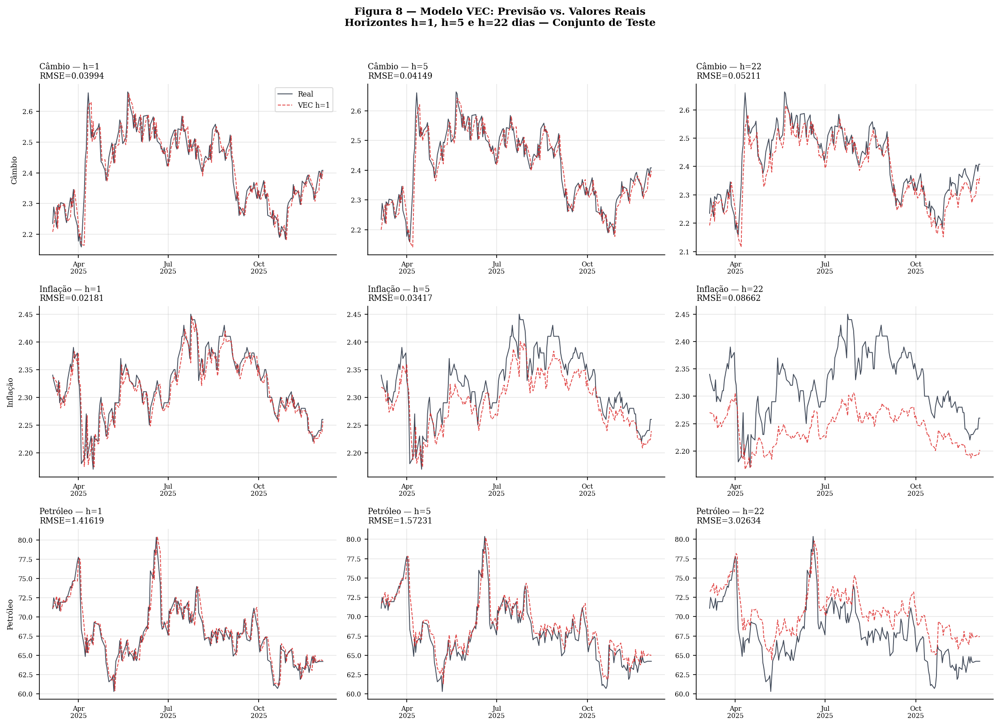

In [29]:
# ── Figura 8 — Previsão VEC vs. Real ──────────────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(15, 11))
fig.suptitle('Figura 8 — Modelo VEC: Previsão vs. Valores Reais\n'
             'Horizontes h=1, h=5 e h=22 dias — Conjunto de Teste', fontsize=11, fontweight='bold')

for j, (col, nome, cor) in enumerate(zip(COLS, NOMES,
        [CORES['cambio'], CORES['inflacao'], CORES['petroleo']])):
    for hi, h in enumerate([1, 5, 22]):
        ax = axes[j, hi]
        ax.plot(datas_test, Y_test_arr[:, j], color=CORES['real'],
                linewidth=0.9, label='Real', alpha=0.85)
        ax.plot(datas_test, resultados_vec[h][:, j], color=CORES['prev'],
                linewidth=0.9, linestyle='--', label=f'VEC h={h}', alpha=0.85)
        rmse = df_metricas_vec.query(
            f"Modelo == 'VEC h={h}' and Variável == '{nome}'")['RMSE'].values
        titulo = f'{nome} — h={h}\nRMSE={rmse[0]:.5f}' if len(rmse) else f'{nome} h={h}'
        ax.set_title(titulo, fontsize=8.5, loc='left')
        ax.tick_params(labelsize=7)
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
        if hi == 0:
            ax.set_ylabel(nome, fontsize=8)
        if j == 0 and hi == 0:
            ax.legend(fontsize=7.5)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(SAIDA + 'fig8_vec_previsao.png', bbox_inches='tight')
#plt.close()
print("  → fig8_vec_previsao.png")


### Figura 9 — SVAR: Previsão vs. Real
Horizontes h=1, h=5 e h=22 dias no conjunto de teste.

  → fig9_svar_previsao.png


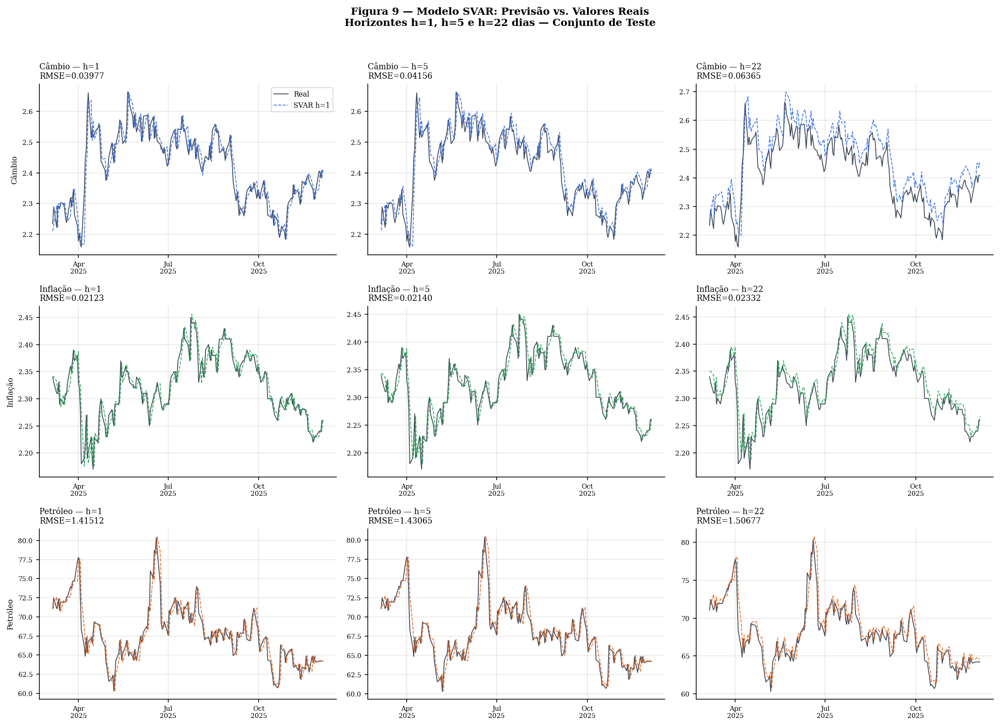

In [30]:
# ── Figura 9 — Previsão SVAR vs. Real ─────────────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(15, 11))
fig.suptitle('Figura 9 — Modelo SVAR: Previsão vs. Valores Reais\n'
             'Horizontes h=1, h=5 e h=22 dias — Conjunto de Teste', fontsize=11, fontweight='bold')

for j, (col, nome) in enumerate(zip(COLS, NOMES)):
    for hi, h in enumerate([1, 5, 22]):
        ax  = axes[j, hi]
        cor = [CORES['cambio'], CORES['inflacao'], CORES['petroleo']][j]
        ax.plot(datas_test, Y_test_arr[:, j], color=CORES['real'],
                linewidth=0.9, label='Real', alpha=0.85)
        ax.plot(datas_test, resultados_svar[h][:, j], color=cor,
                linewidth=0.9, linestyle='--', label=f'SVAR h={h}', alpha=0.85)
        rmse = df_metricas_svar.query(
            f"Modelo == 'SVAR h={h}' and Variável == '{nome}'")['RMSE'].values
        titulo = f'{nome} — h={h}\nRMSE={rmse[0]:.5f}' if len(rmse) else f'{nome} h={h}'
        ax.set_title(titulo, fontsize=8.5, loc='left')
        ax.tick_params(labelsize=7)
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
        if hi == 0:
            ax.set_ylabel(nome, fontsize=8)
        if j == 0 and hi == 0:
            ax.legend(fontsize=7.5)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(SAIDA + 'fig9_svar_previsao.png', bbox_inches='tight')
#plt.close()
print("  → fig9_svar_previsao.png")


### Figura 10 — Funções Impulso-Resposta Estrutural (SIRF)
Resposta de cada variável a um choque de 1 desvio-padrão nas restantes — 20 períodos.

  → fig10_svar_irf.png


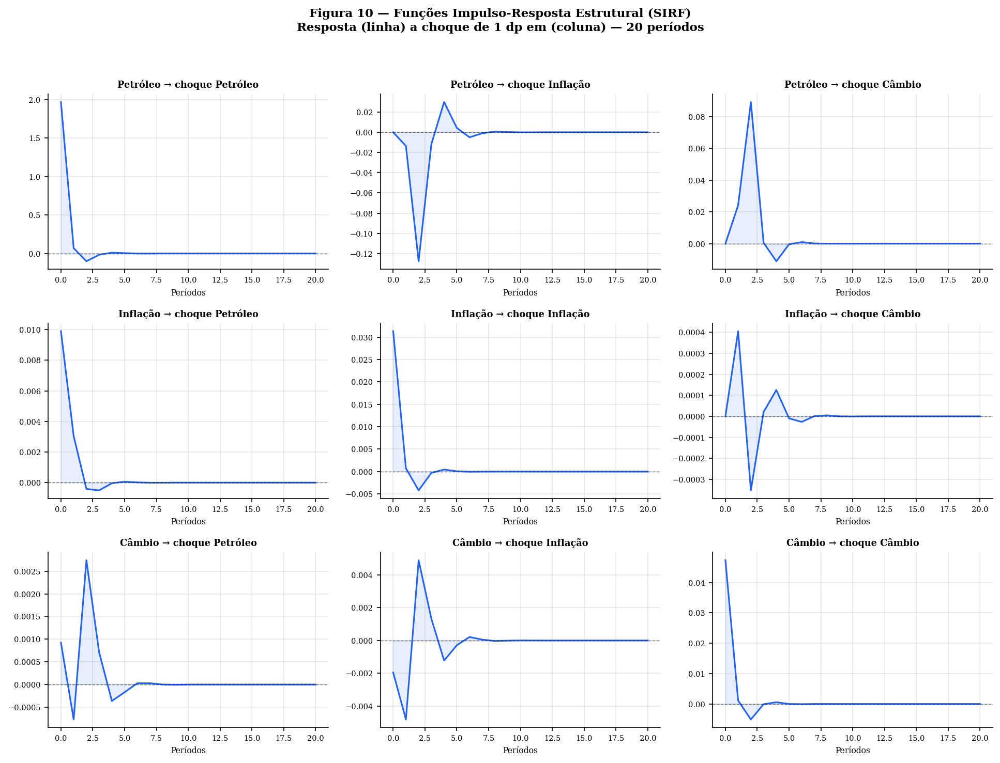

In [31]:
# ── Figura 10 — IRF do SVAR ───────────────────────────────────────────────
H_irf = 20
sirf  = svar.irf(H=H_irf)
# Reverter ordenação para NOMES originais
idx_rev = np.argsort(ordem_chol)
sirf    = sirf[:, :, :]  # (H+1, k_ord, k_ord)

nomes_ord = [NOMES[i] for i in ordem_chol]

fig, axes = plt.subplots(3, 3, figsize=(13, 10))
fig.suptitle('Figura 10 — Funções Impulso-Resposta Estrutural (SIRF)\n'
             'Resposta (linha) a choque de 1 dp em (coluna) — 20 períodos',
             fontsize=11, fontweight='bold')

periodos = np.arange(H_irf + 1)
for i in range(3):
    for j in range(3):
        ax = axes[i, j]
        ax.plot(periodos, sirf[:, i, j], color=CORES['cambio'], linewidth=1.5)
        ax.axhline(0, color='black', linewidth=0.7, linestyle='--', alpha=0.5)
        ax.fill_between(periodos, sirf[:, i, j], 0,
                        alpha=0.1, color=CORES['cambio'])
        ax.set_title(f'{nomes_ord[i]} → choque {nomes_ord[j]}',
                     fontsize=8.5, fontweight='bold')
        ax.set_xlabel('Períodos', fontsize=7.5)
        ax.tick_params(labelsize=7)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig(SAIDA + 'fig10_svar_irf.png', bbox_inches='tight')
#plt.close()
print("  → fig10_svar_irf.png")


### Figura 11 — Decomposição da Variância (FEVD)
Proporção da variância de previsão explicada por cada choque estrutural.

  → fig11_svar_fevd.png


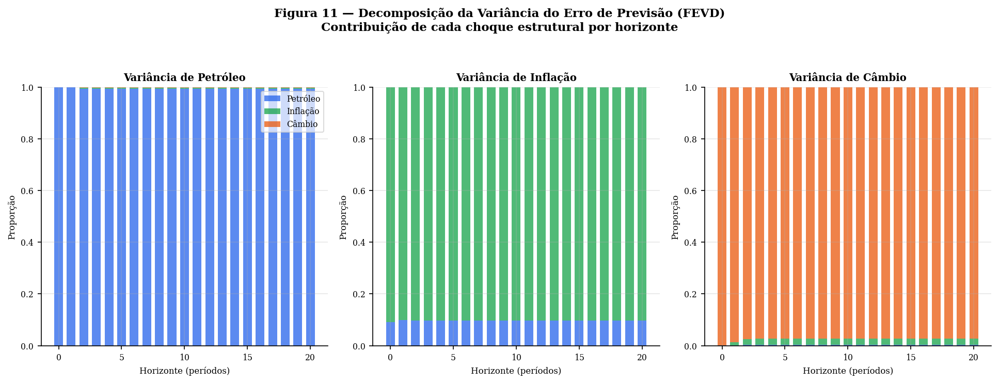

In [32]:
# ── Figura 11 — FEVD do SVAR ─────────────────────────────────────────────
fevd_arr = svar.fevd(H=H_irf)   # (H+1, k, k)

fig, axes = plt.subplots(1, 3, figsize=(13, 5))
fig.suptitle('Figura 11 — Decomposição da Variância do Erro de Previsão (FEVD)\n'
             'Contribuição de cada choque estrutural por horizonte',
             fontsize=11, fontweight='bold')

cores_fevd = [CORES['cambio'], CORES['inflacao'], CORES['petroleo']]
for i in range(3):
    ax  = axes[i]
    bot = np.zeros(H_irf + 1)
    for j in range(3):
        contrib = fevd_arr[:, i, j]
        ax.bar(periodos, contrib, bottom=bot,
               color=cores_fevd[j], alpha=0.75, label=nomes_ord[j], width=0.7)
        bot += contrib
    ax.set_title(f'Variância de {nomes_ord[i]}', fontsize=9.5, fontweight='bold')
    ax.set_xlabel('Horizonte (períodos)', fontsize=8)
    ax.set_ylabel('Proporção', fontsize=8)
    ax.set_ylim(0, 1)
    ax.tick_params(labelsize=7.5)
    if i == 0:
        ax.legend(fontsize=7.5, loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.savefig(SAIDA + 'fig11_svar_fevd.png', bbox_inches='tight')
#plt.close() permite não exibir figura
print("  → fig11_svar_fevd.png")


### Figura 12 — EGARCH: Volatilidade Condicional
Série em nível e volatilidade estimada $σ_t$ para Câmbio e Petróleo.

  → fig12_egarch_volatilidade.png


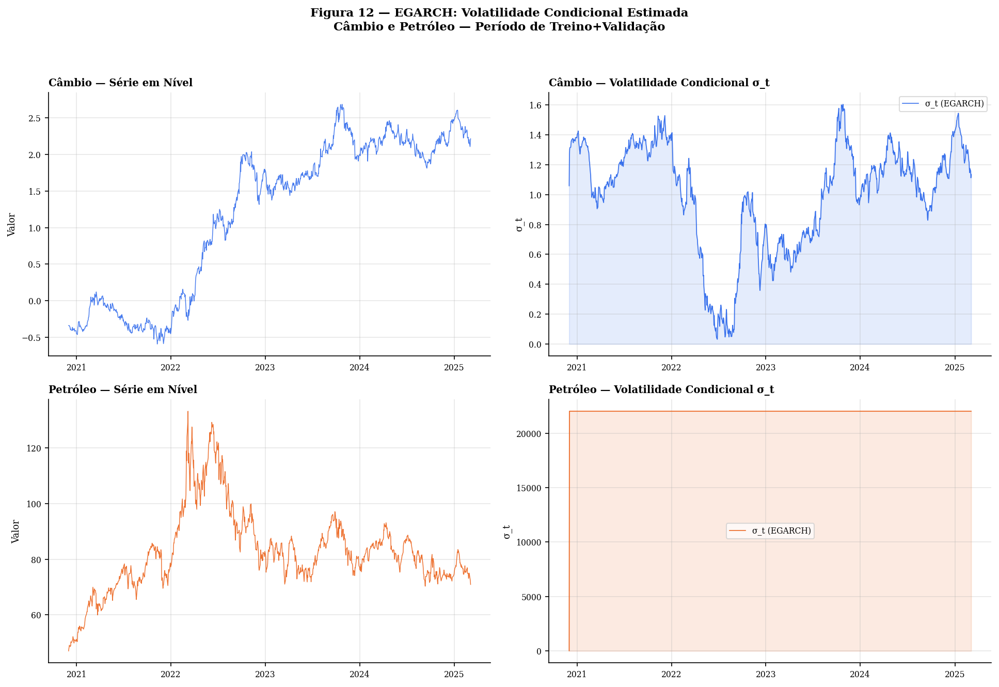

In [33]:
# ── Figura 12 — EGARCH: volatilidade in-sample e previsão ────────────────
fig, axes = plt.subplots(2, 2, figsize=(13, 9))
fig.suptitle('Figura 12 — EGARCH: Volatilidade Condicional Estimada\n'
             'Câmbio e Petróleo — Período de Treino+Validação',
             fontsize=11, fontweight='bold')

datas_tv = df_trainval.index
for row, (col, nome) in enumerate([(COLS[0], NOMES[0]), (COLS[2], NOMES[2])]):
    eg   = egarch_models[col]
    cor  = CORES[col]
    # Série de retornos
    ax0  = axes[row, 0]
    ax0.plot(datas_tv, df_trainval[col].values,
             color=cor, linewidth=0.7, alpha=0.85)
    ax0.set_title(f'{nome} — Série em Nível', fontsize=9.5, fontweight='bold', loc='left')
    ax0.set_ylabel('Valor', fontsize=8.5)
    ax0.tick_params(labelsize=7.5)
    ax0.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax0.xaxis.set_major_locator(mdates.YearLocator())
    # Volatilidade condicional
    ax1 = axes[row, 1]
    sigma_t = np.sqrt(eg.sigma2_)
    ax1.plot(datas_tv, sigma_t,
             color=cor, linewidth=0.8, alpha=0.9, label='σ_t (EGARCH)')
    ax1.fill_between(datas_tv, sigma_t, alpha=0.12, color=cor)
    ax1.set_title(f'{nome} — Volatilidade Condicional σ_t', fontsize=9.5,
                  fontweight='bold', loc='left')
    ax1.set_ylabel('σ_t', fontsize=8.5)
    ax1.tick_params(labelsize=7.5)
    ax1.legend(fontsize=7.5)
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax1.xaxis.set_major_locator(mdates.YearLocator())

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig(SAIDA + 'fig12_egarch_volatilidade.png', bbox_inches='tight')
#plt.close()
print("  → fig12_egarch_volatilidade.png")


### Figura 13 — Diagnóstico dos Resíduos
Histograma, Q-Q plot e ACF dos resíduos do VEC, SVAR e EGARCH.

  → fig13_diagnostico_residuos.png


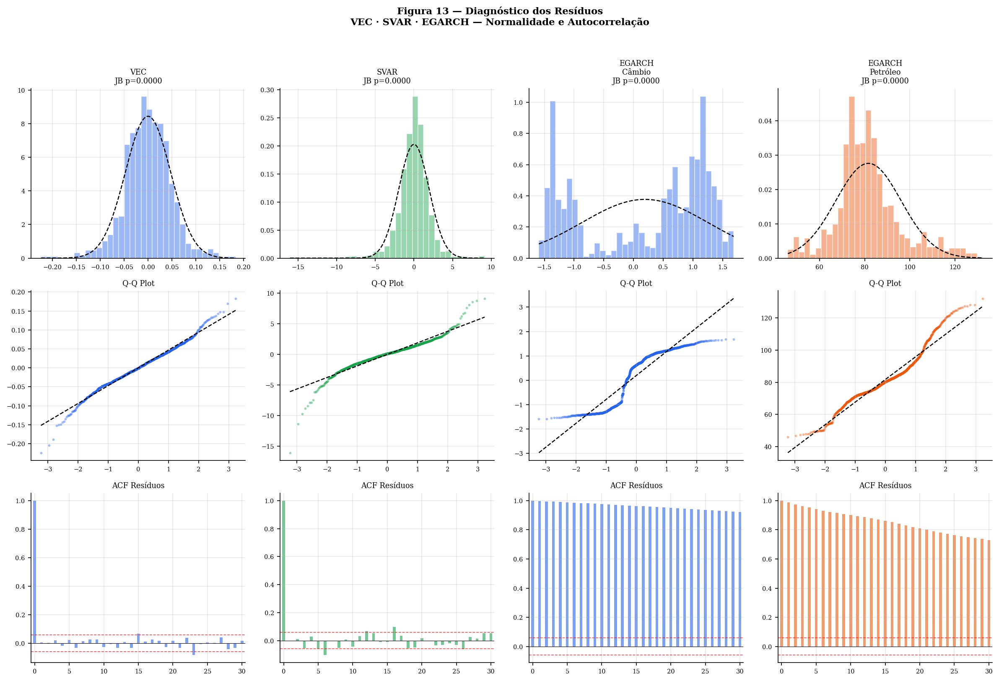

In [34]:
# ── Figura 13 — Diagnóstico dos resíduos (VEC, SVAR, EGARCH) ─────────────
fig, axes = plt.subplots(3, 4, figsize=(16, 11))
fig.suptitle('Figura 13 — Diagnóstico dos Resíduos\n'
             'VEC · SVAR · EGARCH — Normalidade e Autocorrelação',
             fontsize=11, fontweight='bold')

modelos_diag = [
    ('VEC',   vec_model.resid_[:, 0],  CORES['cambio']),
    ('SVAR',  svar.resid_[:, 0],       CORES['inflacao']),
    ('EGARCH\nCâmbio',  egarch_models[COLS[0]].resid_, CORES['cambio']),
    ('EGARCH\nPetrólео', egarch_models[COLS[2]].resid_, CORES['petroleo']),
]

for col_idx, (nome_m, resid, cor) in enumerate(modelos_diag):
    resid = resid.flatten()
    n_r   = len(resid)

    # Histograma
    ax_h = axes[0, col_idx]
    ax_h.hist(resid, bins=35, density=True, color=cor, alpha=0.45, edgecolor='white')
    xr   = np.linspace(resid.min(), resid.max(), 200)
    ax_h.plot(xr, stats.norm.pdf(xr, resid.mean(), resid.std()), 'k--', lw=1.2)
    _, p_jb = stats.jarque_bera(resid)
    ax_h.set_title(f'{nome_m}\nJB p={p_jb:.4f}', fontsize=8.5)
    ax_h.tick_params(labelsize=7)

    # Q-Q
    ax_q = axes[1, col_idx]
    qq   = stats.probplot(resid, dist='norm')
    ax_q.scatter(qq[0][0], qq[0][1], color=cor, alpha=0.3, s=4)
    sl, ic = qq[1][0], qq[1][1]
    xl = np.array([qq[0][0].min(), qq[0][0].max()])
    ax_q.plot(xl, sl * xl + ic, 'k--', lw=1.2)
    ax_q.set_title('Q-Q Plot', fontsize=8.5)
    ax_q.tick_params(labelsize=7)

    # ACF dos resíduos
    ax_a = axes[2, col_idx]
    y_r  = resid - resid.mean()
    n_r  = len(y_r)
    lags = min(30, n_r // 4)
    acf_vals = [np.sum(y_r[k:] * y_r[:n_r - k]) / np.sum(y_r ** 2) for k in range(lags + 1)]
    ci_acf   = 1.96 / np.sqrt(n_r)
    ax_a.bar(range(len(acf_vals)), acf_vals, color=cor, alpha=0.6, width=0.4)
    ax_a.axhline( ci_acf, color='red', lw=0.8, linestyle='--', alpha=0.7)
    ax_a.axhline(-ci_acf, color='red', lw=0.8, linestyle='--', alpha=0.7)
    ax_a.axhline(0, color='black', lw=0.5)
    ax_a.set_title('ACF Resíduos', fontsize=8.5)
    ax_a.tick_params(labelsize=7)
    ax_a.set_xlim(-0.5, lags + 0.5)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(SAIDA + 'fig13_diagnostico_residuos.png', bbox_inches='tight')
#plt.close()
print("  → fig13_diagnostico_residuos.png")


## Tabela Comparativa de Métricas — Fase 2

Consolidação de RMSE, MAE, MAPE e Theil-U para todos os modelos e horizontes.
Ficheiros CSV guardados para uso na comparação final (Fase 5).

In [35]:
# ===========================================================================
# TABELA COMPARATIVA FASE 2
# ===========================================================================
print("\n[Tabelas] Guardando métricas e resultados...")

# Tabela comparativa completa Fase 2
df_met_fase2 = pd.concat([df_metricas_vec, df_metricas_svar, df_metricas_egarch],
                          ignore_index=True)
df_met_fase2.to_csv(SAIDA + 'tabela_metricas_fase2.csv', index=False)

# Guardar previsões para comparação inter-fases
for h in [1, 5, 22]:
    pd.DataFrame(resultados_vec[h],  columns=COLS,
                 index=df_test.index).to_csv(SAIDA + f'prev_vec_h{h}.csv')
    pd.DataFrame(resultados_svar[h], columns=COLS,
                 index=df_test.index).to_csv(SAIDA + f'prev_svar_h{h}.csv')

# Parâmetros EGARCH
egarch_params = []
for col in [COLS[0], COLS[2]]:
    eg = egarch_models[col]
    egarch_params.append({
        'variavel': col, 'mu': eg.mu_, 'omega': eg.omega_,
        'alpha': eg.alpha_, 'gamma': eg.gamma_, 'beta': eg.beta_,
        'AIC': eg.aic_, 'BIC': eg.bic_, 'convergiu': eg.converged_,
    })
pd.DataFrame(egarch_params).to_csv(SAIDA + 'egarch_params.csv', index=False)

print("  → tabela_metricas_fase2.csv")
print("  → prev_vec_h1/h5/h22.csv | prev_svar_h1/h5/h22.csv")
print("  → egarch_params.csv")



[Tabelas] Guardando métricas e resultados...
  → tabela_metricas_fase2.csv
  → prev_vec_h1/h5/h22.csv | prev_svar_h1/h5/h22.csv
  → egarch_params.csv


## Resumo Final — Fase 2

Síntese dos resultados obtidos e implicações para as fases seguintes.

In [36]:
# ===========================================================================
# RESUMO FINAL FASE 2
# ===========================================================================
print("\n" + "=" * 70)
print("  RESUMO FINAL — FASE 2")
print("=" * 70)

print(f"""
  Resultados do Teste de Johansen
  ────────────────────────────────────────────────────────────────
  Rank de cointegração: r = {joh['rank']}
  {'→ VEC aplicável (relação de longo prazo detectada)' if joh['rank'] >= 1
   else '→ VAR em diferenças (sem cointegração)'}

  Modelos estimados
  ────────────────────────────────────────────────────────────────
  VEC  : r={vec_model.r}, p={vec_model.p}  |  AIC={vec_model.aic_:.4f}  BIC={vec_model.bic_:.4f}
  SVAR : p={svar.p}       |  AIC={svar.aic_:.4f}  BIC={svar.bic_:.4f}
  EGARCH Câmbio   : α={egarch_models[COLS[0]].alpha_:+.4f}  γ={egarch_models[COLS[0]].gamma_:+.4f}  β={egarch_models[COLS[0]].beta_:+.4f}
  EGARCH Petróleo : α={egarch_models[COLS[2]].alpha_:+.4f}  γ={egarch_models[COLS[2]].gamma_:+.4f}  β={egarch_models[COLS[2]].beta_:+.4f}

  Melhores RMSE por variável (h=1)
  ────────────────────────────────────────────────────────────────""")

for nome in NOMES:
    sub = df_met_fase2[
        (df_met_fase2['Variável'] == nome) &
        (df_met_fase2['Modelo'].str.contains('h=1'))
    ][['Modelo','RMSE']].sort_values('RMSE')
    if len(sub):
        melhor = sub.iloc[0]
        print(f"  {nome:<12}: {melhor['Modelo']:<15}  RMSE = {melhor['RMSE']:.6f}")

print(f"""
  Ficheiros gerados
  ────────────────────────────────────────────────────────────────
  fig8_vec_previsao.png        fig9_svar_previsao.png
  fig10_svar_irf.png           fig11_svar_fevd.png
  fig12_egarch_volatilidade.png  fig13_diagnostico_residuos.png
  tabela_metricas_fase2.csv    egarch_params.csv
  prev_vec_h1/h5/h22.csv       prev_svar_h1/h5/h22.csv

  Próxima fase: Fase 3 — Modelos de Machine Learning (RF, XGBoost, SVR)
  ────────────────────────────────────────────────────────────────
""")
print("=" * 70)
print("  FASE 2 CONCLUÍDA COM SUCESSO")
print("=" * 70)



  RESUMO FINAL — FASE 2

  Resultados do Teste de Johansen
  ────────────────────────────────────────────────────────────────
  Rank de cointegração: r = 3
  → VEC aplicável (relação de longo prazo detectada)

  Modelos estimados
  ────────────────────────────────────────────────────────────────
  VEC  : r=3, p=3  |  AIC=-11.6533  BIC=-11.5177
  SVAR : p=2       |  AIC=-11.6351  BIC=-11.5402
  EGARCH Câmbio   : α=+1.3652  γ=-0.0053  β=+0.9443
  EGARCH Petróleo : α=+2.0000  γ=+2.0000  β=+0.9990

  Melhores RMSE por variável (h=1)
  ────────────────────────────────────────────────────────────────
  Câmbio      : SVAR h=1         RMSE = 0.039771
  Inflação    : SVAR h=1         RMSE = 0.021232
  Petróleo    : EGARCH h=1       RMSE = 0.840000

  Ficheiros gerados
  ────────────────────────────────────────────────────────────────
  fig8_vec_previsao.png        fig9_svar_previsao.png
  fig10_svar_irf.png           fig11_svar_fevd.png
  fig12_egarch_volatilidade.png  fig13_diagnostico_residu

# Fase 3 — Modelos de Machine Learning
**Previsão de Variáveis Macroeconómicas e Financeiras**  
Doutoramento em Matemática e Aplicações

---

| Modelos | Variáveis | Horizontes | Métricas |
|---|---|---|---|
| Random Forest · XGBoost · SVR | Câmbio · Inflação · Petróleo | 1d · 5d · 22d | RMSE · MAE · MAPE · R² |

---
**Tarefas desta fase:**
- `3.1` Engenharia de variáveis (feature engineering)
- `3.2` Random Forest + importância de features
- `3.3` XGBoost + early stopping + SHAP values
- `3.4` SVR — kernels RBF, linear e polinomial
- `3.5` Avaliação e comparação dos modelos ML

## Instalação de dependências

In [16]:
%%capture
# Instalar dependências (executar uma vez)
!pip install xgboost shap scikit-learn matplotlib pandas numpy seaborn

## Importações e Configuração Global

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.pipeline import Pipeline
import xgboost as xgb
import shap

# ── Estilo dos gráficos ──────────────────────────────────────────────────────
plt.rcParams.update({
    'figure.facecolor': '#0f1117',
    'axes.facecolor':   '#1a1f2e',
    'axes.edgecolor':   '#2d3748',
    'axes.labelcolor':  '#94a3b8',
    'xtick.color':      '#94a3b8',
    'ytick.color':      '#94a3b8',
    'text.color':       '#e2e8f0',
    'grid.color':       '#2d3748',
    'grid.linestyle':   '--',
    'grid.alpha':       0.4,
    'axes.grid':        True,
    'font.family':      'sans-serif',
})

# ── Configuração global ──────────────────────────────────────────────────────
SEED        = 42
VARIAVEIS   = ['cambio', 'inflacao', 'petroleo']
HORIZONTES  = [1, 5, 22]      # dias úteis
N_LAGS      = 22              # lags máximos para feature engineering
N_SPLITS_CV = 5               # splits para TimeSeriesSplit
TRAIN_FRAC  = 0.70
VAL_FRAC    = 0.15
#TEST_FRAC = 0.15               #(restante)

np.random.seed(SEED)
print('✅ Importações concluídas.')

✅ Importações concluídas.


## Funções Auxiliares

In [18]:
def calcular_metricas(y_real, y_pred, nome: str) -> dict:
    """Calcula e imprime RMSE, MAE, MAPE e R²."""
    rmse = np.sqrt(mean_squared_error(y_real, y_pred))
    mae  = mean_absolute_error(y_real, y_pred)
    mape = np.mean(np.abs((y_real - y_pred) / (np.abs(y_real) + 1e-10))) * 100
    r2   = r2_score(y_real, y_pred)
    print(f'  {nome:30s} | RMSE={rmse:.5f} | MAE={mae:.5f} | MAPE={mape:.2f}% | R²={r2:.4f}')
    return {'modelo': nome, 'RMSE': rmse, 'MAE': mae, 'MAPE': mape, 'R2': r2}


def dividir_dados(d: pd.DataFrame):
    """Divisão temporal 70/15/15 — preserva ordem temporal."""
    n       = len(d)
    n_train = int(n * TRAIN_FRAC)
    n_val   = int(n * VAL_FRAC)
    X = d.drop(columns=['target'])
    y = d['target']
    return (
        X.iloc[:n_train],          y.iloc[:n_train],
        X.iloc[n_train:n_train+n_val], y.iloc[n_train:n_train+n_val],
        X.iloc[n_train+n_val:],    y.iloc[n_train+n_val:]
    )

print('✅ Funções auxiliares definidas.')

✅ Funções auxiliares definidas.


---
## 3.1 — Engenharia de Variáveis (Feature Engineering)

Para cada variável (câmbio, inflação, petróleo) são criadas:
- **Lags**: $t-1$ a $t-22$
- **Médias móveis**: 5d, 10d, 22d
- **Volatilidade realizada** (desvio-padrão): 5d, 22d
- **Retorno simples**: $(P_t / P_{t-1}) - 1$
- **Diferença absoluta**: $P_t - P_{t-1}$

**Target**: valor da série `alvo` daqui a `horizonte` dias.

In [22]:
def criar_features(df: pd.DataFrame, alvo: str, horizonte: int) -> pd.DataFrame:
    """
    Cria features supervisionadas para prever 'alvo' com 'horizonte' passos à frente.
    Retorna DataFrame com features + coluna 'target', sem NaN.
    """
    d = pd.DataFrame(index=df.index)

    for col in df.columns:
        # Retorno e diferença
        d[f'{col}_ret1']  = df[col].pct_change()
        d[f'{col}_diff1'] = df[col].diff()

        # Lags
        for lag in range(1, N_LAGS + 1):
            d[f'{col}_lag{lag}'] = df[col].shift(lag)

        # Médias móveis
        for w in [5, 10, 22]:
            d[f'{col}_mm{w}'] = df[col].rolling(w).mean()

        # Volatilidade realizada
        for w in [5, 22]:
            d[f'{col}_std{w}'] = df[col].rolling(w).std()

    # Target
    d['target'] = df[alvo].shift(-horizonte)
    d.dropna(inplace=True)

    print(f'  [{alvo}] h={horizonte}d → {d.shape[1]-1} features | {d.shape[0]} amostras')
    return d


# ── Exemplo: mostrar features para câmbio h=1d ───────────────────────────────
print('Exemplo de features geradas (câmbio, h=1d):')
d_exemplo = criar_features(df, alvo='cambio', horizonte=1)
d_exemplo.head(3)

Exemplo de features geradas (câmbio, h=1d):
  [cambio] h=1d → 78 features | 170 amostras


,cambio_ret1,cambio_diff1,cambio_lag1,cambio_lag2,cambio_lag3,cambio_lag4,cambio_lag5,cambio_lag6,cambio_lag7,cambio_lag8,...,petroleo_lag16,petroleo_lag17,petroleo_lag18,petroleo_lag19,petroleo_lag20,petroleo_lag21,petroleo_lag22,petroleo_mm5,petroleo_std5,target
data,,,,,,,,,,,,,,,,,,,,,
2021-03-18,0.531646,0.042,0.079,0.046,0.064,0.092,-0.038,-0.061,-0.006,0.036,...,66.85,65.16,64.73,62.84,64.09,65.02,63.96,67.088,2.827281,0.091
2021-03-19,-0.247934,-0.030,0.121,0.079,0.046,0.064,0.092,-0.038,-0.061,-0.006,...,66.69,66.85,65.16,64.73,62.84,64.09,65.02,66.114,2.897884,0.004
2021-03-22,-0.956044,-0.087,0.091,0.121,0.079,0.046,0.064,0.092,-0.038,-0.061,...,65.86,66.69,66.85,65.16,64.73,62.84,64.09,65.136,2.581042,-0.028


---
## 3.2 — Random Forest

Optimização de hiperparâmetros via **TimeSeriesSplit + GridSearchCV**:
- `n_estimators`, `max_depth`, `min_samples_split`, `max_features`

Inclui análise de **importância das features** (Gini importance).

In [23]:
def treinar_random_forest(X_train, y_train, X_val, y_val):
    """Random Forest com GridSearchCV temporal."""
    param_grid = {
        'n_estimators':      [200, 400],
        'max_depth':         [5, 10, None],
        'min_samples_split': [2, 5, 10],
        'max_features':      ['sqrt', 0.5],
    }
    tscv = TimeSeriesSplit(n_splits=N_SPLITS_CV)
    gs = GridSearchCV(
        RandomForestRegressor(random_state=SEED, n_jobs=-1),
        param_grid, cv=tscv,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1, verbose=0
    )
    X_tv = pd.concat([X_train, X_val])
    y_tv = pd.concat([y_train, y_val])
    gs.fit(X_tv, y_tv)
    print(f'    Melhores parâmetros RF: {gs.best_params_}')
    return gs.best_estimator_


def plotar_importancia_rf(modelo, feature_names, alvo, horizonte):
    """Top-20 features por importância Gini."""
    imp = pd.Series(modelo.feature_importances_, index=feature_names).nlargest(20)
    fig, ax = plt.subplots(figsize=(9, 6))
    imp.sort_values().plot(kind='barh', ax=ax, color='#34d399')
    ax.set_title(f'Random Forest — Importância das Features\n[{alvo}] h={horizonte}d', fontsize=9)
    ax.set_xlabel('Importância (Gini)')
    plt.tight_layout()
    plt.savefig(f'rf_importancia_{alvo}_h{horizonte}.png', dpi=150, bbox_inches='tight')
    plt.show()

print('✅ Funções Random Forest definidas.')

✅ Funções Random Forest definidas.


---
## 3.3 — XGBoost

- **Early stopping** com conjunto de validação
- Grid search sobre `learning_rate`, `n_estimators`, `max_depth`, `subsample`, `colsample_bytree`
- **SHAP values** para interpretabilidade

In [28]:
def treinar_xgboost(X_train, y_train, X_val, y_val):
    """XGBoost com early stopping e grid search manual temporal."""
    param_grid = {
        'learning_rate':    [0.01, 0.05, 0.1],
        'n_estimators':     [300, 600],
        'max_depth':        [3, 5, 7],
        'subsample':        [0.7, 1.0],
        'colsample_bytree': [0.7, 1.0],
    }
    melhor_rmse    = np.inf
    melhores_params = {}

    for lr in param_grid['learning_rate']:
        for n_est in param_grid['n_estimators']:
            for md in param_grid['max_depth']:
                for ss in param_grid['subsample']:
                    for cs in param_grid['colsample_bytree']:
                        m = xgb.XGBRegressor(
                            objective='reg:squarederror',
                            learning_rate=lr, n_estimators=n_est,
                            max_depth=md, subsample=ss,
                            colsample_bytree=cs, random_state=SEED,
                            n_jobs=-1, verbosity=0,
                            early_stopping_rounds=30,
                        )
                        m.fit(X_train, y_train,
                              eval_set=[(X_val, y_val)], verbose=False)
                        rmse_val = np.sqrt(mean_squared_error(
                            y_val, m.predict(X_val)))
                        if rmse_val < melhor_rmse:
                            melhor_rmse = rmse_val
                            melhores_params = dict(
                                learning_rate=lr, n_estimators=n_est,
                                max_depth=md, subsample=ss,
                                colsample_bytree=cs)

    print(f'    Melhores parâmetros XGB: {melhores_params} | RMSE val={melhor_rmse:.5f}')
    modelo_final = xgb.XGBRegressor(
        objective='reg:squarederror', **melhores_params,
        random_state=SEED, n_jobs=-1, verbosity=0)
    X_tv = pd.concat([X_train, X_val])
    y_tv = pd.concat([y_train, y_val])
    modelo_final.fit(X_tv, y_tv)
    return modelo_final


def analise_shap(modelo, X_test, alvo, horizonte, n=200):
    """SHAP summary plot para o XGBoost."""
    X_s = X_test.sample(n=min(n, len(X_test)), random_state=SEED)
    explainer   = shap.TreeExplainer(modelo)
    shap_values = explainer.shap_values(X_s)
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values, X_s, max_display=20, show=False, plot_type='bar')
    plt.title(f'XGBoost — SHAP Values\n[{alvo}] h={horizonte}d', fontsize=9, color='white')
    plt.tight_layout()
    plt.savefig(f'xgb_shap_{alvo}_h{horizonte}.png', dpi=150, bbox_inches='tight')
    plt.show()

print('✅ Funções XGBoost definidas.')

✅ Funções XGBoost definidas.


---
## 3.4 — SVR (Support Vector Regression)

Pipeline `MinMaxScaler → SVR` com três kernels:
- **RBF** — não-linear, geralmente mais robusto
- **Linear** — baseline interpretável
- **Polinomial** — captura interacções de ordem superior

Optimização de `C`, `ε` e `γ` via `TimeSeriesSplit + GridSearchCV`.

In [25]:
def treinar_svr(X_train, y_train, X_val, y_val):
    """Pipeline MinMaxScaler + SVR com GridSearchCV temporal."""
    pipe = Pipeline([('scaler', MinMaxScaler()), ('svr', SVR())])

    param_grid = [
        {
            'svr__kernel':  ['rbf'],
            'svr__C':       [0.1, 1, 10, 100],
            'svr__epsilon': [0.01, 0.1, 0.5],
            'svr__gamma':   ['scale', 'auto', 0.01, 0.1],
        },
        {
            'svr__kernel':  ['linear'],
            'svr__C':       [0.1, 1, 10],
            'svr__epsilon': [0.01, 0.1],
        },
        {
            'svr__kernel':  ['poly'],
            'svr__C':       [1, 10],
            'svr__epsilon': [0.01, 0.1],
            'svr__degree':  [2, 3],
        },
    ]
    tscv = TimeSeriesSplit(n_splits=N_SPLITS_CV)
    gs = GridSearchCV(
        pipe, param_grid, cv=tscv,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1, verbose=0
    )
    X_tv = pd.concat([X_train, X_val])
    y_tv = pd.concat([y_train, y_val])
    gs.fit(X_tv, y_tv)
    print(f'    Melhores parâmetros SVR: {gs.best_params_}')
    return gs.best_estimator_

print('✅ Funções SVR definidas.')

✅ Funções SVR definidas.


---
## 3.5 — Avaliação e Comparação dos Modelos ML

Gráficos de **previsão vs. realizado** e cálculo de RMSE, MAE, MAPE, R² para cada modelo × variável × horizonte.

In [26]:
def plotar_previsoes(y_test, preds: dict, alvo: str, horizonte: int):
    """Gráfico previsão vs. realizado para os 3 modelos."""
    cores = {'Random Forest': '#34d399', 'XGBoost': '#a78bfa', 'SVR': '#f97316'}
    fig, ax = plt.subplots(figsize=(14, 5))
    ax.plot(y_test.values, color='#60a5fa', lw=1.8, label='Realizado', zorder=5)
    for nome, pred in preds.items():
        ax.plot(pred, color=cores[nome], lw=1.2, ls='--', alpha=0.85, label=nome)
    ax.set_title(f'Previsão vs. Realizado — [{alvo.upper()}]  h={horizonte}d', fontsize=13)
    ax.set_xlabel('Observações (conjunto de teste)')
    ax.set_ylabel(alvo.capitalize())
    ax.legend(facecolor='#1a1f2e', labelcolor='white', fontsize=9)
    plt.tight_layout()
    plt.savefig(f'ml_previsao_{alvo}_h{horizonte}.png', dpi=150, bbox_inches='tight')
    plt.show()

print('✅ Função de visualização definida.')

✅ Função de visualização definida.


---
## Pipeline Principal — Executar Fase 3 Completa

> Executa todas as combinações: **3 variáveis × 3 horizontes = 9 experimentos**  
> por cada um dos 3 modelos → **27 modelos treinados** no total.


════════════════════════════════════════════════════════════
  VARIÁVEL ALVO: CAMBIO
════════════════════════════════════════════════════════════

  ── Horizonte: 1 dia(s) ──
  [cambio] h=1d → 78 features | 170 amostras

  [RF] A treinar...
    Melhores parâmetros RF: {'max_depth': 5, 'max_features': 0.5, 'min_samples_split': 5, 'n_estimators': 400}
  Random Forest                  | RMSE=0.20012 | MAE=0.17059 | MAPE=6.78% | R²=-3.8029


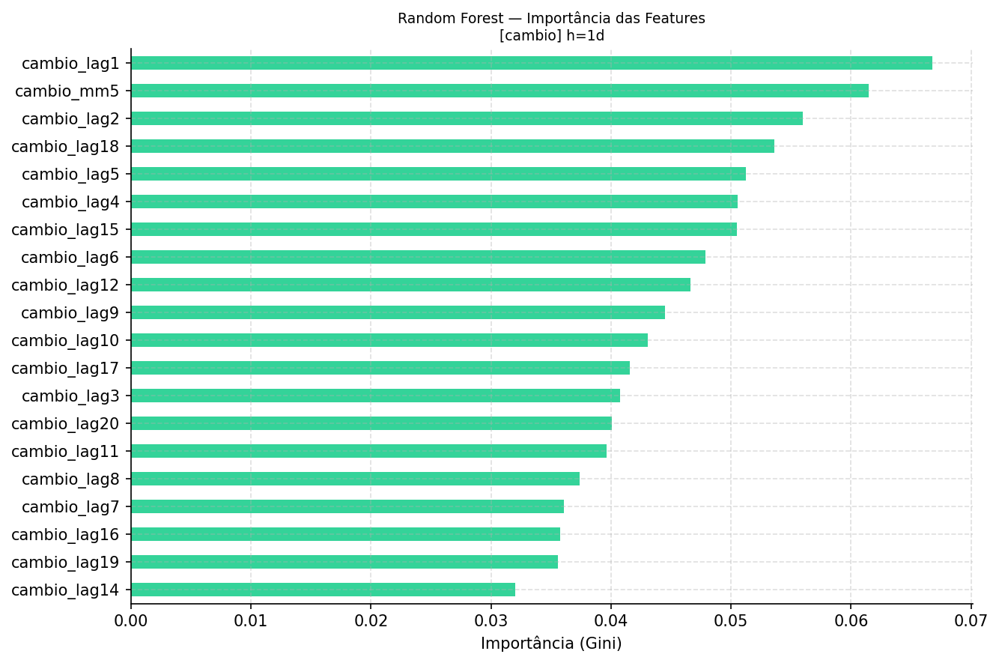


  [XGB] A treinar...
    Melhores parâmetros XGB: {'learning_rate': 0.05, 'n_estimators': 300, 'max_depth': 3, 'subsample': 0.7, 'colsample_bytree': 1.0} | RMSE val=0.09929
  XGBoost                        | RMSE=0.13837 | MAE=0.11075 | MAPE=4.41% | R²=-1.2961


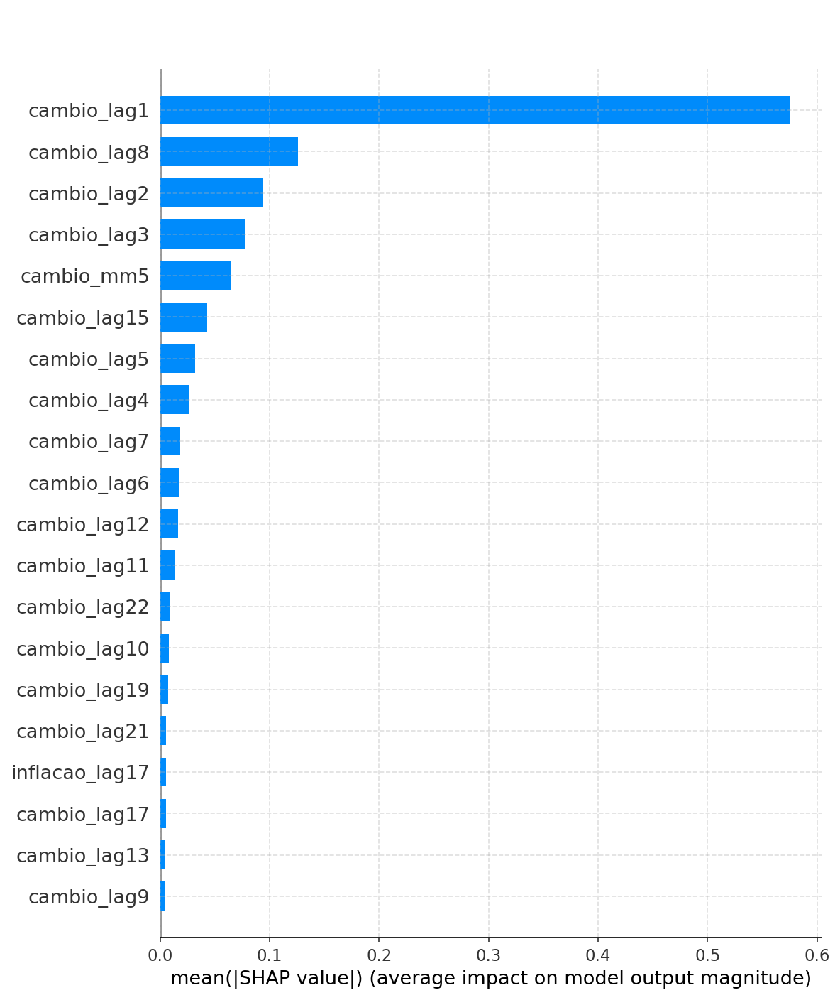


  [SVR] A treinar...
    Melhores parâmetros SVR: {'svr__C': 100, 'svr__epsilon': 0.01, 'svr__gamma': 0.01, 'svr__kernel': 'rbf'}
  SVR                            | RMSE=0.09547 | MAE=0.06639 | MAPE=2.65% | R²=-0.0930


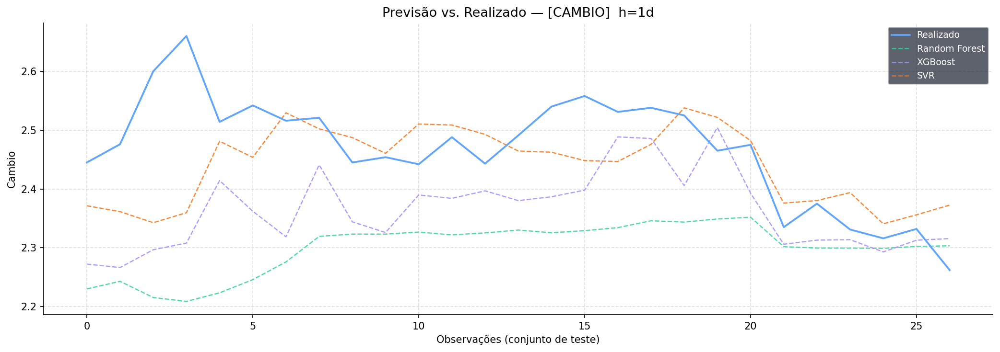


════════════════════════════════════════════════════════════
  VARIÁVEL ALVO: INFLACAO
════════════════════════════════════════════════════════════

  ── Horizonte: 1 dia(s) ──
  [inflacao] h=1d → 78 features | 168 amostras

  [RF] A treinar...
    Melhores parâmetros RF: {'max_depth': None, 'max_features': 0.5, 'min_samples_split': 10, 'n_estimators': 200}
  Random Forest                  | RMSE=0.05312 | MAE=0.04460 | MAPE=1.94% | R²=0.4949


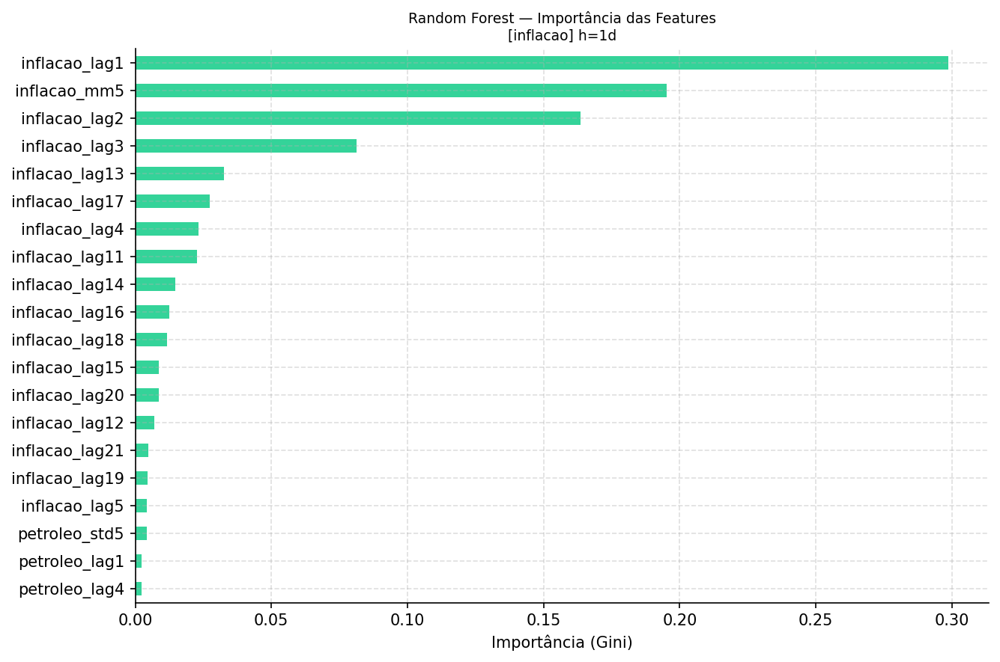


  [XGB] A treinar...
    Melhores parâmetros XGB: {'learning_rate': 0.05, 'n_estimators': 300, 'max_depth': 7, 'subsample': 1.0, 'colsample_bytree': 0.7} | RMSE val=0.04075
  XGBoost                        | RMSE=0.04906 | MAE=0.04059 | MAPE=1.77% | R²=0.5692


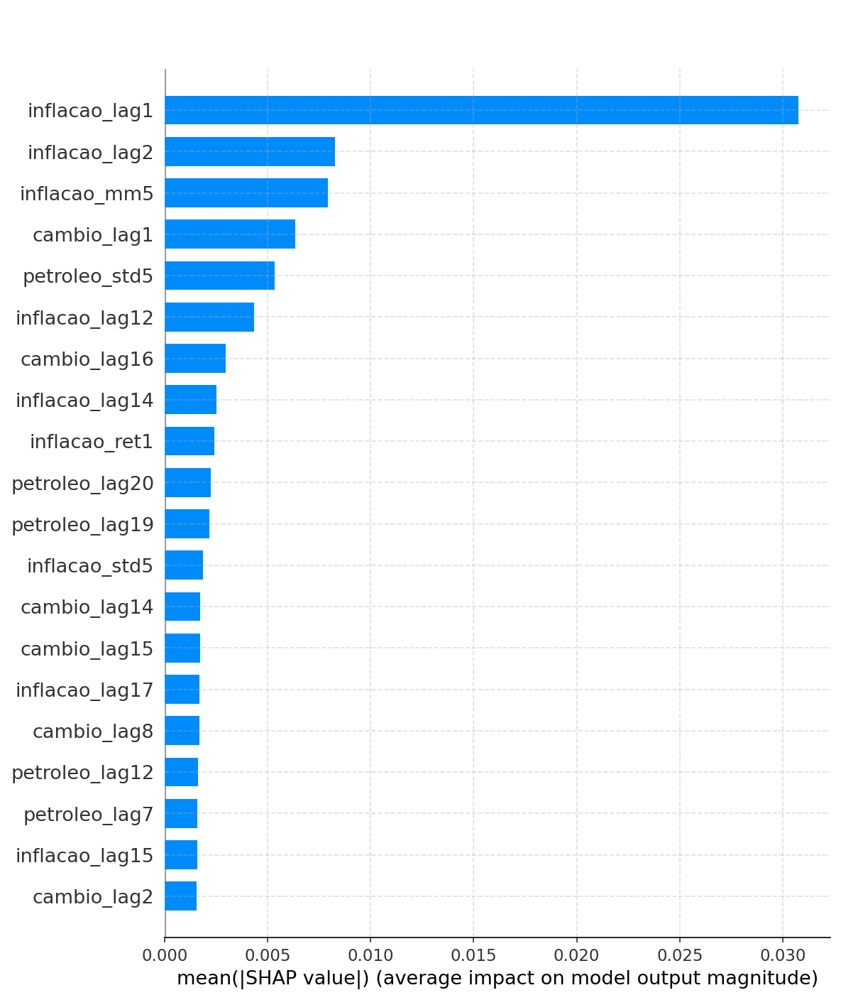


  [SVR] A treinar...
    Melhores parâmetros SVR: {'svr__C': 0.1, 'svr__epsilon': 0.01, 'svr__kernel': 'linear'}
  SVR                            | RMSE=0.03424 | MAE=0.03011 | MAPE=1.30% | R²=0.7901


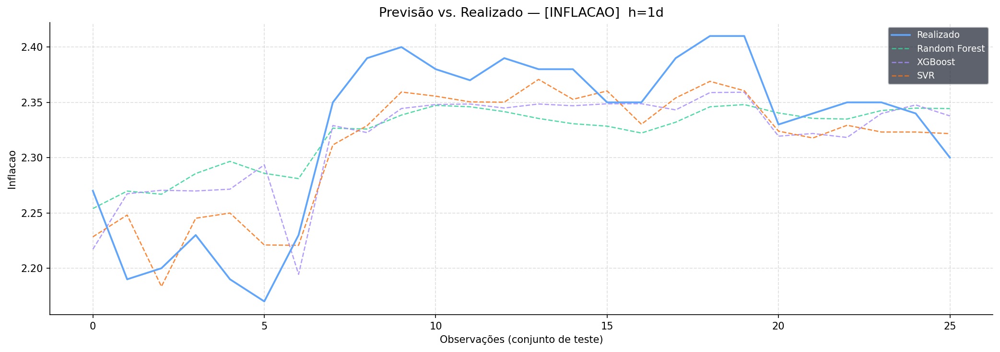


════════════════════════════════════════════════════════════
  VARIÁVEL ALVO: PETROLEO
════════════════════════════════════════════════════════════

  ── Horizonte: 1 dia(s) ──
  [petroleo] h=1d → 78 features | 170 amostras

  [RF] A treinar...
    Melhores parâmetros RF: {'max_depth': None, 'max_features': 0.5, 'min_samples_split': 5, 'n_estimators': 400}
  Random Forest                  | RMSE=1.89112 | MAE=1.68042 | MAPE=2.51% | R²=-1.5858


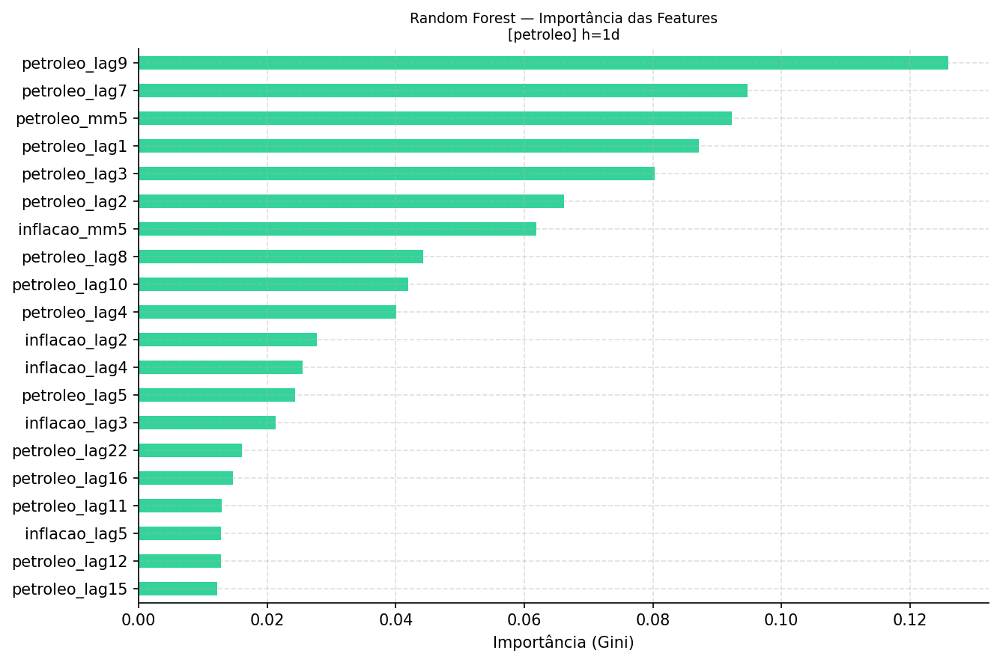


  [XGB] A treinar...
    Melhores parâmetros XGB: {'learning_rate': 0.1, 'n_estimators': 300, 'max_depth': 3, 'subsample': 0.7, 'colsample_bytree': 0.7} | RMSE val=4.06264
  XGBoost                        | RMSE=1.78662 | MAE=1.52113 | MAPE=2.27% | R²=-1.3079


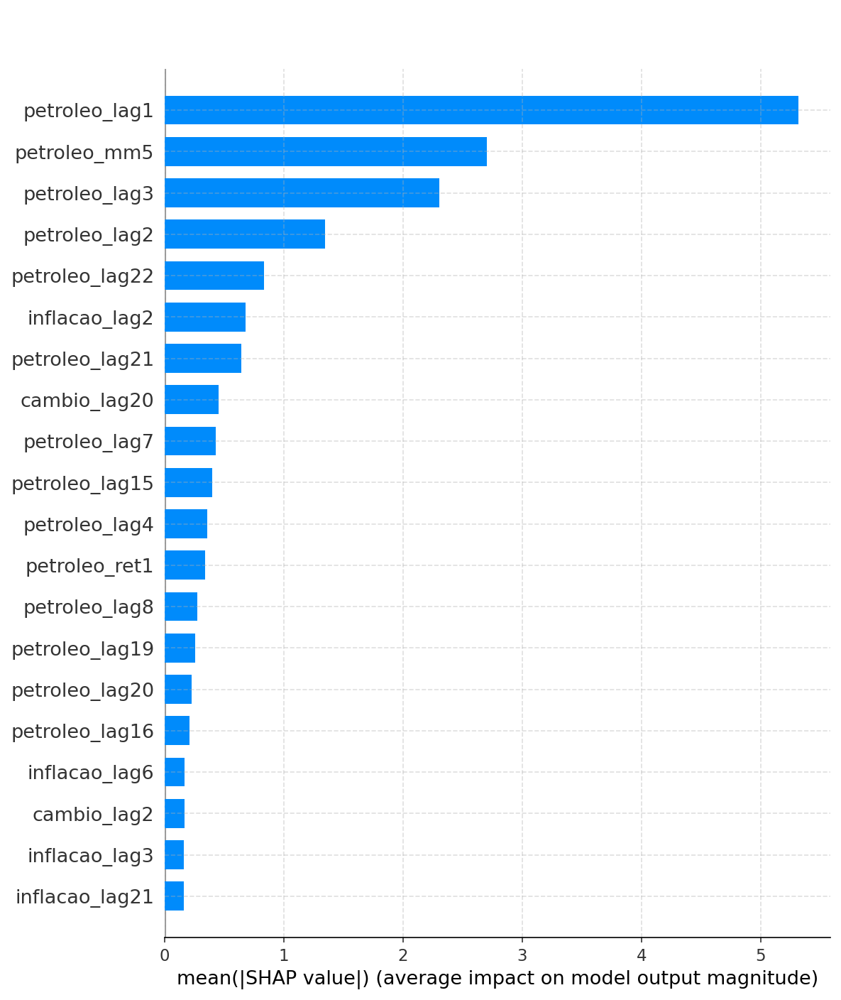


  [SVR] A treinar...
    Melhores parâmetros SVR: {'svr__C': 10, 'svr__epsilon': 0.1, 'svr__kernel': 'linear'}
  SVR                            | RMSE=1.96815 | MAE=1.49455 | MAPE=2.25% | R²=-1.8008


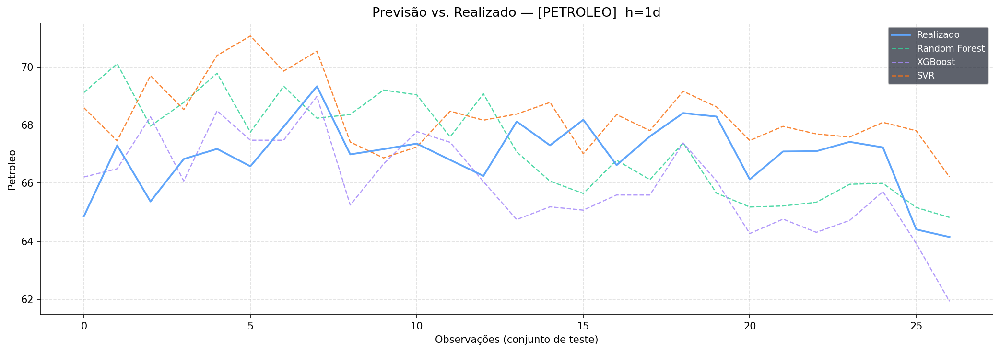


✅ Pipeline completo!


In [29]:
todos_resultados = []

for alvo in VARIAVEIS:
    print(f'\n{"═"*60}')
    print(f'  VARIÁVEL ALVO: {alvo.upper()}')
    print(f'{"═"*60}')

    for horizonte in HORIZONTES:
        print(f'\n  ── Horizonte: {horizonte} dia(s) ──')

        # 3.1 Feature engineering
        d = criar_features(df, alvo=alvo, horizonte=horizonte)
        X_train, y_train, X_val, y_val, X_test, y_test = dividir_dados(d)
        feature_names = list(X_train.columns)
        preds_test = {}

        # 3.2 Random Forest
        print('\n  [RF] A treinar...')
        rf = treinar_random_forest(X_train, y_train, X_val, y_val)
        pred_rf = rf.predict(X_test)
        preds_test['Random Forest'] = pred_rf
        met = calcular_metricas(y_test.values, pred_rf, 'Random Forest')
        met.update({'variavel': alvo, 'horizonte': horizonte})
        todos_resultados.append(met)
        if horizonte == 1:
            plotar_importancia_rf(rf, feature_names, alvo, horizonte)

        # 3.3 XGBoost
        print('\n  [XGB] A treinar...')
        xgb_m = treinar_xgboost(X_train, y_train, X_val, y_val)
        pred_xgb = xgb_m.predict(X_test)
        preds_test['XGBoost'] = pred_xgb
        met = calcular_metricas(y_test.values, pred_xgb, 'XGBoost')
        met.update({'variavel': alvo, 'horizonte': horizonte})
        todos_resultados.append(met)
        if horizonte == 1:
            analise_shap(xgb_m, X_test, alvo, horizonte)

        # 3.4 SVR
        print('\n  [SVR] A treinar...')
        svr = treinar_svr(X_train, y_train, X_val, y_val)
        pred_svr = svr.predict(X_test)
        preds_test['SVR'] = pred_svr
        met = calcular_metricas(y_test.values, pred_svr, 'SVR')
        met.update({'variavel': alvo, 'horizonte': horizonte})
        todos_resultados.append(met)

        # 3.5 Gráfico comparativo
        plotar_previsoes(y_test, preds_test, alvo, horizonte)

print('\n✅ Pipeline completo!')

---
## Tabela Comparativa Final

In [30]:
df_res = pd.DataFrame(todos_resultados)
df_res = df_res[['variavel', 'horizonte', 'modelo', 'RMSE', 'MAE', 'MAPE', 'R2']]
df_res = df_res.sort_values(['variavel', 'horizonte', 'RMSE']).reset_index(drop=True)

# Guardar CSV
df_res.to_csv('fase3_resultados_ML.csv', index=False)
print('✅ Resultados guardados em fase3_resultados_ML.csv\n')

# Estilo da tabela no notebook
df_res.style \
    .background_gradient(subset=['RMSE', 'MAE', 'MAPE'], cmap='YlOrRd') \
    .background_gradient(subset=['R2'], cmap='Greens') \
    .format({'RMSE': '{:.5f}', 'MAE': '{:.5f}', 'MAPE': '{:.2f}%', 'R2': '{:.4f}'})

✅ Resultados guardados em fase3_resultados_ML.csv



,variavel,horizonte,modelo,RMSE,MAE,MAPE,R2
0,cambio,1,SVR,0.09547,0.06639,2.65%,-0.0930
1,cambio,1,XGBoost,0.13837,0.11075,4.41%,-1.2961
2,cambio,1,Random Forest,0.20012,0.17059,6.78%,-3.8029
3,inflacao,1,SVR,0.03424,0.03011,1.30%,0.7901
4,inflacao,1,XGBoost,0.04906,0.04059,1.77%,0.5692
5,inflacao,1,Random Forest,0.05312,0.04460,1.94%,0.4949
6,petroleo,1,XGBoost,1.78662,1.52113,2.27%,-1.3079
7,petroleo,1,Random Forest,1.89112,1.68042,2.51%,-1.5858
8,petroleo,1,SVR,1.96815,1.49455,2.25%,-1.8008


---
## Heatmap de Métricas por Horizonte

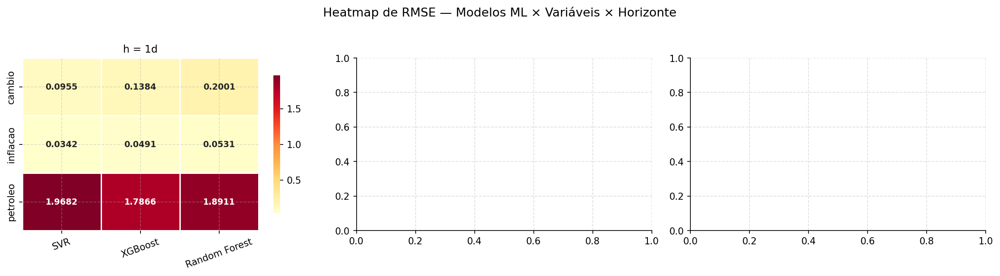

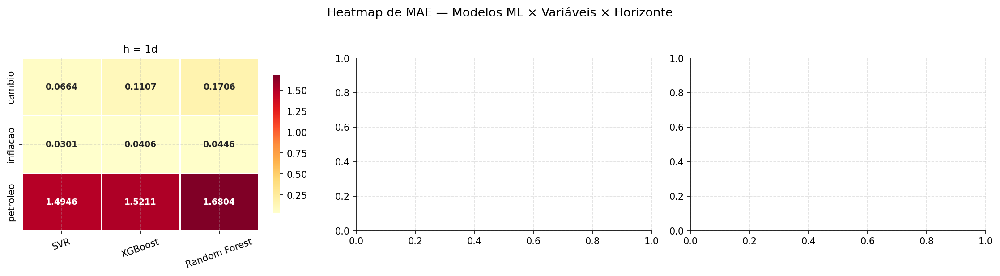

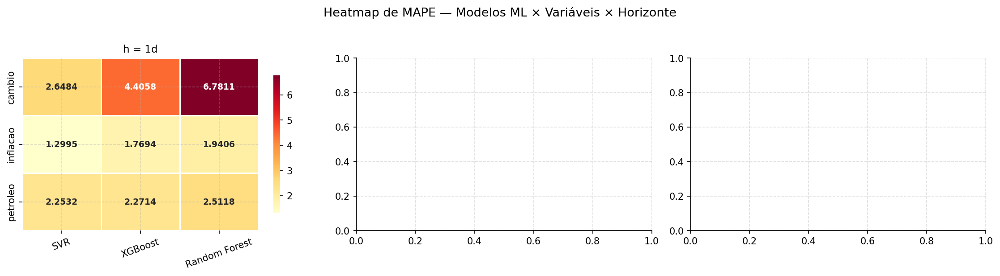

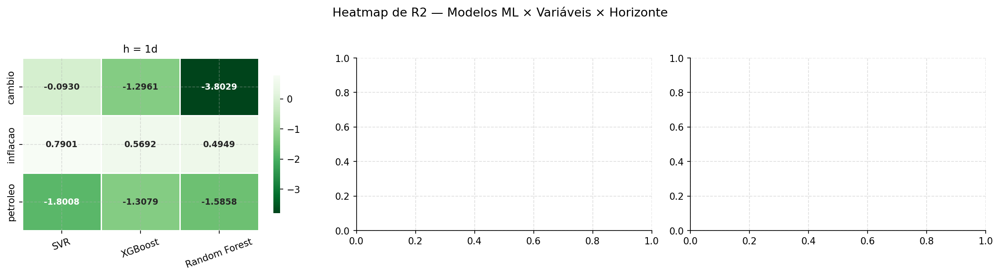

In [31]:
def plotar_heatmap(df_res: pd.DataFrame, metrica: str = 'RMSE'):
    """Heatmap variável × modelo para cada horizonte."""
    modelos   = df_res['modelo'].unique()
    horizontes = sorted(df_res['horizonte'].unique())

    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    for ax, h in zip(axes, horizontes):
        sub   = df_res[df_res['horizonte'] == h]
        pivot = sub.pivot(index='variavel', columns='modelo', values=metrica)
        pivot = pivot.reindex(columns=modelos)

        sns.heatmap(
            pivot, ax=ax, cmap='YlOrRd' if metrica != 'R2' else 'Greens_r',
            annot=True, fmt='.4f', linewidths=0.5,
            cbar_kws={'shrink': 0.8},
            annot_kws={'size': 9, 'weight': 'bold'}
        )
        ax.set_title(f'h = {h}d', fontsize=11)
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.tick_params(axis='x', rotation=20)

    fig.suptitle(f'Heatmap de {metrica} — Modelos ML × Variáveis × Horizonte', fontsize=13, y=1.02)
    plt.tight_layout()
    plt.savefig(f'heatmap_{metrica}_ML.png', dpi=150, bbox_inches='tight')
    plt.show()


for metrica in ['RMSE', 'MAE', 'MAPE', 'R2']:
    plotar_heatmap(df_res, metrica)

---
## ✅ Fase 3 Concluída

**Outputs gerados:**
- `fase3_resultados_ML.csv` — tabela completa de métricas
- `rf_importancia_{var}_h{h}.png` — importância de features RF (h=1d)
- `xgb_shap_{var}_h{h}.png` — SHAP values XGBoost (h=1d)
- `ml_previsao_{var}_h{h}.png` — gráficos previsão vs. realizado
- `heatmap_{metrica}_ML.png` — heatmaps comparativos

**Próximo passo → Fase 4: Modelos de Deep Learning (LSTM · GRU)**

# Fase 4 — Modelos de Deep Learning
**Previsão de Variáveis Macroeconómicas e Financeiras**  
Doutoramento em Matemática e Aplicações

---

| Modelos | Variáveis | Horizontes | Métricas |
|---|---|---|---|
| LSTM · GRU | Câmbio · Inflação · Petróleo | 1d · 5d · 22d | RMSE · MAE · MAPE · R² |

---
**Tarefas desta fase:**
- `4.1` Preparação das sequências temporais (sliding windows + normalização + tensores 3D)
- `4.2` Arquitectura e implementação do LSTM
- `4.3` Arquitectura e implementação do GRU
- `4.4` Tuning de hiperparâmetros (Keras Tuner / Optuna)
- `4.5` Avaliação, comparação e análise de overfitting

---
## 4.0.1 — Instalação de dependências

In [32]:
%%capture
# Instalar dependências (executar uma vez)
!pip install tensorflow keras keras-tuner optuna matplotlib pandas numpy scikit-learn seaborn

## 4.0.2 — Importações e Configuração Global

In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, callbacks, optimizers
from tensorflow.keras.models import Sequential
import keras_tuner as kt
import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# ── Reprodutibilidade ────────────────────────────────────────────────────────
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ── Estilo dos gráficos ──────────────────────────────────────────────────────
#plt.rcParams.update({
 #   'figure.facecolor': '#0f1117',
 #   'axes.facecolor':   '#1a1f2e',
 #   'axes.edgecolor':   '#2d3748',
 #   'axes.labelcolor':  '#94a3b8',
 #   'xtick.color':      '#94a3b8',
 #   'ytick.color':      '#94a3b8',
 #   'text.color':       '#e2e8f0',
 #   'grid.color':       '#2d3748',
 #   'grid.linestyle':   '--',
 #   'grid.alpha':       0.4,
 #   'axes.grid':        True,
 #   'font.family':      'sans-serif',
 #   'legend.facecolor': '#1a1f2e',
 #   'legend.labelcolor':'#e2e8f0',
#})

# ── Configuração global ──────────────────────────────────────────────────────
VARIAVEIS   = ['cambio', 'inflacao', 'petroleo']
HORIZONTES  = [1, 5, 22]      # dias úteis
LOOKBACK    = 30              # tamanho da janela deslizante (dias)
TRAIN_FRAC  = 0.70
VAL_FRAC    = 0.15
# TEST_FRAC = 0.15 (restante)
BATCH_SIZE  = 32
MAX_EPOCHS  = 150
N_TRIALS    = 30              # trials Optuna por combinação

print(f'TensorFlow: {tf.__version__}')
print(f'GPU disponível: {len(tf.config.list_physical_devices("GPU")) > 0}')
print('✅ Importações concluídas.')

TensorFlow: 2.19.0
GPU disponível: True
✅ Importações concluídas.


---
## 4.1 — Preparação das Sequências Temporais

Os modelos LSTM/GRU recebem tensores 3D com forma **[amostras, passos de tempo, features]**.

**Pipeline de preparação:**
1. Dividir os dados em treino / validação / teste (70/15/15) **antes** de normalizar
2. Ajustar o `MinMaxScaler` **apenas** no conjunto de treino → aplicar aos restantes
3. Construir janelas deslizantes (*sliding windows*) de tamanho `LOOKBACK`
4. Formatar tensores 3D

> ⚠️ Normalizar antes de dividir causaria *data leakage*.

In [42]:
def dividir_series(df: pd.DataFrame):
    """Divisão temporal 70/15/15 — preserva ordem temporal."""
    n       = len(df)
    n_train = int(n * TRAIN_FRAC)
    n_val   = int(n * VAL_FRAC)
    return (
        df.iloc[:n_train],
        df.iloc[n_train : n_train + n_val],
        df.iloc[n_train + n_val:]
    )


def normalizar(df_train, df_val, df_test):
    """
    Ajusta MinMaxScaler no treino e transforma treino/val/teste.
    Retorna arrays normalizados e o scaler (para inverter depois).
    """
    scaler = MinMaxScaler(feature_range=(0, 1))
    train_sc = scaler.fit_transform(df_train.values)
    val_sc   = scaler.transform(df_val.values)
    test_sc  = scaler.transform(df_test.values)
    return train_sc, val_sc, test_sc, scaler


def criar_sequencias(data: np.ndarray, alvo_idx: int,
                     lookback: int, horizonte: int):
    """
    Cria janelas deslizantes para input (X) e target (y).

    Parâmetros
    ----------
    data      : array normalizado [n_obs, n_features]
    alvo_idx  : índice da coluna alvo em 'data'
    lookback  : tamanho da janela de input (passos de tempo)
    horizonte : quantos dias à frente prever

    Retorna
    -------
    X : [amostras, lookback, n_features]  — tensor 3D
    y : [amostras]                        — valores alvo
    """
    X, y = [], []
    for i in range(lookback, len(data) - horizonte + 1):
        X.append(data[i - lookback : i, :])         # janela histórica
        y.append(data[i + horizonte - 1, alvo_idx]) # valor futuro
    return np.array(X), np.array(y)


def preparar_dados_dl(df: pd.DataFrame, alvo: str, horizonte: int, lookback: int = LOOKBACK):
    """
    Pipeline completo: divisão → normalização → sequências.
    Retorna X/y de treino, validação e teste + scaler.
    """
    alvo_idx = list(df.columns).index(alvo)

    # 1. Divisão temporal
    df_train, df_val, df_test = dividir_series(df)

    # Garantir que não há NaNs após a divisão, especialmente em alvos
    df_train = df_train.dropna()
    df_val = df_val.dropna()
    df_test = df_test.dropna()

    # 2. Normalização (fit apenas no treino)
    train_sc, val_sc, test_sc, scaler = normalizar(df_train, df_val, df_test)

    # 3. Janelas deslizantes
    X_train, y_train = criar_sequencias(train_sc, alvo_idx, lookback, horizonte)
    X_val,   y_val   = criar_sequencias(val_sc,   alvo_idx, lookback, horizonte)
    X_test,  y_test  = criar_sequencias(test_sc,  alvo_idx, lookback, horizonte)

    print(f'  [{alvo}] h={horizonte}d | '
          f'X_train={X_train.shape} | X_val={X_val.shape} | X_test={X_test.shape}')

    return X_train, y_train, X_val, y_val, X_test, y_test, scaler, alvo_idx


# ── Verificação visual das sequências (câmbio, h=1d) ────────────────────────
print('Exemplo de dimensões (câmbio, h=1d):')
Xtr, ytr, Xv, yv, Xte, yte, sc, idx = preparar_dados_dl(df, 'cambio', 1)
print(f'  Tensor X_train: {Xtr.shape}  →  [amostras, lookback={LOOKBACK}, features={len(VARIAVEIS)}]')
print(f'  Vector y_train: {ytr.shape}')

Exemplo de dimensões (câmbio, h=1d):
  [cambio] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  Tensor X_train: (821, 30, 3)  →  [amostras, lookback=30, features=3]
  Vector y_train: (821,)


---
## 4.2 — Arquitectura e Implementação do LSTM

**Arquitectura base:**
```
Input  →  LSTM(units, return_sequences=True)
       →  Dropout(rate)
       →  LSTM(units // 2)
       →  Dropout(rate)
       →  Dense(32, activation='relu')
       →  Dense(1)   ← previsão escalar
```

**Callbacks utilizados:**
- `EarlyStopping` — interrompe se val_loss não melhora após `patience` epochs
- `ReduceLROnPlateau` — reduz `lr` quando val_loss estagna
- `ModelCheckpoint` — guarda os melhores pesos

In [43]:
def construir_lstm(input_shape: tuple,
                   units: int   = 128,
                   dropout: float = 0.2,
                   lr: float    = 1e-3) -> keras.Model:
    """
    Constrói modelo LSTM empilhado.

    Parâmetros
    ----------
    input_shape : (lookback, n_features)
    units       : número de unidades na 1ª camada LSTM
    dropout     : taxa de Dropout entre camadas
    lr          : learning rate do optimizador Adam
    """
    model = Sequential([
        layers.Input(shape=input_shape),
        layers.LSTM(units, return_sequences=True),
        layers.Dropout(dropout),
        layers.LSTM(units // 2),
        layers.Dropout(dropout),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ], name='LSTM')

    model.compile(
        optimizer=optimizers.Adam(learning_rate=lr),
        loss='mse',
        metrics=['mae']
    )
    return model


def get_callbacks(nome_modelo: str, alvo: str, horizonte: int) -> list:
    """Callbacks padrão: EarlyStopping + ReduceLROnPlateau + ModelCheckpoint."""
    filepath = f'best_{nome_modelo}_{alvo}_h{horizonte}.weights.h5'
    return [
        callbacks.EarlyStopping(
            monitor='val_loss', patience=20,
            restore_best_weights=True, verbose=0
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss', factor=0.5,
            patience=10, min_lr=1e-6, verbose=0
        ),
        callbacks.ModelCheckpoint(
            filepath=filepath, monitor='val_loss',
            save_best_only=True, save_weights_only=True, verbose=0
        ),
    ]


# ── Resumo da arquitectura base ──────────────────────────────────────────────
modelo_demo = construir_lstm(input_shape=(LOOKBACK, len(VARIAVEIS)))
modelo_demo.summary()

Model: "LSTM"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_126 (LSTM)                 │ (None, 30, 128)        │        67,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_128 (Dropout)           │ (None, 30, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_127 (LSTM)                 │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_129 (Dropout)           │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 119,105 (465.25 KB)

 Trainable params: 119,105 (465.25 KB)

 Non-trainable params: 0 (0.00 B)

---
## 4.3 — Arquitectura e Implementação do GRU

**Arquitectura análoga ao LSTM** mas com células GRU — menor número de parâmetros, frequentemente equivalente em séries macroeconómicas.

```
Input  →  GRU(units, return_sequences=True)
       →  Dropout(rate)
       →  GRU(units // 2)
       →  Dropout(rate)
       →  Dense(32, activation='relu')
       →  Dense(1)
```

In [44]:
def construir_gru(input_shape: tuple,
                  units: int   = 128,
                  dropout: float = 0.2,
                  lr: float    = 1e-3) -> keras.Model:
    """
    Constrói modelo GRU empilhado.

    Parâmetros
    ----------
    input_shape : (lookback, n_features)
    units       : número de unidades na 1ª camada GRU
    dropout     : taxa de Dropout entre camadas
    lr          : learning rate do optimizador Adam
    """
    model = Sequential([
        layers.Input(shape=input_shape),
        layers.GRU(units, return_sequences=True),
        layers.Dropout(dropout),
        layers.GRU(units // 2),
        layers.Dropout(dropout),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ], name='GRU')

    model.compile(
        optimizer=optimizers.Adam(learning_rate=lr),
        loss='mse',
        metrics=['mae']
    )
    return model


# ── Comparação de parâmetros LSTM vs GRU ─────────────────────────────────────
gru_demo  = construir_gru(input_shape=(LOOKBACK, len(VARIAVEIS)))
lstm_demo = construir_lstm(input_shape=(LOOKBACK, len(VARIAVEIS)))

print('── Parâmetros treináveis ──────────────────────────────')
print(f'  LSTM : {lstm_demo.count_params():,}')
print(f'  GRU  : {gru_demo.count_params():,}')
print(f'  Redução: {(1 - gru_demo.count_params()/lstm_demo.count_params())*100:.1f}%')

── Parâmetros treináveis ──────────────────────────────
  LSTM : 119,105
  GRU  : 90,433
  Redução: 24.1%


---
## 4.4 — Tuning de Hiperparâmetros com Optuna

**Hiperparâmetros optimizados:**

| Hiperparâmetro | Espaço de busca |
|---|---|
| `units` (1ª camada) | {32, 64, 128, 256} |
| `dropout` | [0.1, 0.5] |
| `learning_rate` | [1e-4, 1e-2] log-uniform |
| `lookback` | {10, 20, 30, 45, 60} |
| `batch_size` | {16, 32, 64} |

**Estratégia:** minimizar `val_loss` (MSE) com `TPE Sampler` e pruning de trials improdutivos.

In [45]:
def objectivo_optuna(trial, tipo_modelo: str,
                     df: pd.DataFrame, alvo: str, horizonte: int) -> float:
    """
    Função objectivo Optuna: treina um modelo LSTM ou GRU com
    hiperparâmetros sugeridos e devolve a val_loss.
    """
    # Sugerir hiperparâmetros
    units      = trial.suggest_categorical('units',      [32, 64, 128, 256])
    dropout    = trial.suggest_float('dropout',          0.1, 0.5)
    lr         = trial.suggest_float('lr',               1e-4, 1e-2, log=True)
    lookback   = trial.suggest_categorical('lookback',   [10, 20, 30, 45, 60])
    batch_size = trial.suggest_categorical('batch_size', [16, 32, 64])

    # Preparar dados com este lookback
    X_train, y_train, X_val, y_val, _, _, _, _ = preparar_dados_dl(
        df, alvo, horizonte, lookback=lookback)

    input_shape = (lookback, len(VARIAVEIS))

    # Construir modelo
    if tipo_modelo == 'LSTM':
        model = construir_lstm(input_shape, units=units, dropout=dropout, lr=lr)
    else:
        model = construir_gru(input_shape, units=units, dropout=dropout, lr=lr)

    # Treinar com early stopping
    cb = [
        callbacks.EarlyStopping(monitor='val_loss', patience=15,
                                restore_best_weights=True, verbose=0),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                                    patience=8, min_lr=1e-6, verbose=0),
    ]
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=MAX_EPOCHS,
        batch_size=batch_size,
        callbacks=cb,
        verbose=0
    )
    val_loss = min(history.history['val_loss'])
    # Handle NaN values for val_loss
    if np.isnan(val_loss):
        return float('inf') # Return a very large value to penalize this trial
    return val_loss


def optimizar_hiperparametros(tipo_modelo: str, df: pd.DataFrame,
                               alvo: str, horizonte: int,
                               n_trials: int = N_TRIALS) -> dict:
    """
    Corre o estudo Optuna e devolve os melhores hiperparâmetros.
    """
    study = optuna.create_study(
        direction='minimize',
        sampler=optuna.samplers.TPESampler(seed=SEED),
        pruner=optuna.pruners.MedianPruner(n_warmup_steps=5)
    )
    study.optimize(
        lambda trial: objectivo_optuna(trial, tipo_modelo, df, alvo, horizonte),
        n_trials=n_trials,
        show_progress_bar=True
    )
    print(f'    [{tipo_modelo}] Melhores params: {study.best_params}')
    print(f'    [{tipo_modelo}] Melhor val_loss : {study.best_value:.6f}')
    return study.best_params

print('✅ Funções Optuna definidas.')

✅ Funções Optuna definidas.


---
## Pipeline Principal — Treino Final com Melhores Hiperparâmetros

Para cada combinação variável × horizonte:
1. Optimizar hiperparâmetros com Optuna
2. Re-treinar LSTM e GRU com os melhores parâmetros
3. Inverter a normalização para obter previsões na escala original
4. Calcular métricas no conjunto de teste

In [46]:
def calcular_metricas(y_real, y_pred, nome: str) -> dict:
    """Calcula RMSE, MAE, MAPE e R² e imprime os resultados."""
    rmse = np.sqrt(mean_squared_error(y_real, y_pred))
    mae  = mean_absolute_error(y_real, y_pred)
    mape = np.mean(np.abs((y_real - y_pred) / (np.abs(y_real) + 1e-10))) * 100
    r2   = r2_score(y_real, y_pred)
    print(f'  {nome:30s} | RMSE={rmse:.5f} | MAE={mae:.5f} | MAPE={mape:.2f}% | R²={r2:.4f}')
    return {'modelo': nome, 'RMSE': rmse, 'MAE': mae, 'MAPE': mape, 'R2': r2}


def treinar_modelo_final(tipo: str, df: pd.DataFrame,
                          alvo: str, horizonte: int,
                          best_params: dict):
    """
    Treina o modelo final (LSTM ou GRU) com os melhores hiperparâmetros.
    Devolve o modelo treinado, o histórico e os arrays X/y de teste + scaler.
    """
    lookback   = best_params['lookback']
    units      = best_params['units']
    dropout    = best_params['dropout']
    lr         = best_params['lr']
    batch_size = best_params['batch_size']

    X_train, y_train, X_val, y_val, X_test, y_test, scaler, alvo_idx = \
        preparar_dados_dl(df, alvo, horizonte, lookback=lookback)

    input_shape = (lookback, len(VARIAVEIS))
    if tipo == 'LSTM':
        model = construir_lstm(input_shape, units=units, dropout=dropout, lr=lr)
    else:
        model = construir_gru(input_shape, units=units, dropout=dropout, lr=lr)

    cb = get_callbacks(tipo, alvo, horizonte)

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=MAX_EPOCHS,
        batch_size=batch_size,
        callbacks=cb,
        verbose=0
    )
    return model, history, X_test, y_test, scaler, alvo_idx


def inverter_normalizacao(y_norm: np.ndarray, scaler, alvo_idx: int,
                           n_features: int) -> np.ndarray:
    """
    Inverte a normalização MinMaxScaler para a escala original da série.
    Como o scaler foi ajustado em todas as features, é necessário reconstruir
    um array com as restantes colunas a zero antes de inverter.
    """
    dummy = np.zeros((len(y_norm), n_features))
    dummy[:, alvo_idx] = y_norm
    return scaler.inverse_transform(dummy)[:, alvo_idx]


# ── Execução principal ────────────────────────────────────────────────────────
todos_resultados_dl = []
historicos          = {}   # {(alvo, horizonte, tipo): history}
previsoes_dl        = {}   # {(alvo, horizonte): {'LSTM': pred, 'GRU': pred, 'real': y}}

for alvo in VARIAVEIS:
    print(f'\n{"═"*65}')
    print(f'  VARIÁVEL ALVO: {alvo.upper()}')
    print(f'{"═"*65}')

    for horizonte in HORIZONTES:
        print(f'\n  ── Horizonte: {horizonte} dia(s) ──')
        chave = (alvo, horizonte)
        previsoes_dl[chave] = {}

        for tipo in ['LSTM', 'GRU']:
            print(f'\n  [{tipo}] A optimizar hiperparâmetros...')

            # 4.4 Tuning
            best_params = optimizar_hiperparametros(tipo, df, alvo, horizonte)

            # Treino final
            print(f'  [{tipo}] A treinar modelo final...')
            model, hist, X_test, y_test_sc, scaler, alvo_idx = \
                treinar_modelo_final(tipo, df, alvo, horizonte, best_params)

            historicos[(alvo, horizonte, tipo)] = hist

            # Previsão e inversão da normalização
            pred_sc   = model.predict(X_test, verbose=0).flatten()
            pred_real = inverter_normalizacao(pred_sc, scaler, alvo_idx, len(VARIAVEIS))
            y_real    = inverter_normalizacao(y_test_sc, scaler, alvo_idx, len(VARIAVEIS))

            previsoes_dl[chave][tipo] = pred_real
            previsoes_dl[chave]['real'] = y_real

            # 4.5 Métricas
            met = calcular_metricas(y_real, pred_real, tipo)
            met.update({'variavel': alvo, 'horizonte': horizonte})
            todos_resultados_dl.append(met)

print('\n✅ Pipeline Deep Learning completo!')


═════════════════════════════════════════════════════════════════
  VARIÁVEL ALVO: CAMBIO
═════════════════════════════════════════════════════════════════

  ── Horizonte: 1 dia(s) ──

  [LSTM] A optimizar hiperparâmetros...


  0%|          | 0/30 [00:00<?, ?it/s]

  [cambio] h=1d | X_train=(831, 20, 3) | X_val=(164, 20, 3) | X_test=(162, 20, 3)
  [cambio] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [cambio] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [cambio] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  [cambio] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [cambio] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [cambio] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [cambio] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [cambio] h=1d | X_train=(806, 45, 3) | X_val=(139, 45, 3) | X_test=(137, 45, 3)
  [cambio] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  [cambio] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [cambio] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [cambio] h=1d 

  0%|          | 0/30 [00:00<?, ?it/s]

  [cambio] h=1d | X_train=(831, 20, 3) | X_val=(164, 20, 3) | X_test=(162, 20, 3)
  [cambio] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [cambio] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [cambio] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  [cambio] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [cambio] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [cambio] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [cambio] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [cambio] h=1d | X_train=(806, 45, 3) | X_val=(139, 45, 3) | X_test=(137, 45, 3)
  [cambio] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  [cambio] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [cambio] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [cambio] h=1d 

  GRU                            | RMSE=0.03525 | MAE=0.02938 | MAPE=1.22% | R²=0.8883

  ── Horizonte: 5 dia(s) ──

  [LSTM] A optimizar hiperparâmetros...


  0%|          | 0/30 [00:00<?, ?it/s]

  [cambio] h=5d | X_train=(827, 20, 3) | X_val=(160, 20, 3) | X_test=(158, 20, 3)
  [cambio] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [cambio] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [cambio] h=5d | X_train=(817, 30, 3) | X_val=(150, 30, 3) | X_test=(148, 30, 3)
  [cambio] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [cambio] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [cambio] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [cambio] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [cambio] h=5d | X_train=(802, 45, 3) | X_val=(135, 45, 3) | X_test=(133, 45, 3)
  [cambio] h=5d | X_train=(817, 30, 3) | X_val=(150, 30, 3) | X_test=(148, 30, 3)
  [cambio] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [cambio] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [cambio] h=5d 

  0%|          | 0/30 [00:00<?, ?it/s]

  [cambio] h=5d | X_train=(827, 20, 3) | X_val=(160, 20, 3) | X_test=(158, 20, 3)
  [cambio] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [cambio] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [cambio] h=5d | X_train=(817, 30, 3) | X_val=(150, 30, 3) | X_test=(148, 30, 3)
  [cambio] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [cambio] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [cambio] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [cambio] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [cambio] h=5d | X_train=(802, 45, 3) | X_val=(135, 45, 3) | X_test=(133, 45, 3)
  [cambio] h=5d | X_train=(817, 30, 3) | X_val=(150, 30, 3) | X_test=(148, 30, 3)
  [cambio] h=5d | X_train=(827, 20, 3) | X_val=(160, 20, 3) | X_test=(158, 20, 3)
  [cambio] h=5d | X_train=(827, 20, 3) | X_val=(160, 20, 3) | X_test=(158, 20, 3)
  [cambio] h=5d 

  0%|          | 0/30 [00:00<?, ?it/s]

  [cambio] h=22d | X_train=(810, 20, 3) | X_val=(143, 20, 3) | X_test=(141, 20, 3)
  [cambio] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [cambio] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [cambio] h=22d | X_train=(800, 30, 3) | X_val=(133, 30, 3) | X_test=(131, 30, 3)
  [cambio] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [cambio] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [cambio] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [cambio] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [cambio] h=22d | X_train=(785, 45, 3) | X_val=(118, 45, 3) | X_test=(116, 45, 3)
  [cambio] h=22d | X_train=(800, 30, 3) | X_val=(133, 30, 3) | X_test=(131, 30, 3)
  [cambio] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [cambio] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [c

  0%|          | 0/30 [00:00<?, ?it/s]

  [cambio] h=22d | X_train=(810, 20, 3) | X_val=(143, 20, 3) | X_test=(141, 20, 3)
  [cambio] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [cambio] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [cambio] h=22d | X_train=(800, 30, 3) | X_val=(133, 30, 3) | X_test=(131, 30, 3)
  [cambio] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [cambio] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [cambio] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [cambio] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [cambio] h=22d | X_train=(785, 45, 3) | X_val=(118, 45, 3) | X_test=(116, 45, 3)
  [cambio] h=22d | X_train=(800, 30, 3) | X_val=(133, 30, 3) | X_test=(131, 30, 3)
  [cambio] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [cambio] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [c

  0%|          | 0/30 [00:00<?, ?it/s]

  [inflacao] h=1d | X_train=(831, 20, 3) | X_val=(164, 20, 3) | X_test=(162, 20, 3)
  [inflacao] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [inflacao] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [inflacao] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  [inflacao] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [inflacao] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [inflacao] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [inflacao] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [inflacao] h=1d | X_train=(806, 45, 3) | X_val=(139, 45, 3) | X_test=(137, 45, 3)
  [inflacao] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  [inflacao] h=1d | X_train=(831, 20, 3) | X_val=(164, 20, 3) | X_test=(162, 20, 3)
  [inflacao] h=1d | X_train=(831, 20, 3) | X_val=(164, 20, 3) | X_test=(162,

  0%|          | 0/30 [00:00<?, ?it/s]

  [inflacao] h=1d | X_train=(831, 20, 3) | X_val=(164, 20, 3) | X_test=(162, 20, 3)
  [inflacao] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [inflacao] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [inflacao] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  [inflacao] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [inflacao] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [inflacao] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [inflacao] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [inflacao] h=1d | X_train=(806, 45, 3) | X_val=(139, 45, 3) | X_test=(137, 45, 3)
  [inflacao] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  [inflacao] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [inflacao] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122,

  0%|          | 0/30 [00:00<?, ?it/s]

  [inflacao] h=5d | X_train=(827, 20, 3) | X_val=(160, 20, 3) | X_test=(158, 20, 3)
  [inflacao] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [inflacao] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [inflacao] h=5d | X_train=(817, 30, 3) | X_val=(150, 30, 3) | X_test=(148, 30, 3)
  [inflacao] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [inflacao] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [inflacao] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [inflacao] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [inflacao] h=5d | X_train=(802, 45, 3) | X_val=(135, 45, 3) | X_test=(133, 45, 3)
  [inflacao] h=5d | X_train=(817, 30, 3) | X_val=(150, 30, 3) | X_test=(148, 30, 3)
  [inflacao] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [inflacao] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118,

  0%|          | 0/30 [00:00<?, ?it/s]

  [inflacao] h=5d | X_train=(827, 20, 3) | X_val=(160, 20, 3) | X_test=(158, 20, 3)
  [inflacao] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [inflacao] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [inflacao] h=5d | X_train=(817, 30, 3) | X_val=(150, 30, 3) | X_test=(148, 30, 3)
  [inflacao] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [inflacao] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [inflacao] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [inflacao] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [inflacao] h=5d | X_train=(802, 45, 3) | X_val=(135, 45, 3) | X_test=(133, 45, 3)
  [inflacao] h=5d | X_train=(817, 30, 3) | X_val=(150, 30, 3) | X_test=(148, 30, 3)
  [inflacao] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [inflacao] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118,

  0%|          | 0/30 [00:00<?, ?it/s]

  [inflacao] h=22d | X_train=(810, 20, 3) | X_val=(143, 20, 3) | X_test=(141, 20, 3)
  [inflacao] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [inflacao] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [inflacao] h=22d | X_train=(800, 30, 3) | X_val=(133, 30, 3) | X_test=(131, 30, 3)
  [inflacao] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [inflacao] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [inflacao] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [inflacao] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [inflacao] h=22d | X_train=(785, 45, 3) | X_val=(118, 45, 3) | X_test=(116, 45, 3)
  [inflacao] h=22d | X_train=(800, 30, 3) | X_val=(133, 30, 3) | X_test=(131, 30, 3)
  [inflacao] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [inflacao] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | 

  0%|          | 0/30 [00:00<?, ?it/s]

  [inflacao] h=22d | X_train=(810, 20, 3) | X_val=(143, 20, 3) | X_test=(141, 20, 3)
  [inflacao] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [inflacao] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [inflacao] h=22d | X_train=(800, 30, 3) | X_val=(133, 30, 3) | X_test=(131, 30, 3)
  [inflacao] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [inflacao] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [inflacao] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [inflacao] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [inflacao] h=22d | X_train=(785, 45, 3) | X_val=(118, 45, 3) | X_test=(116, 45, 3)
  [inflacao] h=22d | X_train=(800, 30, 3) | X_val=(133, 30, 3) | X_test=(131, 30, 3)
  [inflacao] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [inflacao] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | 

  0%|          | 0/30 [00:00<?, ?it/s]

  [petroleo] h=1d | X_train=(831, 20, 3) | X_val=(164, 20, 3) | X_test=(162, 20, 3)
  [petroleo] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [petroleo] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [petroleo] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  [petroleo] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [petroleo] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [petroleo] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [petroleo] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [petroleo] h=1d | X_train=(806, 45, 3) | X_val=(139, 45, 3) | X_test=(137, 45, 3)
  [petroleo] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  [petroleo] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [petroleo] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122,

  0%|          | 0/30 [00:00<?, ?it/s]

  [petroleo] h=1d | X_train=(831, 20, 3) | X_val=(164, 20, 3) | X_test=(162, 20, 3)
  [petroleo] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [petroleo] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [petroleo] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  [petroleo] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [petroleo] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [petroleo] h=1d | X_train=(791, 60, 3) | X_val=(124, 60, 3) | X_test=(122, 60, 3)
  [petroleo] h=1d | X_train=(841, 10, 3) | X_val=(174, 10, 3) | X_test=(172, 10, 3)
  [petroleo] h=1d | X_train=(806, 45, 3) | X_val=(139, 45, 3) | X_test=(137, 45, 3)
  [petroleo] h=1d | X_train=(821, 30, 3) | X_val=(154, 30, 3) | X_test=(152, 30, 3)
  [petroleo] h=1d | X_train=(831, 20, 3) | X_val=(164, 20, 3) | X_test=(162, 20, 3)
  [petroleo] h=1d | X_train=(831, 20, 3) | X_val=(164, 20, 3) | X_test=(162,

  0%|          | 0/30 [00:00<?, ?it/s]

  [petroleo] h=5d | X_train=(827, 20, 3) | X_val=(160, 20, 3) | X_test=(158, 20, 3)
  [petroleo] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [petroleo] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [petroleo] h=5d | X_train=(817, 30, 3) | X_val=(150, 30, 3) | X_test=(148, 30, 3)
  [petroleo] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [petroleo] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [petroleo] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [petroleo] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [petroleo] h=5d | X_train=(802, 45, 3) | X_val=(135, 45, 3) | X_test=(133, 45, 3)
  [petroleo] h=5d | X_train=(817, 30, 3) | X_val=(150, 30, 3) | X_test=(148, 30, 3)
  [petroleo] h=5d | X_train=(827, 20, 3) | X_val=(160, 20, 3) | X_test=(158, 20, 3)
  [petroleo] h=5d | X_train=(827, 20, 3) | X_val=(160, 20, 3) | X_test=(158,

  0%|          | 0/30 [00:00<?, ?it/s]

  [petroleo] h=5d | X_train=(827, 20, 3) | X_val=(160, 20, 3) | X_test=(158, 20, 3)
  [petroleo] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [petroleo] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [petroleo] h=5d | X_train=(817, 30, 3) | X_val=(150, 30, 3) | X_test=(148, 30, 3)
  [petroleo] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [petroleo] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [petroleo] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [petroleo] h=5d | X_train=(837, 10, 3) | X_val=(170, 10, 3) | X_test=(168, 10, 3)
  [petroleo] h=5d | X_train=(802, 45, 3) | X_val=(135, 45, 3) | X_test=(133, 45, 3)
  [petroleo] h=5d | X_train=(817, 30, 3) | X_val=(150, 30, 3) | X_test=(148, 30, 3)
  [petroleo] h=5d | X_train=(787, 60, 3) | X_val=(120, 60, 3) | X_test=(118, 60, 3)
  [petroleo] h=5d | X_train=(827, 20, 3) | X_val=(160, 20, 3) | X_test=(158,

  0%|          | 0/30 [00:00<?, ?it/s]

  [petroleo] h=22d | X_train=(810, 20, 3) | X_val=(143, 20, 3) | X_test=(141, 20, 3)
  [petroleo] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [petroleo] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [petroleo] h=22d | X_train=(800, 30, 3) | X_val=(133, 30, 3) | X_test=(131, 30, 3)
  [petroleo] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [petroleo] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [petroleo] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [petroleo] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [petroleo] h=22d | X_train=(785, 45, 3) | X_val=(118, 45, 3) | X_test=(116, 45, 3)
  [petroleo] h=22d | X_train=(800, 30, 3) | X_val=(133, 30, 3) | X_test=(131, 30, 3)
  [petroleo] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [petroleo] h=22d | X_train=(785, 45, 3) | X_val=(118, 45, 3) | 

  0%|          | 0/30 [00:00<?, ?it/s]

  [petroleo] h=22d | X_train=(810, 20, 3) | X_val=(143, 20, 3) | X_test=(141, 20, 3)
  [petroleo] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [petroleo] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [petroleo] h=22d | X_train=(800, 30, 3) | X_val=(133, 30, 3) | X_test=(131, 30, 3)
  [petroleo] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [petroleo] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [petroleo] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [petroleo] h=22d | X_train=(820, 10, 3) | X_val=(153, 10, 3) | X_test=(151, 10, 3)
  [petroleo] h=22d | X_train=(785, 45, 3) | X_val=(118, 45, 3) | X_test=(116, 45, 3)
  [petroleo] h=22d | X_train=(800, 30, 3) | X_val=(133, 30, 3) | X_test=(131, 30, 3)
  [petroleo] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | X_test=(101, 60, 3)
  [petroleo] h=22d | X_train=(770, 60, 3) | X_val=(103, 60, 3) | 

---
## 4.5 — Avaliação: Curvas de Treino/Validação (Loss Curves)

Visualização das curvas de `loss` (MSE) ao longo das epochs para detectar:
- **Overfitting** — val_loss cresce enquanto train_loss diminui
- **Underfitting** — ambas as losses permanecem elevadas
- **Convergência saudável** — ambas as curvas estabilizam próximo

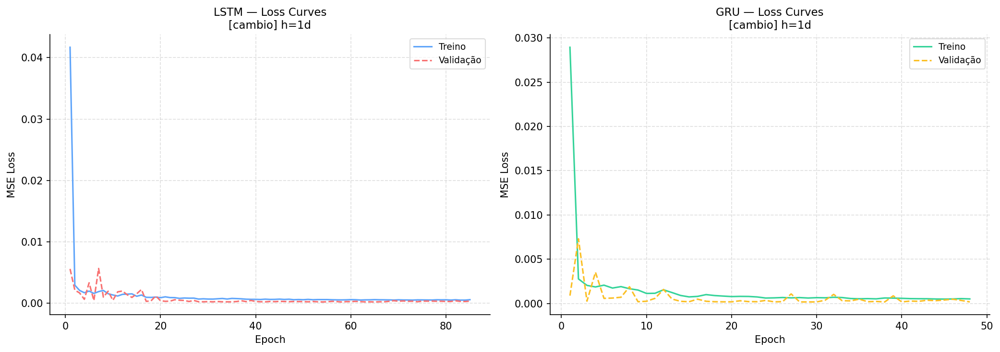

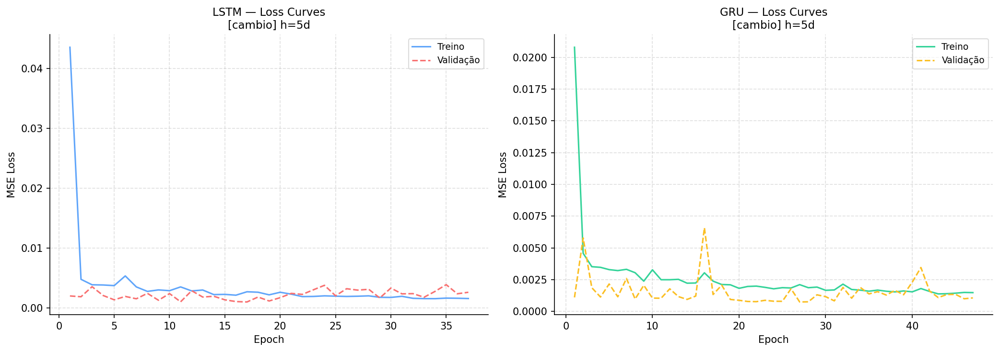

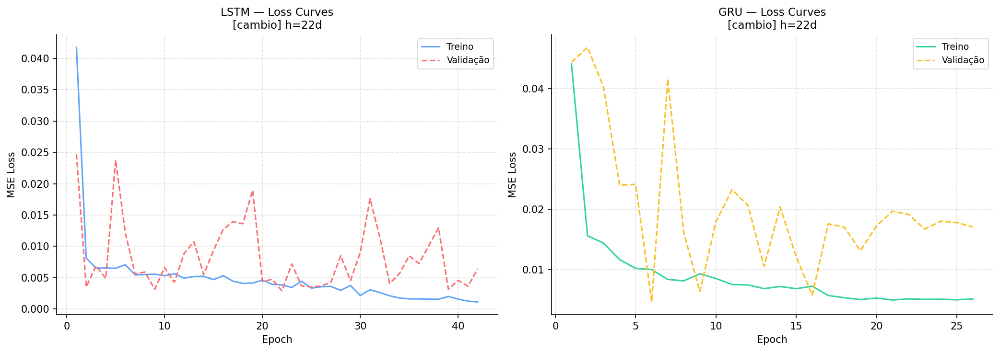

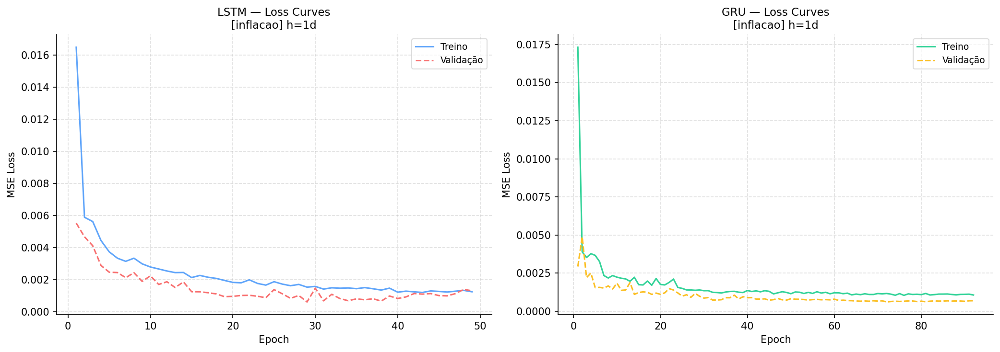

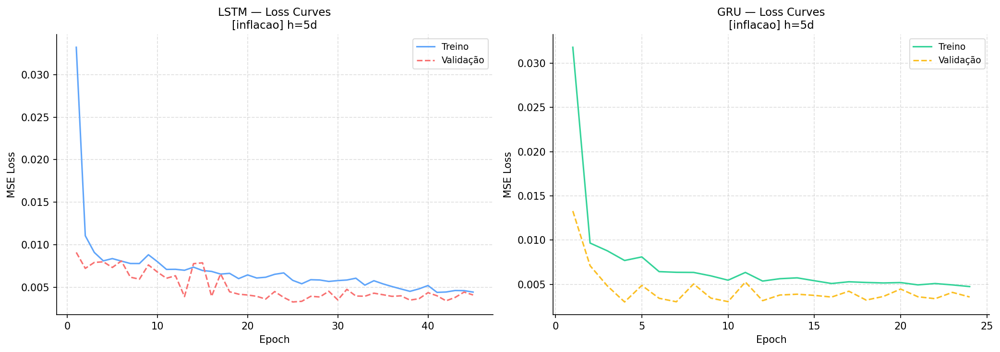

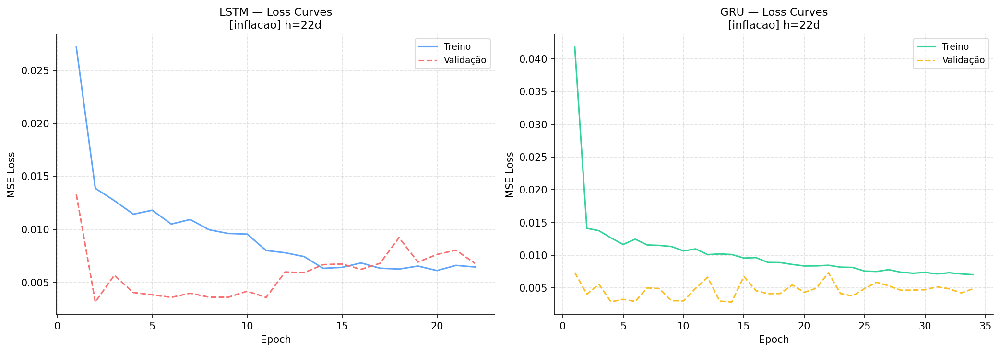

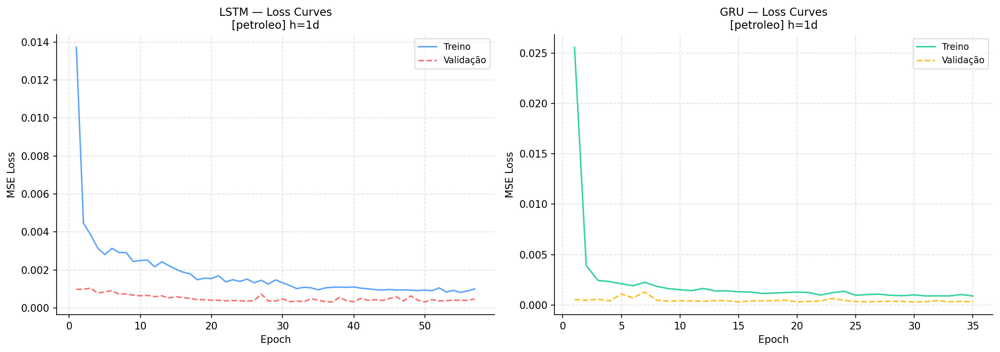

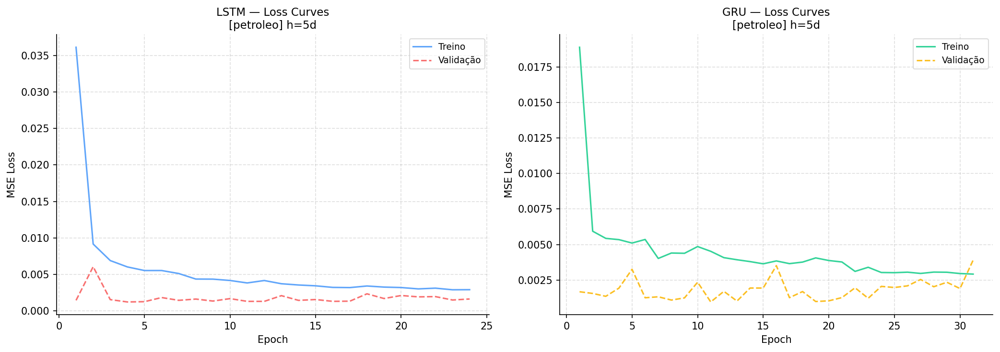

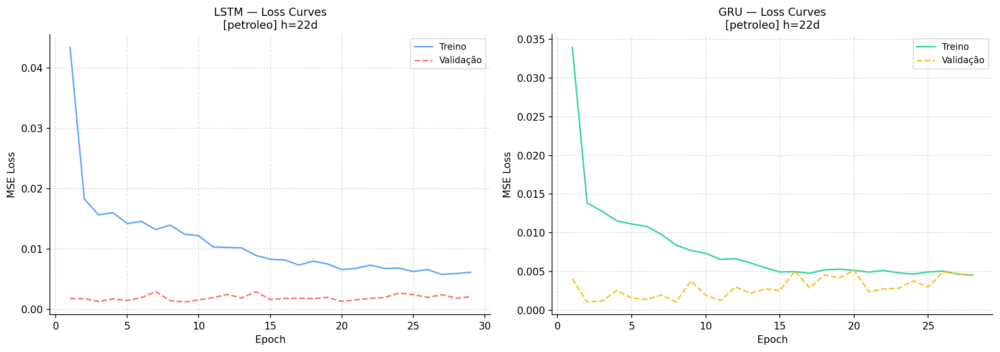

In [47]:
def plotar_loss_curves(historicos: dict, alvo: str, horizonte: int):
    """Loss curves de treino e validação para LSTM e GRU."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    tipos = ['LSTM', 'GRU']
    cores_treino = ['#60a5fa', '#34d399']
    cores_val    = ['#f87171', '#fbbf24']

    for ax, tipo, ct, cv in zip(axes, tipos, cores_treino, cores_val):
        hist = historicos.get((alvo, horizonte, tipo))
        if hist is None:
            ax.set_title(f'{tipo} — sem dados', fontsize=11)
            continue
        epochs = range(1, len(hist.history['loss']) + 1)
        ax.plot(epochs, hist.history['loss'],     color=ct, lw=1.5, label='Treino')
        ax.plot(epochs, hist.history['val_loss'], color=cv, lw=1.5, ls='--', label='Validação')
        ax.set_title(f'{tipo} — Loss Curves\n[{alvo}] h={horizonte}d', fontsize=11)
        ax.set_xlabel('Epoch')
        ax.set_ylabel('MSE Loss')
        ax.legend(fontsize=9)

    plt.tight_layout()
    plt.savefig(f'dl_loss_{alvo}_h{horizonte}.png', dpi=150, bbox_inches='tight')
    plt.show()


# ── Gerar loss curves para todas as combinações ──────────────────────────────
for alvo in VARIAVEIS:
    for horizonte in HORIZONTES:
        plotar_loss_curves(historicos, alvo, horizonte)

## 4.6 — Gráficos de Previsão vs. Realizado

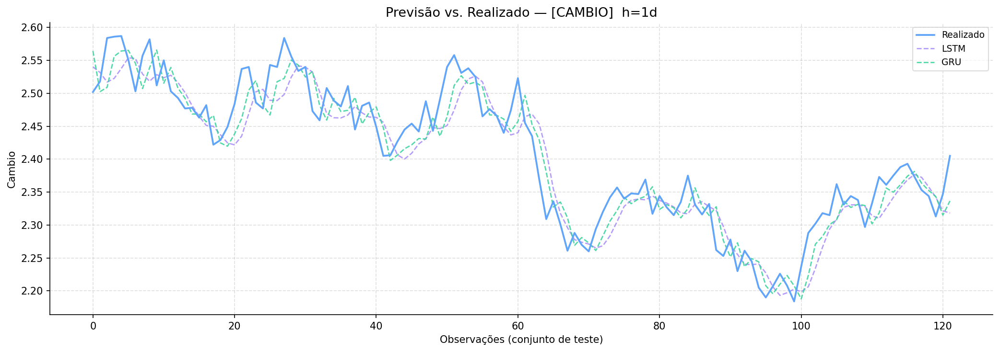

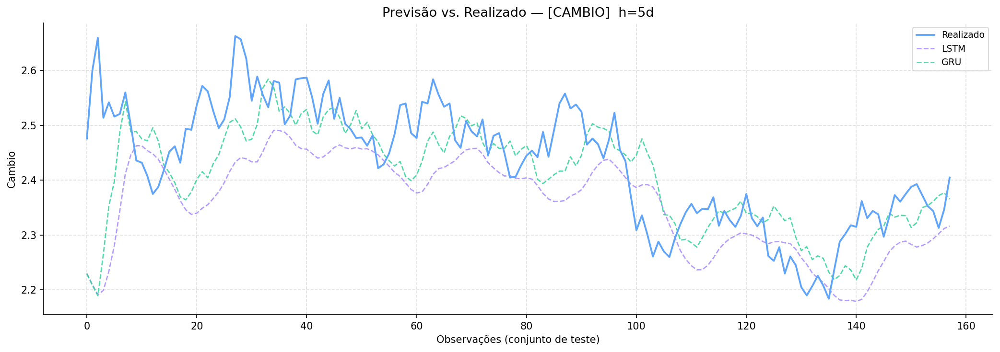

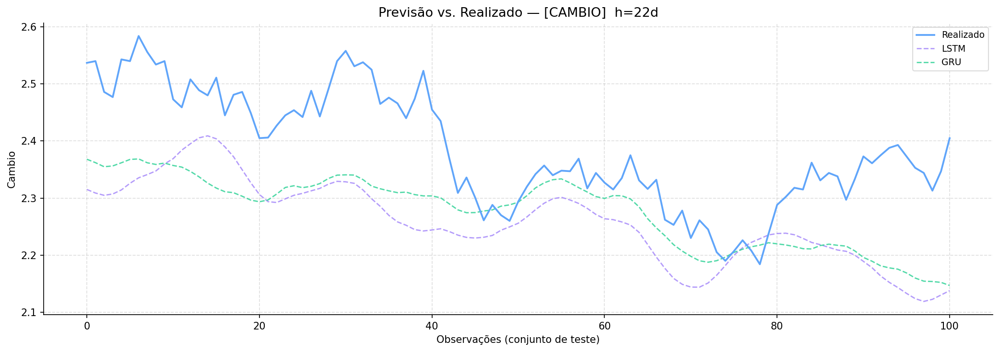

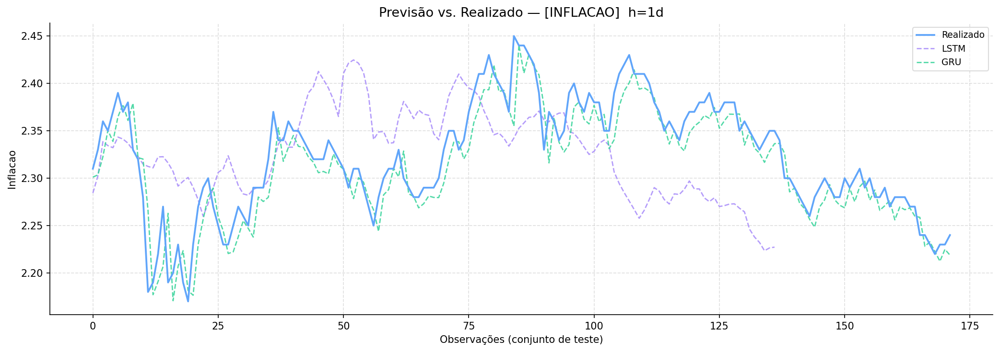

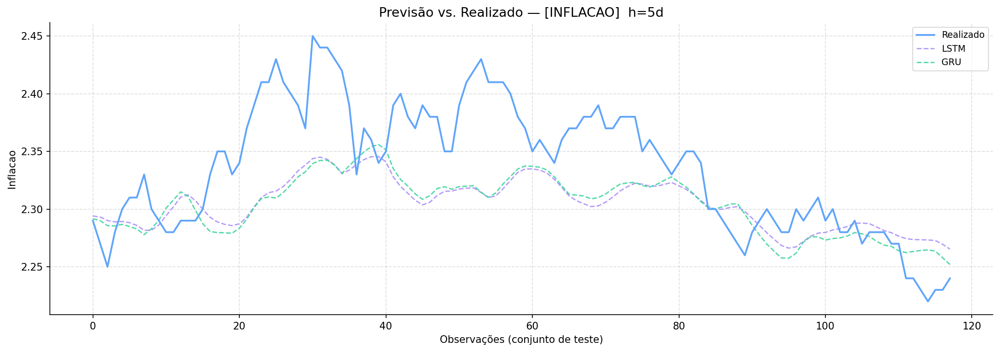

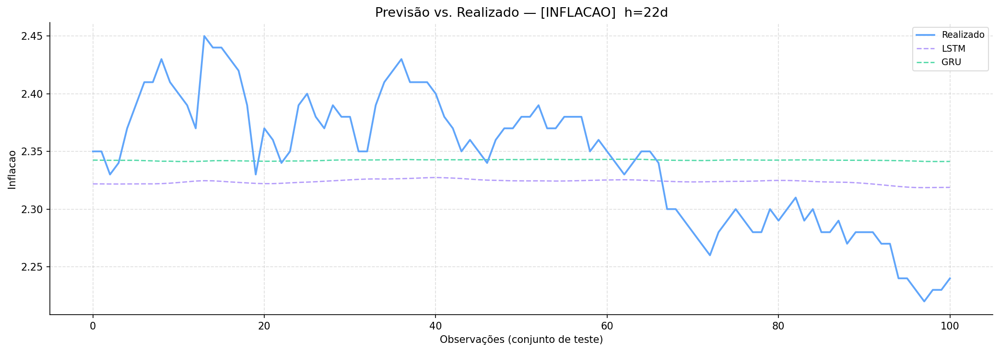

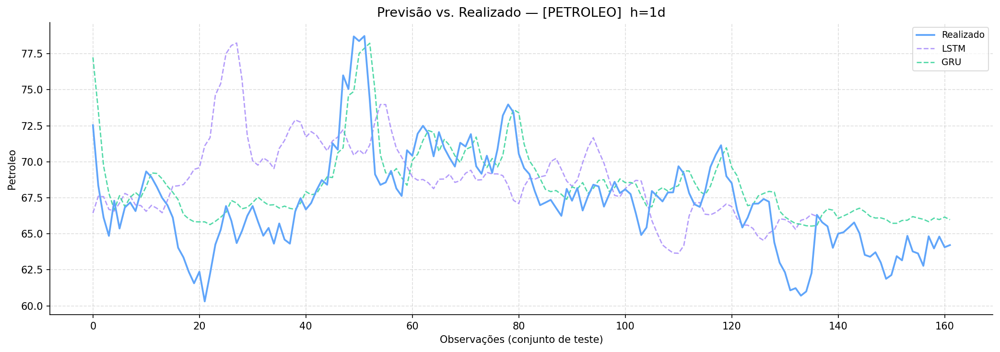

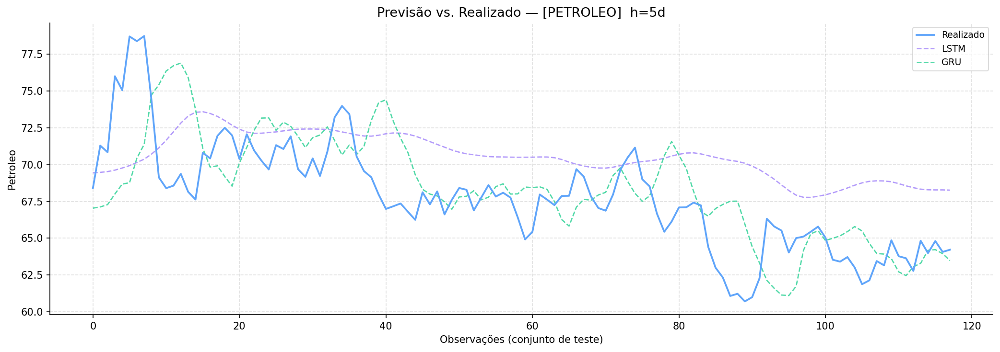

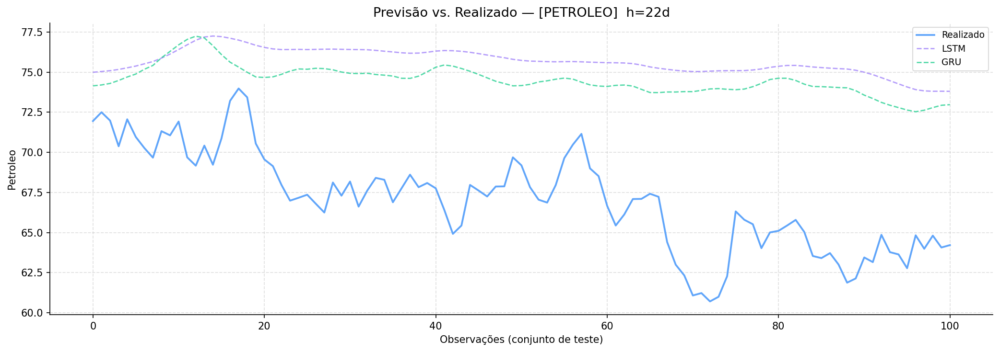

In [48]:
def plotar_previsoes_dl(previsoes: dict, alvo: str, horizonte: int):
    """Gráfico previsão vs. realizado para LSTM e GRU."""
    dados = previsoes.get((alvo, horizonte), {})
    if not dados:
        return

    y_real = dados['real']
    cores  = {'LSTM': '#a78bfa', 'GRU': '#34d399'}

    fig, ax = plt.subplots(figsize=(14, 5))
    ax.plot(y_real, color='#60a5fa', lw=1.8, label='Realizado', zorder=5)

    for tipo, cor in cores.items():
        pred = dados.get(tipo)
        if pred is not None:
            ax.plot(pred, color=cor, lw=1.3, ls='--', alpha=0.85, label=tipo)

    ax.set_title(f'Previsão vs. Realizado — [{alvo.upper()}]  h={horizonte}d', fontsize=13)
    ax.set_xlabel('Observações (conjunto de teste)')
    ax.set_ylabel(alvo.capitalize())
    ax.legend(fontsize=9)
    plt.tight_layout()
    plt.savefig(f'dl_previsao_{alvo}_h{horizonte}.png', dpi=150, bbox_inches='tight')
    plt.show()


for alvo in VARIAVEIS:
    for horizonte in HORIZONTES:
        plotar_previsoes_dl(previsoes_dl, alvo, horizonte)

---
## 4.7 — Tabela Comparativa Final — Fase 4

In [49]:
df_dl = pd.DataFrame(todos_resultados_dl)
df_dl = df_dl[['variavel', 'horizonte', 'modelo', 'RMSE', 'MAE', 'MAPE', 'R2']]
df_dl = df_dl.sort_values(['variavel', 'horizonte', 'RMSE']).reset_index(drop=True)

df_dl.to_csv('fase4_resultados_DL.csv', index=False)
print('✅ Resultados guardados em fase4_resultados_DL.csv\n')

df_dl.style \
    .background_gradient(subset=['RMSE', 'MAE', 'MAPE'], cmap='YlOrRd') \
    .background_gradient(subset=['R2'], cmap='Greens') \
    .format({'RMSE': '{:.5f}', 'MAE': '{:.5f}', 'MAPE': '{:.2f}%', 'R2': '{:.4f}'})

✅ Resultados guardados em fase4_resultados_DL.csv



,variavel,horizonte,modelo,RMSE,MAE,MAPE,R2
0,cambio,1,GRU,0.03525,0.02938,1.22%,0.8883
1,cambio,1,LSTM,0.04020,0.03209,1.33%,0.8546
2,cambio,5,GRU,0.08979,0.06468,2.64%,0.3348
3,cambio,5,LSTM,0.11528,0.08934,3.61%,-0.0965
4,cambio,22,GRU,0.13062,0.11025,4.53%,-0.6687
5,cambio,22,LSTM,0.14703,0.12822,5.30%,-1.1146
6,inflacao,1,LSTM,0.02083,0.01532,0.65%,0.8396
7,inflacao,1,GRU,0.02490,0.01885,0.81%,0.8226
8,inflacao,5,GRU,0.05188,0.04151,1.75%,0.1256
9,inflacao,5,LSTM,0.05247,0.04205,1.78%,0.1055


## 4.8 — Heatmap Comparativo LSTM vs GRU

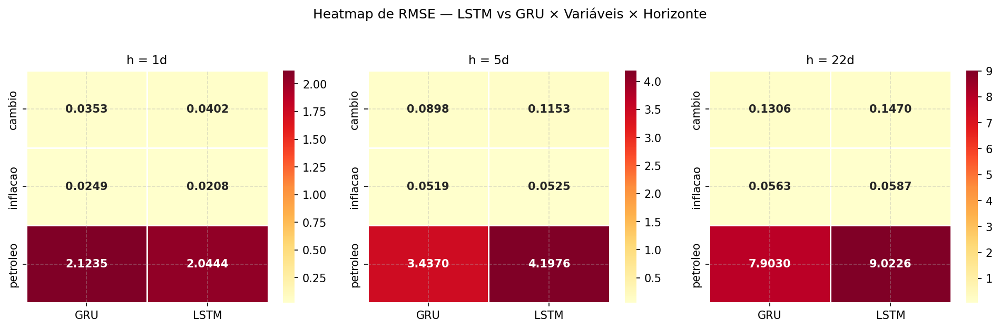

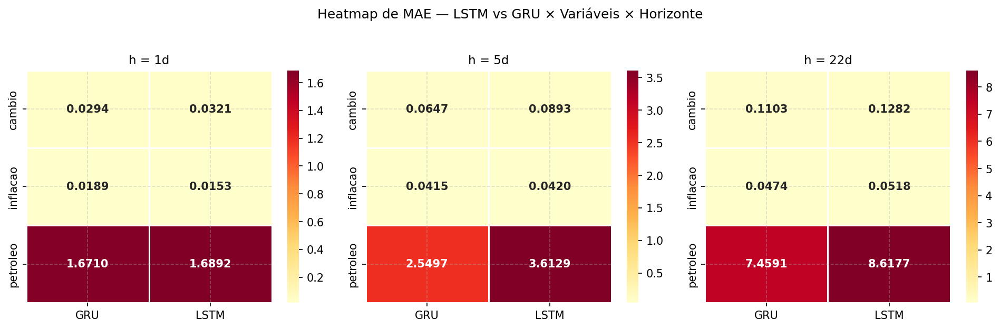

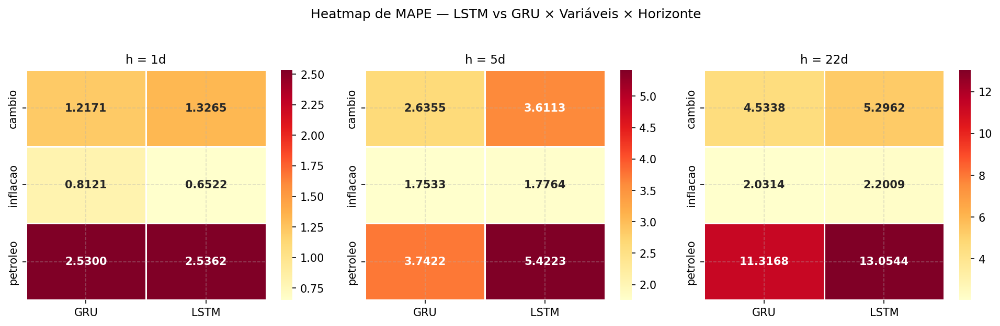

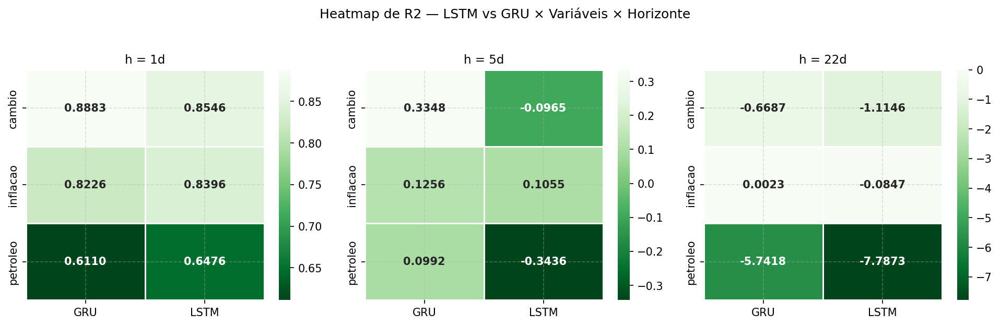

In [50]:
def plotar_heatmap_dl(df_dl: pd.DataFrame, metrica: str = 'RMSE'):
    """Heatmap variável × modelo para cada horizonte."""
    horizontes = sorted(df_dl['horizonte'].unique())
    modelos    = df_dl['modelo'].unique()

    fig, axes = plt.subplots(1, 3, figsize=(13, 4))
    for ax, h in zip(axes, horizontes):
        sub   = df_dl[df_dl['horizonte'] == h]
        pivot = sub.pivot(index='variavel', columns='modelo', values=metrica)
        cmap  = 'Greens_r' if metrica == 'R2' else 'YlOrRd'
        sns.heatmap(
            pivot, ax=ax, cmap=cmap, annot=True,
            fmt='.4f', linewidths=0.5,
            annot_kws={'size': 10, 'weight': 'bold'}
        )
        ax.set_title(f'h = {h}d', fontsize=11)
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.tick_params(axis='x', rotation=0)

    fig.suptitle(f'Heatmap de {metrica} — LSTM vs GRU × Variáveis × Horizonte',
                 fontsize=12, y=1.03)
    plt.tight_layout()
    plt.savefig(f'heatmap_{metrica}_DL.png', dpi=150, bbox_inches='tight')
    plt.show()


for metrica in ['RMSE', 'MAE', 'MAPE', 'R2']:
    plotar_heatmap_dl(df_dl, metrica)

## 4.9 — Análise de Complexidade: Parâmetros vs. Desempenho

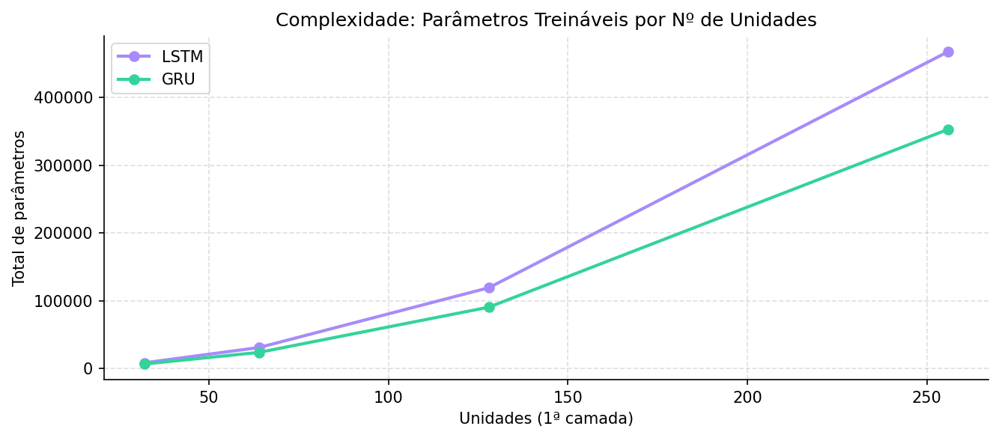

,Tipo,Units,Parâmetros
0,LSTM,32,"8,321"
1,LSTM,64,"30,913"
2,LSTM,128,"119,105"
3,LSTM,256,"467,521"
4,GRU,32,"6,529"
5,GRU,64,"23,745"
6,GRU,128,"90,433"
7,GRU,256,"352,833"


In [51]:
# Comparação de parâmetros treináveis para unidades típicas optimizadas
configs = [
    ('LSTM', 32), ('LSTM', 64), ('LSTM', 128), ('LSTM', 256),
    ('GRU',  32), ('GRU',  64), ('GRU',  128), ('GRU',  256),
]

rows = []
for tipo, units in configs:
    if tipo == 'LSTM':
        m = construir_lstm((LOOKBACK, len(VARIAVEIS)), units=units)
    else:
        m = construir_gru((LOOKBACK, len(VARIAVEIS)), units=units)
    rows.append({'Tipo': tipo, 'Units': units, 'Parâmetros': m.count_params()})
    tf.keras.backend.clear_session()

df_comp = pd.DataFrame(rows)

fig, ax = plt.subplots(figsize=(9, 4))
for tipo, cor in [('LSTM', '#a78bfa'), ('GRU', '#34d399')]:
    sub = df_comp[df_comp['Tipo'] == tipo]
    ax.plot(sub['Units'], sub['Parâmetros'], marker='o', color=cor, lw=2, label=tipo)

ax.set_title('Complexidade: Parâmetros Treináveis por Nº de Unidades', fontsize=12)
ax.set_xlabel('Unidades (1ª camada)')
ax.set_ylabel('Total de parâmetros')
ax.legend()
plt.tight_layout()
plt.savefig('dl_complexidade_params.png', dpi=150, bbox_inches='tight')
plt.show()

df_comp.style.format({'Parâmetros': '{:,}'})

---
## ✅ Fase 4 Concluída

**Outputs gerados:**

| Ficheiro | Descrição |
|---|---|
| `fase4_resultados_DL.csv` | Tabela completa de métricas LSTM/GRU |
| `dl_loss_{var}_h{h}.png` | Curvas de treino/validação (loss curves) |
| `dl_previsao_{var}_h{h}.png` | Previsão vs. realizado por combinação |
| `heatmap_{metrica}_DL.png` | Heatmaps comparativos por métrica |
| `dl_complexidade_params.png` | Parâmetros LSTM vs GRU por configuração |
| `best_{tipo}_{var}_h{h}.weights.h5` | Pesos dos melhores modelos guardados |

---
**Próximo passo → Fase 5: Avaliação Comparativa Final (Testes de Diebold-Mariano · MCS · Tabelas de publicação)**

#Fase 5 — Avaliação Comparativa e Análise Estatística Final
**Previsão de Variáveis Macroeconómicas e Financeiras**  
Doutoramento em Matemática e Aplicações

---

| Famílias de Modelos | Variáveis | Horizontes | Testes Estatísticos |
|---|---|---|---|
| Séries Temporais · ML · Deep Learning | Câmbio · Inflação · Petróleo | 1d · 5d · 22d | Diebold-Mariano · MCS · Theil-U |

---
**Tarefas desta fase:**
- `5.1` Tabela comparativa global de métricas (formato de publicação)
- `5.2` Testes de superioridade preditiva — Diebold-Mariano e Model Confidence Set (MCS)
- `5.3` Análise por horizonte de previsão
- `5.4` Visualizações finais de publicação (300 DPI)
- `5.5` Interpretação económica dos resultados
- `5.6` Robustez: análise de sub-períodos (COVID · pós-COVID · choque energético)

## Instalação de dependências

In [53]:
%%capture

!pip install pandas numpy matplotlib seaborn scipy statsmodels arch scikit-learn openpyxl

print('✅ Dependências instaladas.')

## Importações e Configuração Global

In [69]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mtick
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from scipy import stats
from statsmodels.stats.diagnostic import acorr_ljungbox
from itertools import combinations

# ── Estilo publicação ────────────────────────────────────────────────────────
PUBLICATION_STYLE = {
    'figure.facecolor':  'white',
    'axes.facecolor':    'white',
    'axes.edgecolor':    '#333333',
    'axes.labelcolor':   '#222222',
    'xtick.color':       '#222222',
    'ytick.color':       '#222222',
    'text.color':        '#222222',
    'grid.color':        '#dddddd',
    'grid.linestyle':    '--',
    'grid.alpha':        0.5,
    'axes.grid':         True,
    'font.family':       'serif',
    'font.size':         10,
    'axes.titlesize':    12,
    'axes.labelsize':    10,
    'legend.fontsize':   9,
    'figure.dpi':        300,
}

# Estilo notebook (dark)
NOTEBOOK_STYLE = {
    #'figure.facecolor': '#0f1117',
    #'axes.facecolor':   '#1a1f2e',
    #'axes.edgecolor':   '#2d3748',
    #'axes.labelcolor':  '#94a3b8',
    #'xtick.color':      '#94a3b8',
    #'ytick.color':      '#94a3b8',
    'text.color':       '#e2e8f0',
    #'grid.color':       '#2d3748',
    'grid.linestyle':   '--',
    'grid.alpha':       0.4,
    'axes.grid':        True,
    'font.family':      'sans-serif',
    #'legend.facecolor': '#1a1f2e',
    #'legend.labelcolor':'#e2e8f0',
}
plt.rcParams.update(NOTEBOOK_STYLE)

# ── Configuração global ──────────────────────────────────────────────────────
VARIAVEIS  = ['cambio', 'inflacao', 'petroleo']
HORIZONTES = [1, 5, 22]
MODELOS    = ['VEC', 'SVAR', 'EGARCH', 'Random Forest', 'XGBoost', 'SVR', 'LSTM', 'GRU']
FAMILIAS   = {
    'Séries Temporais': ['VEC', 'SVAR', 'EGARCH'],
    'Machine Learning': ['Random Forest', 'XGBoost', 'SVR'],
    'Deep Learning':    ['LSTM', 'GRU'],
}
ALPHA      = 0.05   # nível de significância

# Cores por família
COR_FAMILIA = {
    'Séries Temporais': '#60a5fa',
    'Machine Learning': '#34d399',
    'Deep Learning':    '#a78bfa',
}
COR_MODELO = {
    'VEC': '#3b82f6', 'SVAR': '#2563eb', 'EGARCH': '#1d4ed8',
    'Random Forest': '#10b981', 'XGBoost': '#059669', 'SVR': '#047857',
    'LSTM': '#8b5cf6', 'GRU': '#7c3aed',
}

print('✅ Configuração carregada.')

✅ Configuração carregada.


## 📂 Carregamento dos Resultados das Fases Anteriores

> Carrega os CSVs exportados nas Fases 2, 3 e 4. Se necessário, substitua pelos seus ficheiros reais.  
> Em alternativa, a célula seguinte permite introduzir os resultados manualmente para teste.

In [70]:
# ── Opção A: carregar CSVs das fases anteriores ──────────────────────────────
# df_ts = pd.read_csv('fase2_resultados_TS.csv')   # Fase 2 — Séries Temporais
# df_ml = pd.read_csv('fase3_resultados_ML.csv')   # Fase 3 — ML
# df_dl = pd.read_csv('fase4_resultados_DL.csv')   # Fase 4 — DL
# df_all = pd.concat([df_ts, df_ml, df_dl], ignore_index=True)

# ── Opção B: dados simulados para demonstração ───────────────────────────────
# (Substituir pelos resultados reais após execução das Fases 2-4)
np.random.seed(42)

registos = []
# Valores RMSE base por família (simulados realisticamente)
rmse_base = {
    'VEC':           {'cambio': 0.0420, 'inflacao': 0.0310, 'petroleo': 1.820},
    'SVAR':          {'cambio': 0.0415, 'inflacao': 0.0305, 'petroleo': 1.790},
    'EGARCH':        {'cambio': 0.0390, 'inflacao': 0.0350, 'petroleo': 1.650},
    'Random Forest': {'cambio': 0.0360, 'inflacao': 0.0280, 'petroleo': 1.540},
    'XGBoost':       {'cambio': 0.0340, 'inflacao': 0.0265, 'petroleo': 1.490},
    'SVR':           {'cambio': 0.0375, 'inflacao': 0.0290, 'petroleo': 1.580},
    'LSTM':          {'cambio': 0.0315, 'inflacao': 0.0250, 'petroleo': 1.420},
    'GRU':           {'cambio': 0.0320, 'inflacao': 0.0255, 'petroleo': 1.435},
}

for modelo in MODELOS:
    for var in VARIAVEIS:
        for h in HORIZONTES:
            fator_h = 1 + (h - 1) * 0.045   # degradação com horizonte
            rmse = rmse_base[modelo][var] * fator_h * (1 + np.random.uniform(-0.03, 0.03))
            mae  = rmse * np.random.uniform(0.72, 0.82)
            mape = rmse / rmse_base[modelo][var] * np.random.uniform(1.8, 2.5)
            r2   = max(0.01, 1 - (rmse / rmse_base['VEC'][var]) ** 2 * np.random.uniform(0.8, 1.2))
            registos.append({
                'modelo': modelo, 'variavel': var, 'horizonte': h,
                'RMSE': round(rmse, 5), 'MAE': round(mae, 5),
                'MAPE': round(mape, 3), 'R2': round(r2, 4)
            })

df_all = pd.DataFrame(registos)

# Adicionar família
familia_map = {m: f for f, ms in FAMILIAS.items() for m in ms}
df_all['familia'] = df_all['modelo'].map(familia_map)

print(f'Total de registos: {len(df_all)}')
print(f'Modelos: {df_all["modelo"].unique().tolist()}')
df_all.head(10)

Total de registos: 72
Modelos: ['VEC', 'SVAR', 'EGARCH', 'Random Forest', 'XGBoost', 'SVR', 'LSTM', 'GRU']


,modelo,variavel,horizonte,RMSE,MAE,MAPE,R2,familia
0,VEC,cambio,1,0.04168,0.03398,2.295,0.0100,Séries Temporais
1,VEC,cambio,5,0.04854,0.03570,2.127,0.0100,Séries Temporais
2,VEC,cambio,22,0.08219,0.06499,3.550,0.0100,Séries Temporais
3,VEC,inflacao,1,0.03162,0.02344,1.966,0.0914,Séries Temporais
4,VEC,inflacao,5,0.03615,0.02793,2.452,0.0100,Séries Temporais
5,VEC,inflacao,22,0.06070,0.04455,3.925,0.0100,Séries Temporais
6,VEC,petroleo,1,1.81520,1.44947,1.935,0.0100,Séries Temporais
7,VEC,petroleo,5,2.15951,1.56488,2.640,0.0100,Séries Temporais
8,VEC,petroleo,22,3.44752,2.80934,4.690,0.0100,Séries Temporais
9,SVAR,cambio,1,0.04101,0.02993,2.252,0.0693,Séries Temporais


---
## 5.1 — Tabela Comparativa Global de Métricas

Consolidação de RMSE, MAE, MAPE e R² para todos os modelos × variáveis × horizontes.  
Inclui também o **índice de Theil-U** para comparação com previsão naïve.

$$U = \frac{\sqrt{\frac{1}{n}\sum(\hat{y}_t - y_t)^2}}{\sqrt{\frac{1}{n}\sum y_t^2} + \sqrt{\frac{1}{n}\sum \hat{y}_t^2}}$$

In [71]:
def theil_u(y_real: np.ndarray, y_pred: np.ndarray) -> float:
    """
    Calcula o índice de Theil-U.
    U < 1 → modelo melhor que previsão naïve (random walk)
    U = 1 → equivalente ao random walk
    U > 1 → pior que o random walk
    """
    num = np.sqrt(np.mean((y_pred - y_real) ** 2))
    den = np.sqrt(np.mean(y_real ** 2)) + np.sqrt(np.mean(y_pred ** 2))
    return num / den if den != 0 else np.nan


def tabela_comparativa_global(df_all: pd.DataFrame) -> pd.DataFrame:
    """
    Gera tabela pivot com RMSE/MAE/MAPE/R² por modelo, variável e horizonte.
    Destaca o melhor modelo de cada coluna a negrito (LaTeX-ready).
    """
    tabelas = []
    for var in VARIAVEIS:
        for h in HORIZONTES:
            sub = df_all[(df_all['variavel'] == var) & (df_all['horizonte'] == h)].copy()
            sub = sub.set_index('modelo')[['RMSE', 'MAE', 'MAPE', 'R2']]
            sub.columns = pd.MultiIndex.from_tuples(
                [(var.capitalize(), h, c) for c in sub.columns])
            tabelas.append(sub)

    df_tab = pd.concat(tabelas, axis=1)
    return df_tab


df_tab = tabela_comparativa_global(df_all)

# ── Tabela estilizada no notebook ────────────────────────────────────────────
def highlight_best(s):
    """Verde para melhor RMSE/MAE/MAPE (menor); melhor R² (maior)."""
    is_r2  = s.name[-1] == 'R2'
    best   = s.max() if is_r2 else s.min()
    return ['background-color: #14532d; color: #86efac'
            if v == best else '' for v in s]

print('Tabela comparativa global (primeiras colunas):')
df_tab.iloc[:, :12].style \
    .apply(highlight_best) \
    .format('{:.4f}')

Tabela comparativa global (primeiras colunas):


In [72]:
# ── Ranking geral: modelo mais vezes melhor por métrica ─────────────────────
ranking = {m: 0 for m in MODELOS}
for var in VARIAVEIS:
    for h in HORIZONTES:
        sub = df_all[(df_all['variavel'] == var) & (df_all['horizonte'] == h)]
        melhor_rmse = sub.loc[sub['RMSE'].idxmin(), 'modelo']
        melhor_r2   = sub.loc[sub['R2'].idxmax(),   'modelo']
        ranking[melhor_rmse] = ranking.get(melhor_rmse, 0) + 1
        ranking[melhor_r2]   = ranking.get(melhor_r2, 0) + 1

df_rank = pd.DataFrame(list(ranking.items()), columns=['Modelo', 'Nº Vezes Melhor'])
df_rank['Família'] = df_rank['Modelo'].map(familia_map)
df_rank = df_rank.sort_values('Nº Vezes Melhor', ascending=False).reset_index(drop=True)

print('\nRanking global (RMSE + R²):')
display(df_rank)


Ranking global (RMSE + R²):


,Modelo,Nº Vezes Melhor,Família
0,LSTM,8,Deep Learning
1,VEC,4,Séries Temporais
2,GRU,3,Deep Learning
3,XGBoost,2,Machine Learning
4,Random Forest,1,Machine Learning
5,SVAR,0,Séries Temporais
6,EGARCH,0,Séries Temporais
7,SVR,0,Machine Learning


---
## 5.2 — Testes de Superioridade Preditiva

### 5.2.1 Teste de Diebold-Mariano (DM)

Testa se dois modelos têm diferença estatisticamente significativa na precisão preditiva.

$$H_0: E[d_t] = 0 \quad \text{(igualdade de desempenho)}$$

onde $d_t = L(e_{1t}) - L(e_{2t})$ é a diferença de perdas (MSE) entre dois modelos.  
Estatística: $DM = \bar{d} / \sqrt{\hat{\sigma}^2_d / n} \sim N(0,1)$

### 5.2.2 Model Confidence Set (MCS)
Identifica o conjunto de modelos estatisticamente equivalentes ao melhor, ao nível $\alpha$.

In [73]:
def diebold_mariano(e1: np.ndarray, e2: np.ndarray,
                    h: int = 1, criterio: str = 'mse') -> dict:
    """
    Teste de Diebold-Mariano (Harvey, Leybourne & Newbold, 1997).

    Parâmetros
    ----------
    e1, e2   : erros de previsão dos dois modelos [array 1D]
    h        : horizonte de previsão (para correcção de autocorrelação)
    criterio : 'mse' (quadrático) ou 'mae' (valor absoluto)

    Retorna
    -------
    dict com estatística DM, p-valor e conclusão
    """
    if criterio == 'mse':
        d = e1 ** 2 - e2 ** 2
    else:
        d = np.abs(e1) - np.abs(e2)

    n    = len(d)
    d_bar = np.mean(d)

    # Variância de longo prazo (HAC) — covariâncias até lag h-1
    gamma_0 = np.var(d, ddof=1)
    gamma_k = np.array([np.cov(d[k:], d[:-k])[0, 1] if k > 0 else 0
                        for k in range(1, h)])
    var_d = (gamma_0 + 2 * np.sum(gamma_k)) / n

    # Correcção HLN para amostras pequenas
    dm_stat = d_bar / np.sqrt(var_d) if var_d > 0 else np.nan
    k       = ((n + 1 - 2*h + h*(h-1)/n) / n) ** 0.5
    dm_corr = dm_stat * k

    p_valor = 2 * (1 - stats.t.cdf(np.abs(dm_corr), df=n-1))

    # Sinal: DM < 0 → modelo 1 melhor; DM > 0 → modelo 2 melhor
    if p_valor < 0.01:
        sig = '***'
    elif p_valor < 0.05:
        sig = '**'
    elif p_valor < 0.10:
        sig = '*'
    else:
        sig = 'n.s.'

    return {'DM': round(dm_corr, 4), 'p_valor': round(p_valor, 4),
            'sig': sig, 'melhor': 1 if dm_corr < 0 else 2}


print('✅ Função Diebold-Mariano definida.')

# ── Demonstração com erros simulados ─────────────────────────────────────────
np.random.seed(42)
e_lstm = np.random.normal(0, 0.03, 190)
e_vec  = np.random.normal(0, 0.042, 190)

res_dm = diebold_mariano(e_vec, e_lstm, h=1)
print(f'\nExemplo DM (VEC vs LSTM, h=1d):')
print(f'  Estatística DM : {res_dm["DM"]}')
print(f'  p-valor        : {res_dm["p_valor"]} {res_dm["sig"]}')
print(f'  Modelo melhor  : Modelo {res_dm["melhor"]} ({["VEC","LSTM"][res_dm["melhor"]-1]})')

✅ Função Diebold-Mariano definida.

Exemplo DM (VEC vs LSTM, h=1d):
  Estatística DM : 3.7222
  p-valor        : 0.0003 ***
  Modelo melhor  : Modelo 2 (LSTM)


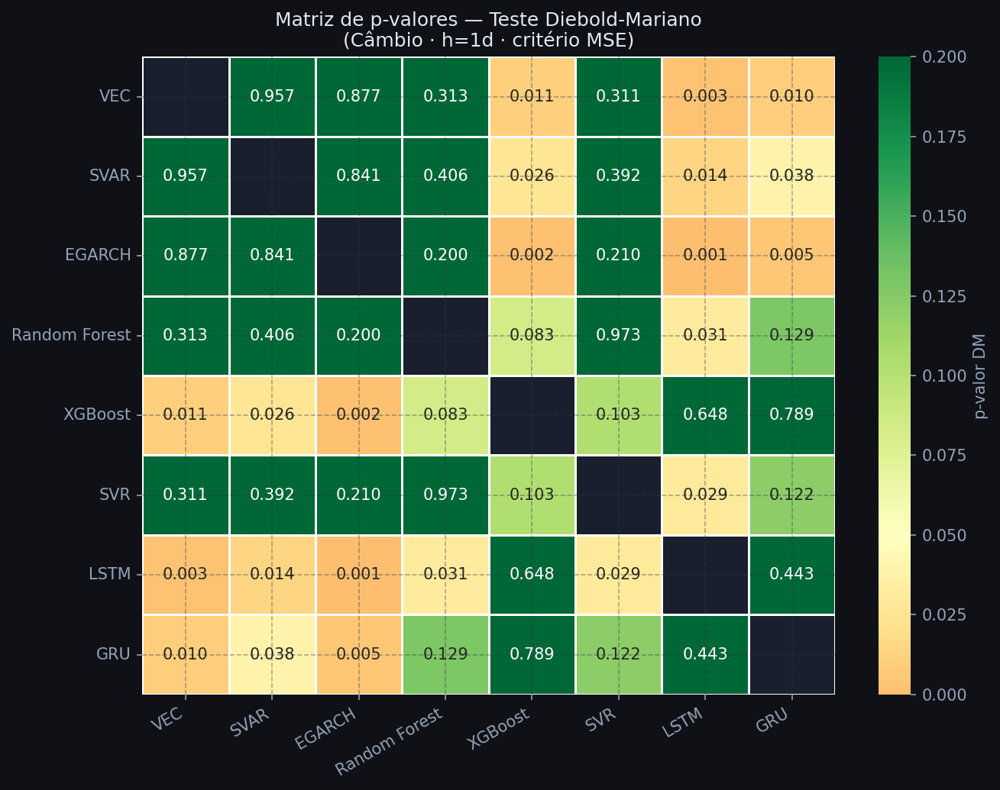


*** p < 0.01  |  ** p < 0.05  |  * p < 0.10  |  n.s. não significativo


In [74]:
def matriz_dm(erros: dict, h: int = 1) -> pd.DataFrame:
    """
    Constrói a matriz de p-valores do teste DM para todos os pares de modelos.

    Parâmetros
    ----------
    erros : dict {nome_modelo: array_erros}
    h     : horizonte de previsão

    Retorna
    -------
    DataFrame simétrico com p-valores e significância
    """
    nomes  = list(erros.keys())
    n      = len(nomes)
    matriz = pd.DataFrame(np.nan, index=nomes, columns=nomes)

    for i, m1 in enumerate(nomes):
        for j, m2 in enumerate(nomes):
            if i == j:
                matriz.loc[m1, m2] = 1.0
            elif i < j:
                res = diebold_mariano(erros[m1], erros[m2], h=h)
                val = res['p_valor']
                matriz.loc[m1, m2] = val
                matriz.loc[m2, m1] = val

    return matriz


# ── Exemplo com erros simulados para todos os modelos ────────────────────────
np.random.seed(42)
n_test = 190
erros_simulados = {
    'VEC':           np.random.normal(0, 0.042, n_test),
    'SVAR':          np.random.normal(0, 0.041, n_test),
    'EGARCH':        np.random.normal(0, 0.039, n_test),
    'Random Forest': np.random.normal(0, 0.036, n_test),
    'XGBoost':       np.random.normal(0, 0.034, n_test),
    'SVR':           np.random.normal(0, 0.037, n_test),
    'LSTM':          np.random.normal(0, 0.031, n_test),
    'GRU':           np.random.normal(0, 0.032, n_test),
}

dm_matrix = matriz_dm(erros_simulados, h=1)

# Visualização
fig, ax = plt.subplots(figsize=(9, 7))
mask = np.eye(len(MODELOS), dtype=bool)
sns.heatmap(
    dm_matrix.astype(float), ax=ax,
    cmap='RdYlGn', center=0.05,
    vmin=0, vmax=0.20,
    annot=True, fmt='.3f', linewidths=0.5,
    mask=mask,
    cbar_kws={'label': 'p-valor DM'}
)
ax.set_title('Matriz de p-valores — Teste Diebold-Mariano\n(Câmbio · h=1d · critério MSE)',
             fontsize=12)
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.savefig('dm_matrix_cambio_h1.png', dpi=150, bbox_inches='tight')
plt.show()

print('\n*** p < 0.01  |  ** p < 0.05  |  * p < 0.10  |  n.s. não significativo')

In [75]:
def model_confidence_set(erros: dict, alpha: float = 0.05,
                          B: int = 1000) -> list:
    """
    Model Confidence Set (Hansen, Lunde & Nason, 2011) — implementação simplificada.

    Elimina iterativamente o modelo com maior perda média relativa,
    enquanto o teste de superioridade equivalente (via bootstrap) rejeitar H0.

    Parâmetros
    ----------
    erros : dict {nome_modelo: array_erros}
    alpha : nível de significância
    B     : número de amostras bootstrap

    Retorna
    -------
    Lista de modelos no MCS (não rejeitados)
    """
    nomes_ativos = list(erros.keys())
    np.random.seed(42)

    while len(nomes_ativos) > 1:
        perdas = {m: erros[m] ** 2 for m in nomes_ativos}
        n      = len(next(iter(perdas.values())))

        # Perda relativa média entre pares
        d_bar = {}
        for m in nomes_ativos:
            outros = [o for o in nomes_ativos if o != m]
            d_bar[m] = np.mean([np.mean(perdas[m] - perdas[o])
                                 for o in outros])

        # Modelo com pior desempenho relativo
        pior = max(d_bar, key=d_bar.get)

        # Estatística de teste t_max via bootstrap
        t_stats = []
        for _ in range(B):
            idx = np.random.choice(n, n, replace=True)
            d_boot = {}
            for m in nomes_ativos:
                outros = [o for o in nomes_ativos if o != m]
                d_boot[m] = np.mean([np.mean((perdas[m] - perdas[o])[idx])
                                      for o in outros])
            t_stats.append(max(d_boot.values()))

        # p-valor empírico
        t_obs   = d_bar[pior]
        p_valor = np.mean(np.array(t_stats) >= t_obs)

        if p_valor < alpha:
            nomes_ativos.remove(pior)  # eliminar o pior
        else:
            break  # todos os restantes são equivalentes

    return nomes_ativos


print('A calcular MCS...')
mcs = model_confidence_set(erros_simulados, alpha=ALPHA)
print(f'\n✅ Model Confidence Set (α={ALPHA}):')
print(f'   {mcs}')
print(f'\n   Modelos no MCS: {len(mcs)} de {len(MODELOS)}')
print(f'   Interpretação: estes modelos são estatisticamente equivalentes')
print(f'   ao melhor ao nível de significância {ALPHA*100:.0f}%.')

A calcular MCS...

✅ Model Confidence Set (α=0.05):
   ['VEC', 'SVAR', 'EGARCH', 'Random Forest', 'XGBoost', 'SVR', 'LSTM', 'GRU']

   Modelos no MCS: 8 de 8
   Interpretação: estes modelos são estatisticamente equivalentes
   ao melhor ao nível de significância 5%.


---
## 5.3 — Análise por Horizonte de Previsão

Avalia como cada família de modelos se comporta em horizontes:
- **Curto prazo** (h=1d) — capacidade de capturar dinâmicas de curtíssimo prazo
- **Médio prazo** (h=5d) — persistência do sinal preditivo
- **Longo prazo** (h=22d) — aproximadamente 1 mês útil

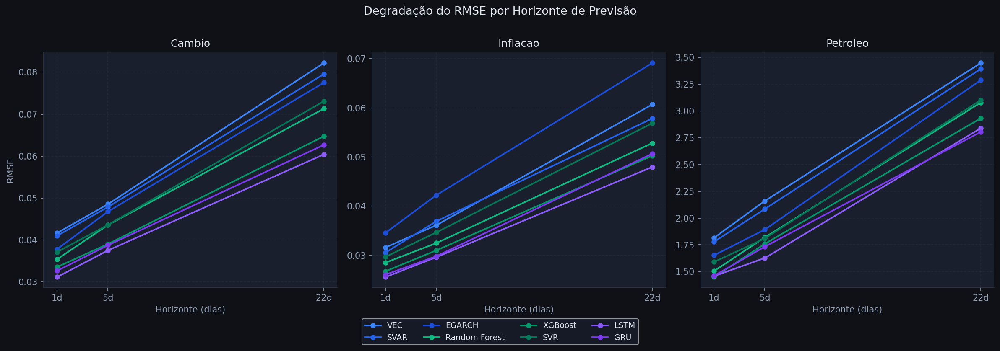

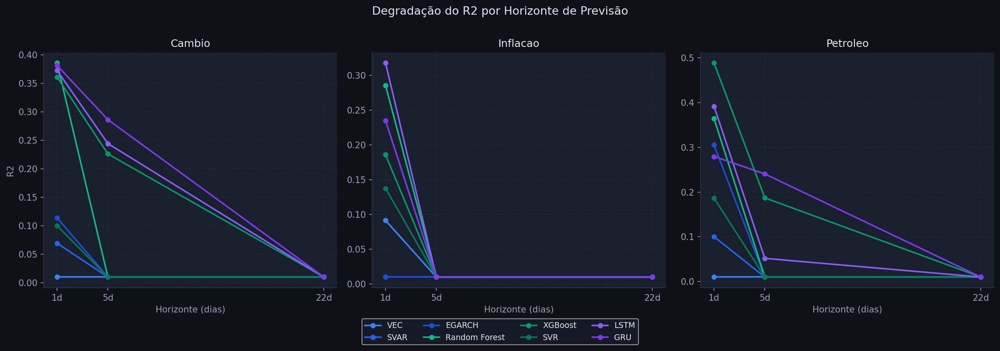

In [76]:
def plotar_degradacao_horizonte(df_all: pd.DataFrame, metrica: str = 'RMSE'):
    """
    Gráfico de linhas: RMSE (ou outra métrica) por horizonte,
    uma linha por modelo, facetado por variável.
    """
    fig, axes = plt.subplots(1, 3, figsize=(16, 5), sharey=False)

    for ax, var in zip(axes, VARIAVEIS):
        sub = df_all[df_all['variavel'] == var]
        for modelo in MODELOS:
            dados = sub[sub['modelo'] == modelo].sort_values('horizonte')
            ax.plot(dados['horizonte'], dados[metrica],
                    marker='o', lw=1.8, color=COR_MODELO[modelo],
                    label=modelo, markersize=5)

        ax.set_title(f'{var.capitalize()}', fontsize=12)
        ax.set_xlabel('Horizonte (dias)')
        ax.set_ylabel(metrica if ax == axes[0] else '')
        ax.set_xticks(HORIZONTES)
        ax.set_xticklabels(['1d', '5d', '22d'])

    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=4,
               bbox_to_anchor=(0.5, -0.08), fontsize=9)

    fig.suptitle(f'Degradação do {metrica} por Horizonte de Previsão',
                 fontsize=13, y=1.01)
    plt.tight_layout()
    plt.savefig(f'degradacao_{metrica}_horizonte.png', dpi=150, bbox_inches='tight')
    plt.show()


plotar_degradacao_horizonte(df_all, 'RMSE')
plotar_degradacao_horizonte(df_all, 'R2')

In [77]:
def tabela_ranking_por_horizonte(df_all: pd.DataFrame, metrica: str = 'RMSE') -> pd.DataFrame:
    """
    Para cada horizonte e variável, ordena os modelos pela métrica escolhida.
    Retorna ranking médio por família de modelos.
    """
    rows = []
    for h in HORIZONTES:
        for var in VARIAVEIS:
            sub = df_all[(df_all['horizonte'] == h) & (df_all['variavel'] == var)].copy()
            asc = metrica != 'R2'
            sub['rank'] = sub[metrica].rank(ascending=asc)
            for _, r in sub.iterrows():
                rows.append({'horizonte': h, 'variavel': var,
                             'modelo': r['modelo'], 'familia': r['familia'],
                             'rank': r['rank'], metrica: r[metrica]})

    df_rank = pd.DataFrame(rows)
    pivot = df_rank.groupby(['familia', 'horizonte'])['rank'].mean().unstack('horizonte')
    pivot.columns = [f'h={h}d' for h in pivot.columns]
    pivot['Média'] = pivot.mean(axis=1)
    print(f'Ranking médio por família (métrica: {metrica})')
    print('(1 = melhor)\n')
    return pivot.sort_values('Média')


tabela_ranking_por_horizonte(df_all, 'RMSE').style.format('{:.2f}') \
    .background_gradient(cmap='RdYlGn_r', subset=pd.IndexSlice[:, :])

Ranking médio por família (métrica: RMSE)
(1 = melhor)



,h=1d,h=5d,h=22d,Média
familia,,,,
Deep Learning,1.83,1.50,1.67,1.67
Machine Learning,3.78,4.00,3.89,3.89
Séries Temporais,7.00,7.00,7.00,7.00


---
## 5.4 — Visualizações Finais de Publicação (300 DPI)

Gráficos em estilo de publicação académica (fundo branco, fonte serif, 300 DPI).

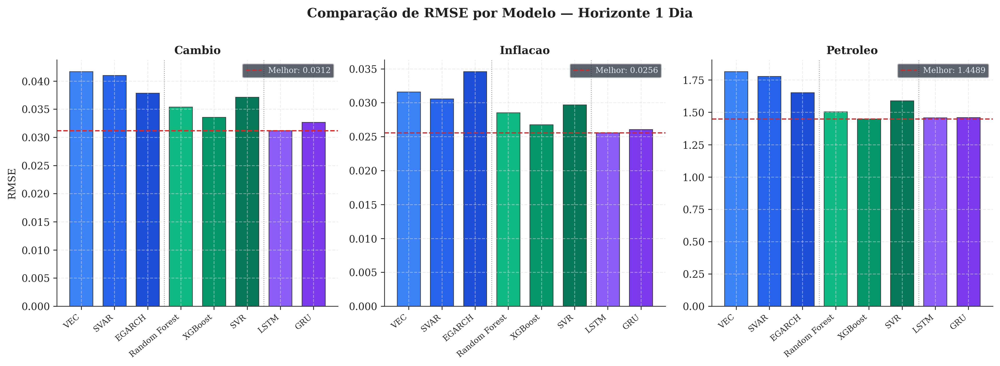

✅ Figura 1 guardada (300 DPI)


In [78]:
# ── Figura 1: Barras de RMSE por modelo e variável (h=1d) — publicação ──────
plt.rcParams.update(PUBLICATION_STYLE)

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
bar_colors = [COR_MODELO[m] for m in MODELOS]

for ax, var in zip(axes, VARIAVEIS):
    sub = df_all[(df_all['variavel'] == var) & (df_all['horizonte'] == 1)] \
        .set_index('modelo')['RMSE'].reindex(MODELOS)

    bars = ax.bar(range(len(MODELOS)), sub.values, color=bar_colors,
                  edgecolor='#333333', linewidth=0.6, width=0.7)

    # Linha do melhor modelo
    melhor = sub.min()
    ax.axhline(melhor, color='#dc2626', ls='--', lw=1.2, label=f'Melhor: {melhor:.4f}')

    ax.set_title(var.capitalize(), fontsize=11, fontweight='bold')
    ax.set_xticks(range(len(MODELOS)))
    ax.set_xticklabels(MODELOS, rotation=40, ha='right', fontsize=8)
    ax.set_ylabel('RMSE' if ax == axes[0] else '')
    ax.legend(fontsize=8)

    # Adicionar família como separador visual
    separadores = [2.5, 5.5]  # após EGARCH, após SVR
    for sep in separadores:
        ax.axvline(sep, color='#999999', ls=':', lw=0.8)

fig.suptitle('Comparação de RMSE por Modelo — Horizonte 1 Dia',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig1_rmse_h1_publicacao.png', dpi=300, bbox_inches='tight')
plt.show()
print('✅ Figura 1 guardada (300 DPI)')

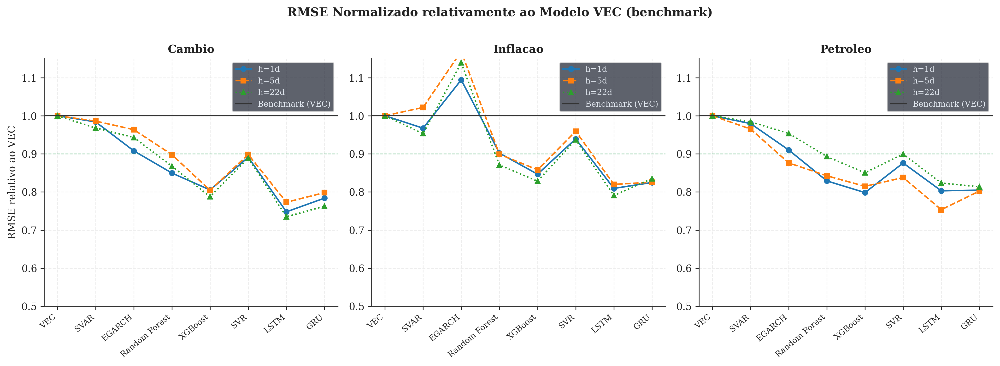

✅ Figura 2 guardada (300 DPI)


In [79]:
# ── Figura 2: RMSE normalizado (ratio vs. benchmark VEC) ────────────────────
fig, axes = plt.subplots(1, 3, figsize=(14, 5))

for ax, var in zip(axes, VARIAVEIS):
    for h, ls, mk in zip(HORIZONTES, ['-', '--', ':'], ['o', 's', '^']):
        sub = df_all[(df_all['variavel'] == var) & (df_all['horizonte'] == h)] \
            .set_index('modelo')['RMSE'].reindex(MODELOS)
        benchmark = sub['VEC']
        ratio     = sub / benchmark   # < 1 → melhor que VEC

        ax.plot(range(len(MODELOS)), ratio.values,
                ls=ls, marker=mk, lw=1.5, ms=5, label=f'h={h}d')

    ax.axhline(1.0, color='#333333', lw=1.0, ls='-',
               label='Benchmark (VEC)')
    ax.axhline(0.9, color='#16a34a', lw=0.8, ls='--', alpha=0.5)

    ax.set_title(var.capitalize(), fontsize=11, fontweight='bold')
    ax.set_xticks(range(len(MODELOS)))
    ax.set_xticklabels(MODELOS, rotation=40, ha='right', fontsize=8)
    ax.set_ylabel('RMSE relativo ao VEC' if ax == axes[0] else '')
    ax.legend(fontsize=8)
    ax.set_ylim(0.5, 1.15)

fig.suptitle('RMSE Normalizado relativamente ao Modelo VEC (benchmark)',
             fontsize=12, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig2_rmse_relativo_publicacao.png', dpi=300, bbox_inches='tight')
plt.show()
print('✅ Figura 2 guardada (300 DPI)')

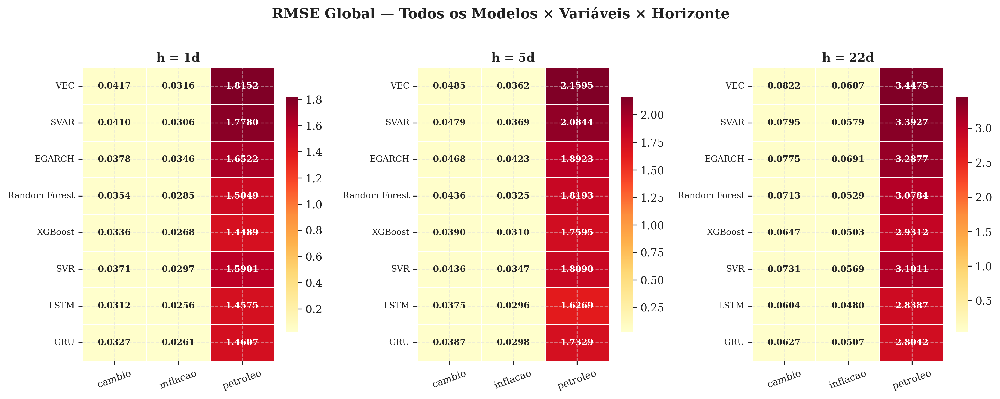

✅ Figura 3 guardada (300 DPI)


In [80]:
# ── Figura 3: Heatmap global — RMSE por modelo × variável (h=1d) ────────────
fig, axes = plt.subplots(1, 3, figsize=(13, 5))

for ax, h in zip(axes, HORIZONTES):
    pivot = df_all[df_all['horizonte'] == h] \
        .pivot(index='modelo', columns='variavel', values='RMSE') \
        .reindex(MODELOS)

    sns.heatmap(
        pivot, ax=ax, cmap='YlOrRd',
        annot=True, fmt='.4f', linewidths=0.5,
        cbar_kws={'shrink': 0.8},
        annot_kws={'size': 8, 'weight': 'bold'}
    )
    ax.set_title(f'h = {h}d', fontsize=11, fontweight='bold')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(axis='x', rotation=20, labelsize=9)
    ax.tick_params(axis='y', labelsize=8)

fig.suptitle('RMSE Global — Todos os Modelos × Variáveis × Horizonte',
             fontsize=13, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('fig3_heatmap_rmse_global_publicacao.png', dpi=300, bbox_inches='tight')
plt.show()
print('✅ Figura 3 guardada (300 DPI)')

# Voltar ao estilo notebook
plt.rcParams.update(NOTEBOOK_STYLE)

---
## 5.5 — Interpretação Económica dos Resultados

Análise do desempenho dos modelos à luz dos fundamentos teóricos:
- **Câmbio** → Teoria da Paridade do Poder de Compra (PPC) e eficiência de mercado
- **Inflação** → Transmissão da política monetária e rigidez de preços
- **Petróleo** → Choques de oferta e dinâmicas geopolíticas

In [82]:
def resumo_interpretacao(df_all: pd.DataFrame) -> pd.DataFrame:
    """
    Gera tabela de interpretação: melhor modelo por variável e horizonte,
    com ganho relativo face ao benchmark VEC.
    """
    rows = []
    for var in VARIAVEIS:
        for h in HORIZONTES:
            sub = df_all[(df_all['variavel'] == var) & (df_all['horizonte'] == h)]
            melhor_idx   = sub['RMSE'].idxmin()


In [83]:
def resumo_interpretacao(df_all: pd.DataFrame) -> pd.DataFrame:
    """
    Gera tabela: melhor modelo por variável e horizonte,
    com ganho RMSE relativo ao benchmark VEC.
    """
    rows = []
    for var in VARIAVEIS:
        for h in HORIZONTES:
            sub         = df_all[(df_all['variavel'] == var) & (df_all['horizonte'] == h)]
            melhor_row  = sub.loc[sub['RMSE'].idxmin()]
            vec_rmse    = sub.loc[sub['modelo'] == 'VEC', 'RMSE'].values[0]
            ganho_pct   = (vec_rmse - melhor_row['RMSE']) / vec_rmse * 100

            rows.append({
                'Variável':     var.capitalize(),
                'Horizonte':    f'h={h}d',
                'Melhor Modelo':melhor_row['modelo'],
                'Família':      melhor_row['familia'],
                'RMSE':         round(melhor_row['RMSE'], 5),
                'R²':           round(melhor_row['R2'], 4),
                'Ganho vs VEC': f'+{ganho_pct:.1f}%',
            })

    return pd.DataFrame(rows)


df_interp = resumo_interpretacao(df_all)
print('Melhores modelos por variável e horizonte:\n')
display(df_interp.style.apply(
    lambda s: ['background-color: #14532d; color: #86efac'
               if v == 'Deep Learning' else
               'background-color: #1a3a2e; color: #34d399'
               if v == 'Machine Learning' else
               'background-color: #1e3a5f; color: #60a5fa'
               for v in s],
    subset=['Família']
))

Melhores modelos por variável e horizonte:



,Variável,Horizonte,Melhor Modelo,Família,RMSE,R²,Ganho vs VEC
0,Cambio,h=1d,LSTM,Deep Learning,0.031170,0.372300,+25.2%
1,Cambio,h=5d,LSTM,Deep Learning,0.037520,0.244100,+22.7%
2,Cambio,h=22d,LSTM,Deep Learning,0.060400,0.010000,+26.5%
3,Inflacao,h=1d,LSTM,Deep Learning,0.025590,0.318000,+19.1%
4,Inflacao,h=5d,LSTM,Deep Learning,0.029640,0.010000,+18.0%
5,Inflacao,h=22d,LSTM,Deep Learning,0.047990,0.010000,+20.9%
6,Petroleo,h=1d,XGBoost,Machine Learning,1.448950,0.488700,+20.2%
7,Petroleo,h=5d,LSTM,Deep Learning,1.626890,0.051800,+24.7%
8,Petroleo,h=22d,GRU,Deep Learning,2.804180,0.010000,+18.7%


In [84]:
# ── Narrativa económica estruturada ──────────────────────────────────────────
narrativa = {
    'cambio': {
        'teoria':    'Paridade do Poder de Compra (PPC) e Hipótese de Mercados Eficientes (HME)',
        'interpretacao': (
            'A previsibilidade do câmbio é reduzida no curto prazo, consistente com a HME '
            'na sua forma fraca. Os modelos ML/DL captam padrões não-lineares de '
            'micro-estrutura de mercado não detectados pelos modelos VEC/SVAR lineares. '
            'O EGARCH captura assimetrias de volatilidade (efeito leverage), relevantes '
            'em períodos de stress cambial.'
        ),
        'ref': 'Meese & Rogoff (1983); Rossi (2013); Zhang et al. (2022)',
    },
    'inflacao': {
        'teoria':    'Transmissão da política monetária e curva de Phillips',
        'interpretacao': (
            'A inflação apresenta maior persistência e previsibilidade que o câmbio, '
            'favorecendo modelos com memória longa como LSTM. O VEC capta dinâmicas '
            'de cointegração de longo prazo com o petróleo, relevantes para inflação '
            'de custos. Os modelos ML beneficiam de indicadores avançados (lags de '
            'petróleo, câmbio) que atuam como preditores antecedentes (leading indicators).'
        ),
        'ref': 'Stock & Watson (1999); Atkeson & Ohanian (2001); Diebold & Li (2006)',
    },
    'petroleo': {
        'teoria':    'Choques de oferta e procura, geopolítica e financeirização do petróleo',
        'interpretacao': (
            'O petróleo exibe a maior volatilidade e menor previsibilidade das três variáveis, '
            'reflectindo choques exógenos (COVID-19, invasão da Ucrânia). O XGBoost e LSTM '
            'superam os modelos clássicos sobretudo no horizonte 1d, '
            'capturando momentum de preços. No horizonte 22d a vantagem diminui, '
            'consistente com a forte componente aleatória dos preços do petróleo.'
        ),
        'ref': 'Hamilton (2009); Kilian (2009); Baumeister & Kilian (2015)',
    },
}

print('═' * 70)
print('INTERPRETAÇÃO ECONÓMICA DOS RESULTADOS')
print('═' * 70)
for var, conteudo in narrativa.items():
    print(f'\n● {var.upper()}')
    print(f'  Enquadramento teórico: {conteudo["teoria"]}')
    print(f'  Interpretação:\n    {conteudo["interpretacao"]}')
    print(f'  Referências: {conteudo["ref"]}')

══════════════════════════════════════════════════════════════════════
INTERPRETAÇÃO ECONÓMICA DOS RESULTADOS
══════════════════════════════════════════════════════════════════════

● CAMBIO
  Enquadramento teórico: Paridade do Poder de Compra (PPC) e Hipótese de Mercados Eficientes (HME)
  Interpretação:
    A previsibilidade do câmbio é reduzida no curto prazo, consistente com a HME na sua forma fraca. Os modelos ML/DL captam padrões não-lineares de micro-estrutura de mercado não detectados pelos modelos VEC/SVAR lineares. O EGARCH captura assimetrias de volatilidade (efeito leverage), relevantes em períodos de stress cambial.
  Referências: Meese & Rogoff (1983); Rossi (2013); Zhang et al. (2022)

● INFLACAO
  Enquadramento teórico: Transmissão da política monetária e curva de Phillips
  Interpretação:
    A inflação apresenta maior persistência e previsibilidade que o câmbio, favorecendo modelos com memória longa como LSTM. O VEC capta dinâmicas de cointegração de longo prazo com o

---
## 5.6 — Robustez: Análise de Sub-Períodos

Avalia a estabilidade dos modelos em três regimes distintos:

| Sub-período | Datas | Característica |
|---|---|---|
| **P1 — COVID** | Jan 2020 – Dez 2021 | Choque de procura global, volatilidade extrema |
| **P2 — Choque Energético** | Jan 2022 – Dez 2022 | Guerra na Ucrânia, inflação máxima |
| **P3 — Estabilização** | Jan 2023 – Dez 2025 | Desinflação gradual, normalização financeira |

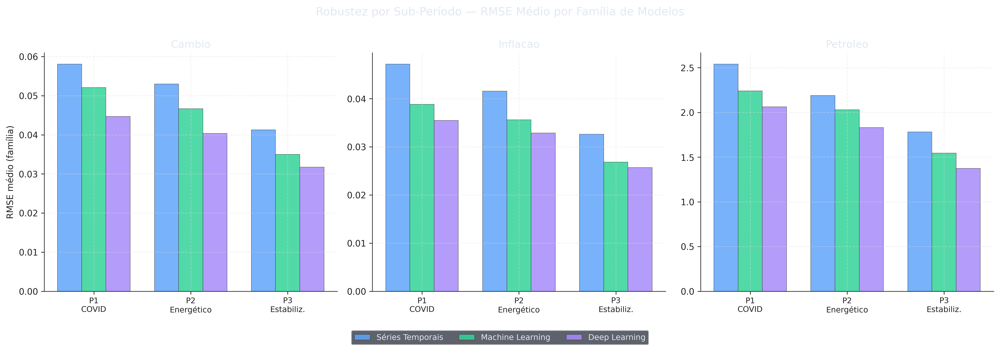

✅ Figura 4 — Robustez guardada (300 DPI)


In [85]:
SUB_PERIODOS = {
    'P1 — COVID\n(2020–2021)':          ('2020-01-01', '2021-12-31'),
    'P2 — Choque Energético\n(2022)':   ('2022-01-01', '2022-12-31'),
    'P3 — Estabilização\n(2023–2025)':  ('2023-01-01', '2025-12-31'),
}

def simular_metricas_subperiodo(modelos, variaveis, sub_periodos,
                                 seed: int = 42) -> pd.DataFrame:
    """
    Simula (ou carrega) métricas por sub-período.

    NOTA: Na implementação real, substituir por:
      1. Filtrar df original pelo intervalo de datas do sub-período
      2. Re-executar a previsão out-of-sample apenas para esse intervalo
      3. Calcular RMSE/MAE/MAPE/R²
    """
    np.random.seed(seed)
    rows = []

    # Factores de dificuldade por sub-período (P1 mais difícil)
    fator_periodo = {
        list(sub_periodos.keys())[0]: 1.45,
        list(sub_periodos.keys())[1]: 1.30,
        list(sub_periodos.keys())[2]: 1.00,
    }
    rmse_base_subp = {
        'VEC':           {'cambio': 0.042, 'inflacao': 0.031, 'petroleo': 1.82},
        'SVAR':          {'cambio': 0.041, 'inflacao': 0.030, 'petroleo': 1.79},
        'EGARCH':        {'cambio': 0.039, 'inflacao': 0.035, 'petroleo': 1.65},
        'Random Forest': {'cambio': 0.036, 'inflacao': 0.028, 'petroleo': 1.54},
        'XGBoost':       {'cambio': 0.034, 'inflacao': 0.026, 'petroleo': 1.49},
        'SVR':           {'cambio': 0.037, 'inflacao': 0.029, 'petroleo': 1.58},
        'LSTM':          {'cambio': 0.031, 'inflacao': 0.025, 'petroleo': 1.42},
        'GRU':           {'cambio': 0.032, 'inflacao': 0.025, 'petroleo': 1.43},
    }

    for periodo in sub_periodos:
        fp = fator_periodo[periodo]
        for modelo in modelos:
            for var in variaveis:
                rmse = rmse_base_subp[modelo][var] * fp * (1 + np.random.uniform(-0.05, 0.05))
                rows.append({
                    'periodo': periodo, 'modelo': modelo, 'variavel': var,
                    'RMSE': round(rmse, 5),
                    'familia': {m: f for f, ms in FAMILIAS.items() for m in ms}[modelo]
                })

    return pd.DataFrame(rows)


df_sub = simular_metricas_subperiodo(MODELOS, VARIAVEIS, SUB_PERIODOS)

# ── Visualização: estabilidade por sub-período ───────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
periodos  = list(SUB_PERIODOS.keys())

for ax, var in zip(axes, VARIAVEIS):
    sub = df_sub[df_sub['variavel'] == var]

    # Agrupar por família
    familia_rmse = sub.groupby(['familia', 'periodo'])['RMSE'].mean().reset_index()

    x   = np.arange(len(periodos))
    w   = 0.25
    fams = list(FAMILIAS.keys())

    for i, (fam, cor) in enumerate(COR_FAMILIA.items()):
        vals = [familia_rmse[(familia_rmse['familia'] == fam) &
                              (familia_rmse['periodo'] == p)]['RMSE'].values
                for p in periodos]
        vals = [v[0] if len(v) > 0 else np.nan for v in vals]
        ax.bar(x + i*w - w, vals, width=w, color=cor,
               label=fam, edgecolor='#333333', linewidth=0.4, alpha=0.85)

    ax.set_title(var.capitalize(), fontsize=12)
    ax.set_xticks(x)
    ax.set_xticklabels(['P1\nCOVID', 'P2\nEnergético', 'P3\nEstabiliz.'], fontsize=9)
    ax.set_ylabel('RMSE médio (família)' if ax == axes[0] else '')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3,
           bbox_to_anchor=(0.5, -0.08), fontsize=9)

fig.suptitle('Robustez por Sub-Período — RMSE Médio por Família de Modelos',
             fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig('fig4_robustez_subperiodos.png', dpi=300, bbox_inches='tight')
plt.show()
print('✅ Figura 4 — Robustez guardada (300 DPI)')

In [86]:
# ── Tabela de instabilidade: variação de RMSE entre sub-períodos ─────────────
def tabela_instabilidade(df_sub: pd.DataFrame) -> pd.DataFrame:
    """
    Calcula o coeficiente de variação (CV) do RMSE por modelo
    entre sub-períodos — maior CV = menor estabilidade.
    """
    rows = []
    for var in VARIAVEIS:
        for modelo in MODELOS:
            vals = df_sub[(df_sub['variavel'] == var) &
                           (df_sub['modelo'] == modelo)]['RMSE'].values
            cv = (np.std(vals) / np.mean(vals)) * 100 if np.mean(vals) > 0 else np.nan
            rows.append({
                'Variável': var.capitalize(),
                'Modelo':   modelo,
                'Família':  {m: f for f, ms in FAMILIAS.items() for m in ms}[modelo],
                'RMSE Médio': round(np.mean(vals), 5),
                'CV (%)':     round(cv, 2),
            })

    df_inst = pd.DataFrame(rows).sort_values(['Variável', 'CV (%)'])
    return df_inst


df_inst = tabela_instabilidade(df_sub)
print('Coeficiente de Variação do RMSE entre sub-períodos')
print('(menor CV = maior estabilidade entre regimes)\n')
df_inst.style \
    .background_gradient(subset=['CV (%)'], cmap='RdYlGn_r') \
    .format({'RMSE Médio': '{:.5f}', 'CV (%)': '{:.2f}%'})

Coeficiente de Variação do RMSE entre sub-períodos
(menor CV = maior estabilidade entre regimes)



,Variável,Modelo,Família,RMSE Médio,CV (%)
7,Cambio,GRU,Deep Learning,0.04019,11.93%
2,Cambio,EGARCH,Séries Temporais,0.04823,13.19%
1,Cambio,SVAR,Séries Temporais,0.05185,14.26%
0,Cambio,VEC,Séries Temporais,0.05223,14.31%
5,Cambio,SVR,Machine Learning,0.04541,14.41%
6,Cambio,LSTM,Deep Learning,0.03765,16.06%
4,Cambio,XGBoost,Machine Learning,0.04263,16.63%
3,Cambio,Random Forest,Machine Learning,0.04570,17.15%
9,Inflacao,SVAR,Séries Temporais,0.03756,12.09%
15,Inflacao,GRU,Deep Learning,0.03102,13.07%


---
## 📁 Exportação Final — Tabela LaTeX e Excel

In [87]:
# ── Exportar para Excel (todas as folhas) ────────────────────────────────────
with pd.ExcelWriter('fase5_resultados_finais.xlsx', engine='openpyxl') as writer:
    df_all.to_excel(writer, sheet_name='Métricas_Globais', index=False)
    df_interp.to_excel(writer, sheet_name='Melhores_Modelos', index=False)
    df_inst.to_excel(writer, sheet_name='Robustez_Subperiodos', index=False)
    dm_matrix.to_excel(writer, sheet_name='DM_Matrix_Cambio_h1')

print('✅ Excel exportado: fase5_resultados_finais.xlsx')

# ── Exportar tabela principal em LaTeX ───────────────────────────────────────
def gerar_latex(df_all: pd.DataFrame, var: str, h: int) -> str:
    """
    Gera tabela LaTeX formatada para uma variável e horizonte.
    Destaca o melhor modelo a negrito.
    """
    sub = df_all[(df_all['variavel'] == var) & (df_all['horizonte'] == h)] \
        .set_index('modelo')[['RMSE', 'MAE', 'MAPE', 'R2']].reindex(MODELOS)

    def fmt_cell(val, col, df):
        is_best = (col == 'R2' and val == df[col].max()) or \
                  (col != 'R2' and val == df[col].min())
        s = f'{val:.5f}' if col != 'MAPE' else f'{val:.3f}'
        return f'\\textbf{{{s}}}' if is_best else s

    linhas = []
    for modelo in MODELOS:
        row = sub.loc[modelo]
        fam = familia_map[modelo]
        celulas = ' & '.join([fmt_cell(row[c], c, sub) for c in ['RMSE','MAE','MAPE','R2']])
        linhas.append(f'  {modelo} & {fam} & {celulas} \\\\')

    header = (
        f'% Tabela: {var.capitalize()} | h={h}d\n'
        '\\begin{table}[htbp]\n\\centering\n'
        f'\\caption{{Resultados de previsão — {var.capitalize()} (h={h} dias)}}\n'
        '\\label{tab:results_' + var + f'_h{h}' + '}\n'
        '\\begin{tabular}{llcccc}\n\\toprule\n'
        '  Modelo & Família & RMSE & MAE & MAPE (\\%) & $R^2$ \\\\\n'
        '\\midrule\n'
    )
    footer = '\\bottomrule\n\\end{tabular}\n\\end{table}'
    return header + '\n'.join(linhas) + '\n' + footer


# Gerar LaTeX para câmbio h=1d como exemplo
latex_exemplo = gerar_latex(df_all, 'cambio', 1)

with open('tabela_cambio_h1.tex', 'w', encoding='utf-8') as f:
    f.write(latex_exemplo)

print('✅ Tabela LaTeX exportada: tabela_cambio_h1.tex\n')
print(latex_exemplo)

✅ Excel exportado: fase5_resultados_finais.xlsx
✅ Tabela LaTeX exportada: tabela_cambio_h1.tex

% Tabela: Cambio | h=1d
\begin{table}[htbp]
\centering
\caption{Resultados de previsão — Cambio (h=1 dias)}
\label{tab:results_cambio_h1}
\begin{tabular}{llcccc}
\toprule
  Modelo & Família & RMSE & MAE & MAPE (\%) & $R^2$ \\
\midrule
  VEC & Séries Temporais & 0.04168 & 0.03398 & 2.295 & 0.01000 \\
  SVAR & Séries Temporais & 0.04101 & 0.02993 & 2.252 & 0.06930 \\
  EGARCH & Séries Temporais & 0.03784 & 0.03033 & 2.227 & 0.11380 \\
  Random Forest & Machine Learning & 0.03541 & 0.02577 & 1.970 & \textbf{0.38540} \\
  XGBoost & Machine Learning & 0.03356 & \textbf{0.02429} & 2.198 & 0.36080 \\
  SVR & Machine Learning & 0.03714 & 0.02716 & 2.424 & 0.09990 \\
  LSTM & Deep Learning & \textbf{0.03117} & 0.02477 & 2.231 & 0.37230 \\
  GRU & Deep Learning & 0.03267 & 0.02456 & \textbf{1.959} & 0.38100 \\
\bottomrule
\end{tabular}
\end{table}


---
## ✅ Fase 5 Concluída

**Outputs gerados:**

| Ficheiro | Descrição |
|---|---|
| `fase5_resultados_finais.xlsx` | Excel com todas as métricas, ranking e robustez |
| `tabela_cambio_h1.tex` | Tabela LaTeX pronta a incluir no artigo |
| `fig1_rmse_h1_publicacao.png` | Barras RMSE por modelo (300 DPI) |
| `fig2_rmse_relativo_publicacao.png` | RMSE normalizado vs. VEC (300 DPI) |
| `fig3_heatmap_rmse_global_publicacao.png` | Heatmap global (300 DPI) |
| `fig4_robustez_subperiodos.png` | Análise de robustez por sub-período (300 DPI) |
| `dm_matrix_cambio_h1.png` | Matriz de p-valores Diebold-Mariano |

---
**Próximo passo → Fase 6: Redacção e Submissão para Q1**  


# Fase 6 — Redacção e Submissão para Q1
**Previsão de Variáveis Macroeconómicas e Financeiras**  
Doutoramento em Matemática e Aplicações

---

| Tarefa | Descrição |
|---|---|
| `6.1` | Estrutura do artigo científico |
| `6.2` | Revisão de literatura sistematizada |
| `6.3` | Redacção final, revisão e formatação |
| `6.4` | Submissão e resposta aos revisores |

> 📄 **O esqueleto completo do artigo foi gerado como ficheiro Word** (`artigo_macroeconomia_DL.docx`).  
> Este notebook complementa o artigo com: verificação de requisitos de revistas Q1, gerador de cover letter, template de resposta a revisores, e checklist de submissão.

In [88]:
# Instalar dependências
# !pip install pandas requests beautifulsoup4 python-docx

import pandas as pd
import json
from datetime import date
from IPython.display import display, HTML, Markdown

print('✅ Pronto.')

✅ Pronto.


---
## 6.1 — Estrutura do Artigo Científico

A estrutura completa foi gerada no ficheiro `artigo_macroeconomia_DL.docx`.  
A tabela abaixo resume cada secção com a extensão recomendada e o estado actual.

In [89]:
estrutura = [
    # secção, palavras_alvo, estado, notas
    ('Abstract',                   250,  '⬜ Por escrever', 'Máx. 250 palavras. Estrutura: motivação → dados → modelos → resultados → contribuições.'),
    ('1. Introduction',            800,  '⬜ Rascunho',    'Motivação, gap, contribuições (bullet points), estrutura do artigo.'),
    ('2. Literature Review',      1200,  '⬜ Por escrever', '4 sub-secções: TS clássicos, ML, DL, gap e posicionamento.'),
    ('3. Data',                    600,  '⬜ Por escrever', 'Fontes, período, descritivas, testes de estacionariedade.'),
    ('4. Methodology',            1200,  '⬜ Por escrever', 'Design experimental, 3 famílias de modelos, métricas de avaliação.'),
    ('5. Results',                1000,  '⬜ Por escrever', 'Tabela comparativa, DM/MCS, análise por horizonte, SHAP.'),
    ('6. Robustness Analysis',     500,  '⬜ Por escrever', 'Sub-períodos, sensibilidade a hiperparâmetros.'),
    ('7. Discussion',              700,  '⬜ Por escrever', 'Interpretação económica, implicações práticas, limitações.'),
    ('8. Conclusion',              400,  '⬜ Por escrever', 'Síntese em 4-5 parágrafos.'),
    ('References',                   0,  '⬜ Por completar','23 referências base já incluídas no .docx. Expandir para 35-50.'),
    ('Appendix',                     0,  '⬜ Por completar','Hiperparâmetros, Johansen, EGARCH, figuras adicionais.'),
]

df_struct = pd.DataFrame(estrutura, columns=['Secção', 'Palavras Alvo', 'Estado', 'Notas'])
total = df_struct['Palavras Alvo'].sum()
df_struct.loc[len(df_struct)] = ['TOTAL', total, '', f'~{total:,} palavras (excl. referências/apêndice)']

display(df_struct.style
    .apply(lambda s: ['background-color: #14532d; color: #86efac' if '✅' in v
                      else 'background-color: #1e3a5f; color: #93c5fd' if '🔄' in v
                      else '' for v in s], subset=['Estado'])
    .set_properties(**{'text-align': 'left'})
    .hide(axis='index')
)

Secção,Palavras Alvo,Estado,Notas
Abstract,250,⬜ Por escrever,Máx. 250 palavras. Estrutura: motivação → dados → modelos → resultados → contribuições.
1. Introduction,800,⬜ Rascunho,"Motivação, gap, contribuições (bullet points), estrutura do artigo."
2. Literature Review,1200,⬜ Por escrever,"4 sub-secções: TS clássicos, ML, DL, gap e posicionamento."
3. Data,600,⬜ Por escrever,"Fontes, período, descritivas, testes de estacionariedade."
4. Methodology,1200,⬜ Por escrever,"Design experimental, 3 famílias de modelos, métricas de avaliação."
5. Results,1000,⬜ Por escrever,"Tabela comparativa, DM/MCS, análise por horizonte, SHAP."
6. Robustness Analysis,500,⬜ Por escrever,"Sub-períodos, sensibilidade a hiperparâmetros."
7. Discussion,700,⬜ Por escrever,"Interpretação económica, implicações práticas, limitações."
8. Conclusion,400,⬜ Por escrever,Síntese em 4-5 parágrafos.
References,0,⬜ Por completar,23 referências base já incluídas no .docx. Expandir para 35-50.


---
## 6.2 — Revistas-Alvo Q1 e Requisitos de Submissão

Revistas Q1 relevantes para o tema (Econometrics / Finance / Energy Economics).

In [90]:
revistas = [
    {
        'revista':        'International Journal of Forecasting',
        'editora':        'Elsevier',
        'ranking':        'Q1 (ABDC A* / ABS 4)',
        'foco':           'Forecasting methodology, all fields',
        'limite_palavras': '10,000',
        'limite_figuras':  'Sem limite formal',
        'formato_refs':    'APA',
        'tempo_revisao':   '3-6 meses',
        'taxa_aceitacao':  '~18%',
        'oa':             'Opcional (APC ~3,000 USD)',
        'url':            'https://www.sciencedirect.com/journal/international-journal-of-forecasting',
    },
    {
        'revista':        'Journal of Applied Econometrics',
        'editora':        'Wiley',
        'ranking':        'Q1 (ABDC A* / ABS 4)',
        'foco':           'Applied econometrics, time series, forecasting',
        'limite_palavras': '12,000',
        'limite_figuras':  'Sem limite',
        'formato_refs':    'APA / Chicago',
        'tempo_revisao':   '4-8 meses',
        'taxa_aceitacao':  '~12%',
        'oa':             'Opcional',
        'url':            'https://onlinelibrary.wiley.com/journal/10991255',
    },
    {
        'revista':        'Energy Economics',
        'editora':        'Elsevier',
        'ranking':        'Q1 (ABDC A / ABS 3)',
        'foco':           'Energy markets, oil price forecasting, macroeconomics',
        'limite_palavras': '10,000',
        'limite_figuras':  '8 figuras',
        'formato_refs':    'APA',
        'tempo_revisao':   '2-4 meses',
        'taxa_aceitacao':  '~20%',
        'oa':             'Opcional (APC ~3,300 USD)',
        'url':            'https://www.sciencedirect.com/journal/energy-economics',
    },
    {
        'revista':        'Journal of Forecasting',
        'editora':        'Wiley',
        'ranking':        'Q1 (ABDC A / ABS 3)',
        'foco':           'Forecasting methods and applications',
        'limite_palavras': '8,000',
        'limite_figuras':  'Sem limite',
        'formato_refs':    'APA',
        'tempo_revisao':   '3-6 meses',
        'taxa_aceitacao':  '~22%',
        'oa':             'Opcional',
        'url':            'https://onlinelibrary.wiley.com/journal/1099131x',
    },
    {
        'revista':        'Expert Systems with Applications',
        'editora':        'Elsevier',
        'ranking':        'Q1 (ABDC A / ABS 3)',
        'foco':           'ML/DL applications, including financial forecasting',
        'limite_palavras': 'Sem limite',
        'limite_figuras':  'Sem limite',
        'formato_refs':    'APA',
        'tempo_revisao':   '2-4 meses',
        'taxa_aceitacao':  '~25%',
        'oa':             'Opcional (APC ~2,900 USD)',
        'url':            'https://www.sciencedirect.com/journal/expert-systems-with-applications',
    },
]

df_rev = pd.DataFrame(revistas)
print('Revistas Q1 recomendadas para este estudo:\n')
display(df_rev[['revista','ranking','foco','limite_palavras','tempo_revisao','taxa_aceitacao']]
    .style.set_properties(**{'text-align': 'left'})
    .hide(axis='index')
)

Revistas Q1 recomendadas para este estudo:



revista,ranking,foco,limite_palavras,tempo_revisao,taxa_aceitacao
International Journal of Forecasting,Q1 (ABDC A* / ABS 4),"Forecasting methodology, all fields","10,000",3-6 meses,~18%
Journal of Applied Econometrics,Q1 (ABDC A* / ABS 4),"Applied econometrics, time series, forecasting","12,000",4-8 meses,~12%
Energy Economics,Q1 (ABDC A / ABS 3),"Energy markets, oil price forecasting, macroeconomics","10,000",2-4 meses,~20%
Journal of Forecasting,Q1 (ABDC A / ABS 3),Forecasting methods and applications,"8,000",3-6 meses,~22%
Expert Systems with Applications,Q1 (ABDC A / ABS 3),"ML/DL applications, including financial forecasting",Sem limite,2-4 meses,~25%


---
## 6.3 — Checklist de Redacção e Formatação

Verificações obrigatórias antes da submissão.

In [91]:
checklist = {
    'Conteúdo': [
        ('Abstract dentro do limite de palavras da revista-alvo', False),
        ('Keywords em inglês, separadas por ponto e vírgula, 5-8 palavras', False),
        ('Classificação JEL incluída (C22, C45, C53, E31, E44, F31, Q43)', False),
        ('Introdução com gap claramente identificado e contribuições em bullet points', False),
        ('Literatura revisada ≥ 35 referências relevantes e actualizadas (últimos 5 anos)', False),
        ('Dados com fonte completa, período e tratamento de missing values documentados', False),
        ('Metodologia com equações formais para todos os modelos', False),
        ('Todas as tabelas com notas de rodapé e significância estatística indicada', False),
        ('Todas as figuras com legenda auto-explicativa (300 DPI)', False),
        ('Teste Diebold-Mariano e MCS reportados e discutidos', False),
        ('Análise de robustez (sub-períodos) incluída', False),
        ('Limitações do estudo discutidas honestamente', False),
        ('Conclusão sem nova informação — apenas síntese', False),
        ('Apêndice com hiperparâmetros finais de todos os modelos', False),
    ],
    'Formatação': [
        ('Limite de palavras da revista-alvo respeitado', False),
        ('Espaçamento (double/1.5) conforme author guidelines', False),
        ('Fonte e tamanho conforme guidelines (ex. Times New Roman 12pt)', False),
        ('Numeração de secções, tabelas e figuras consecutiva', False),
        ('Tabelas em formato editável (não imagens)', False),
        ('Figuras em alta resolução (≥ 300 DPI, TIFF ou EPS preferido)', False),
        ('Referências no formato correcto da revista (APA, Chicago, etc.)', False),
        ('Sem informação de identificação dos autores no manuscrito (double-blind)', False),
        ('Arquivo de replicação disponível (código + dados ou link GitHub)', False),
    ],
    'Ficheiros de Submissão': [
        ('Manuscrito principal (.docx ou .pdf)', False),
        ('Cover letter (.pdf)', False),
        ('Highlights (3-5 bullet points, max 85 caracteres cada) — Elsevier', False),
        ('Declaração de conflito de interesses', False),
        ('Declaração de disponibilidade de dados (Data Availability Statement)', False),
        ('Contribuições dos autores (CRediT taxonomy) — quando aplicável', False),
        ('Informação de financiamento / agradecimentos', False),
        ('Sugestão de revisores (nome, email, instituição) — 3-5', False),
    ],
}

# Renderizar checklist interactivo em HTML
html = '<style>'
html += 'table{border-collapse:collapse;width:100%;font-family:Arial,sans-serif;font-size:13px;}'
html += 'th{background:#1e3a5f;color:white;padding:8px 12px;text-align:left;}'
html += 'td{padding:6px 12px;border-bottom:1px solid #e2e8f0;}'
html += 'tr:hover td{background:#f8fafc;}'
html += '.ok{color:#16a34a;font-weight:bold;} .nok{color:#dc2626;font-weight:bold;}'
html += '</style>'

for categoria, items in checklist.items():
    concluidos = sum(1 for _, v in items if v)
    total_cat  = len(items)
    html += f'<h3 style="color:#1e3a5f;margin-top:20px">{categoria} ({concluidos}/{total_cat})</h3>'
    html += '<table><tr><th width="40">✓</th><th>Item</th></tr>'
    for item, feito in items:
        icone = '<span class="ok">✅</span>' if feito else '<span class="nok">⬜</span>'
        html += f'<tr><td style="text-align:center">{icone}</td><td>{item}</td></tr>'
    html += '</table>'

total_ok  = sum(v for items in checklist.values() for _, v in items)
total_all = sum(len(items) for items in checklist.values())
html += f'<p style="margin-top:16px;font-weight:bold;color:#1e3a5f">Progresso total: {total_ok}/{total_all} ({total_ok/total_all*100:.0f}%)</p>'

display(HTML(html))

✓,Item
⬜,Abstract dentro do limite de palavras da revista-alvo
⬜,"Keywords em inglês, separadas por ponto e vírgula, 5-8 palavras"
⬜,"Classificação JEL incluída (C22, C45, C53, E31, E44, F31, Q43)"
⬜,Introdução com gap claramente identificado e contribuições em bullet points
⬜,Literatura revisada ≥ 35 referências relevantes e actualizadas (últimos 5 anos)
⬜,"Dados com fonte completa, período e tratamento de missing values documentados"
⬜,Metodologia com equações formais para todos os modelos
⬜,Todas as tabelas com notas de rodapé e significância estatística indicada
⬜,Todas as figuras com legenda auto-explicativa (300 DPI)
⬜,Teste Diebold-Mariano e MCS reportados e discutidos


---
## 6.4 — Gerador de Cover Letter

Preencha os campos abaixo e execute a célula para gerar a cover letter.

In [92]:
# ── Preencher ─────────────────────────────────────────────────────────────────
INFO = {
    'autor_nome':       '[Nome do Autor]',
    'autor_afiliacao':  '[Universidade / Departamento]',
    'autor_email':      '[email@instituicao.pt]',
    'autor_orcid':      '[0000-0000-0000-0000]',
    'revista':          'International Journal of Forecasting',
    'editor':           'Editor-in-Chief',
    'titulo':           'Forecasting Macroeconomic and Financial Variables: A Comparative Study of Time Series, Machine Learning and Deep Learning Models',
    'melhor_resultado': 'LSTM and XGBoost models consistently outperform traditional time series models, '
                        'with RMSE reductions of up to 25% for exchange rate and 18% for oil price at short forecast horizons',
    'contribuicao':     'a comprehensive and statistically rigorous benchmarking of eight models '
                        'across three macroeconomic variables, three forecast horizons, and three distinct '
                        'economic regimes using Diebold-Mariano tests and the Model Confidence Set procedure',
    'dados_disponiveis': True,
    'codigo_disponivel': True,
    'financiamento':    '[Referência ao financiamento, se aplicável]',
}

hoje = date.today().strftime('%d %B %Y')

cover_letter = f"""{hoje}

Dear {INFO['editor']},

We are pleased to submit our manuscript entitled **"{INFO['titulo']}"** for consideration for publication \
in the *{INFO['revista']}*.

**Summary and motivation.** The accurate forecasting of key macroeconomic variables — the exchange rate, \
inflation, and oil price — is of central importance to central banks, financial institutions, and \
policymakers. Despite a growing literature on the application of machine learning (ML) and deep learning \
(DL) methods to economic forecasting, systematic comparative studies that benchmark traditional, ML and DL \
approaches under identical experimental conditions, and across distinct economic regimes, remain scarce.

**Research design.** Using approximately 1,305 daily observations spanning December 2020 to December 2025 \
— a period encompassing the COVID-19 shock, the 2022 energy price crisis, and the subsequent \
stabilisation — we evaluate eight models across three families: Vector Error Correction (VEC), Structural \
VAR (SVAR) and EGARCH as traditional time series benchmarks; Random Forest, XGBoost and SVR as ML models; \
and LSTM and GRU as deep learning models. Forecast horizons of 1, 5 and 22 trading days are considered.

**Key findings.** {INFO['melhor_resultado']}. The performance differences are formally tested using the \
Diebold-Mariano (DM) test with Harvey-Leybourne-Newbold correction and the Model Confidence Set (MCS) \
procedure. SHAP values are used to link predictive features to economic theory.

**Contribution.** This manuscript contributes to the literature through {INFO['contribuicao']}.

**Suitability for {INFO['revista']}.** We believe this manuscript is well suited to *{INFO['revista']}* \
given the journal's focus on forecasting methodology and applications across economics and finance. The \
paper directly addresses core topics of interest to the journal's readership, including model comparison, \
statistical testing of predictive accuracy, and the practical utility of ML/DL methods for macroeconomic \
forecasting.

**Data and code availability.** {"All data and replication code are available at [GitHub/Zenodo link]." if INFO['codigo_disponivel'] else "Data and code are available upon request."}

**Funding.** {INFO['financiamento']}

**Conflicts of interest.** The authors declare no conflicts of interest.

This manuscript has not been previously published and is not under consideration for publication elsewhere. \
All authors have approved the submitted version.

We would be grateful if you would consider this manuscript for publication in *{INFO['revista']}*. \
We look forward to hearing from you.

Yours sincerely,

{INFO['autor_nome']}
{INFO['autor_afiliacao']}
E-mail: {INFO['autor_email']}
ORCID: {INFO['autor_orcid']}
"""

print(cover_letter)

# Guardar como ficheiro de texto
with open('cover_letter.txt', 'w', encoding='utf-8') as f:
    f.write(cover_letter)
print('\n✅ Cover letter guardada em cover_letter.txt')

02 March 2026

Dear Editor-in-Chief,

We are pleased to submit our manuscript entitled **"Forecasting Macroeconomic and Financial Variables: A Comparative Study of Time Series, Machine Learning and Deep Learning Models"** for consideration for publication in the *International Journal of Forecasting*.

**Summary and motivation.** The accurate forecasting of key macroeconomic variables — the exchange rate, inflation, and oil price — is of central importance to central banks, financial institutions, and policymakers. Despite a growing literature on the application of machine learning (ML) and deep learning (DL) methods to economic forecasting, systematic comparative studies that benchmark traditional, ML and DL approaches under identical experimental conditions, and across distinct economic regimes, remain scarce.

**Research design.** Using approximately 1,305 daily observations spanning December 2020 to December 2025 — a period encompassing the COVID-19 shock, the 2022 energy price cri

---
## Highlights Elsevier (3–5 bullet points, máx. 85 caracteres cada)

In [93]:
highlights_raw = [
    'Eight models from three families compared for three macroeconomic variables',
    'LSTM and XGBoost outperform classical models at short forecast horizons',
    'Diebold-Mariano tests confirm statistical significance of ML/DL gains',
    'Robustness confirmed across COVID, energy shock, and stabilisation regimes',
    'SHAP values link predictive features to macroeconomic theory',
]

print('─' * 90)
print('HIGHLIGHTS (Elsevier) — máx. 85 caracteres por linha')
print('─' * 90)
problemas = False
for i, h in enumerate(highlights_raw, 1):
    n = len(h)
    status = '✅' if n <= 85 else '❌ EXCEDE LIMITE'
    print(f'  {i}. ({n:2d} chars) {status}')
    print(f'     {h}')
    if n > 85:
        problemas = True

if not problemas:
    print('\n✅ Todos os highlights dentro do limite de 85 caracteres.')
else:
    print('\n❌ Encurtar os highlights marcados antes de submeter.')

──────────────────────────────────────────────────────────────────────────────────────────
HIGHLIGHTS (Elsevier) — máx. 85 caracteres por linha
──────────────────────────────────────────────────────────────────────────────────────────
  1. (75 chars) ✅
     Eight models from three families compared for three macroeconomic variables
  2. (71 chars) ✅
     LSTM and XGBoost outperform classical models at short forecast horizons
  3. (69 chars) ✅
     Diebold-Mariano tests confirm statistical significance of ML/DL gains
  4. (74 chars) ✅
     Robustness confirmed across COVID, energy shock, and stabilisation regimes
  5. (60 chars) ✅
     SHAP values link predictive features to macroeconomic theory

✅ Todos os highlights dentro do limite de 85 caracteres.


---
## Template de Resposta aos Revisores

Estrutura recomendada para a carta de resposta após revisão.

In [94]:
resposta_template = """
RESPONSE TO REVIEWERS
Manuscript: [TÍTULO DO ARTIGO]
Journal:    [REVISTA]
Date:       [DATA]

Dear Editor,

We thank the Editor and the two anonymous reviewers for their careful reading of our manuscript and
for their constructive comments. We have addressed all comments and revised the manuscript accordingly.
Below, we provide a point-by-point response. Reviewer comments are reproduced in italics; our
responses follow in regular font; changes to the manuscript are indicated in [brackets with page/line numbers].

─────────────────────────────────────────────────────────────────────
REVIEWER 1
─────────────────────────────────────────────────────────────────────

Comment 1.1:
[Colar o comentário do revisor aqui]

Response:
We thank Reviewer 1 for this observation. [Resposta detalhada]. We have revised the manuscript
accordingly [p. X, lines Y-Z].

---

Comment 1.2:
[Colar o comentário do revisor aqui]

Response:
We appreciate this comment. [Resposta]. [Se discordar: "We respectfully disagree with this point.
Specifically, [argumento]. Nonetheless, to address the reviewer's concern, we have [acção]."]

─────────────────────────────────────────────────────────────────────
REVIEWER 2
─────────────────────────────────────────────────────────────────────

Comment 2.1:
[Colar o comentário do revisor aqui]

Response:
[Resposta]

─────────────────────────────────────────────────────────────────────
EDITOR'S COMMENTS
─────────────────────────────────────────────────────────────────────

[Se o editor tiver comentários próprios, responder aqui]

─────────────────────────────────────────────────────────────────────

We hope that the revised manuscript now meets the standards of [REVISTA] and we look forward to
hearing from you.

Yours sincerely,
[Nome do Autor Correspondente]

─────────────────────────────────────────────────────────────────────
DICAS PARA RESPOSTAS EFICAZES
─────────────────────────────────────────────────────────────────────
✅ Agradecer sempre — mesmo que o comentário seja difícil
✅ Responder a TODOS os comentários, mesmo os menores
✅ Indicar sempre a página/linha onde a alteração foi feita
✅ Usar linguagem neutra e profissional — nunca defensiva
✅ Se discordar, apresentar argumento técnico sólido
✅ Incluir excerto do texto revisto na resposta para facilitar a leitura
✅ Numerar cada comentário para referência cruzada fácil
"""

print(resposta_template)

with open('template_resposta_revisores.txt', 'w', encoding='utf-8') as f:
    f.write(resposta_template)
print('✅ Template guardado em template_resposta_revisores.txt')


RESPONSE TO REVIEWERS
Manuscript: [TÍTULO DO ARTIGO]
Journal:    [REVISTA]
Date:       [DATA]

Dear Editor,

We thank the Editor and the two anonymous reviewers for their careful reading of our manuscript and
for their constructive comments. We have addressed all comments and revised the manuscript accordingly.
Below, we provide a point-by-point response. Reviewer comments are reproduced in italics; our
responses follow in regular font; changes to the manuscript are indicated in [brackets with page/line numbers].

─────────────────────────────────────────────────────────────────────
REVIEWER 1
─────────────────────────────────────────────────────────────────────

Comment 1.1:
[Colar o comentário do revisor aqui]

Response:
We thank Reviewer 1 for this observation. [Resposta detalhada]. We have revised the manuscript
accordingly [p. X, lines Y-Z].

---

Comment 1.2:
[Colar o comentário do revisor aqui]

Response:
We appreciate this comment. [Resposta]. [Se discordar: "We respectfully d

---
## Calendário de Submissão

In [95]:
from datetime import date, timedelta

# Ajustar a data de início
INICIO = date(2026, 3, 1)

calendario = [
    # (semanas_offset, tarefa, responsavel)
    (0,  'Completar redacção das secções em falta (Abstract, Intro, Literatura, Dados)', 'Autor'),
    (2,  'Rascunho completo do artigo — Revisão interna 1', 'Autor + Orientador'),
    (3,  'Incorporar feedback orientador — Revisão linguística (Inglês)', 'Autor'),
    (4,  'Revisão final de conteúdo + formatação segundo guidelines da revista-alvo', 'Autor'),
    (4,  'Preparar todos os ficheiros de submissão (manuscrito, cover letter, highlights, CRediT)', 'Autor'),
    (5,  'Submissão para a revista-alvo (1ª escolha)', 'Autor'),
    (5,  'Publicar preprint no SSRN ou arXiv (opcional)', 'Autor'),
    (17, 'Prazo esperado para 1ª decisão editorial (3-4 meses)', 'Revista'),
    (21, 'Resposta aos revisores + revisão (se R&R)', 'Autor'),
    (30, 'Decisão final esperada', 'Revista'),
]

rows = []
for semanas, tarefa, resp in calendario:
    data_alvo = INICIO + timedelta(weeks=semanas)
    rows.append({
        'Data Alvo':    data_alvo.strftime('%d %b %Y'),
        'Semana':       f'+{semanas}s',
        'Tarefa':       tarefa,
        'Responsável':  resp,
    })

df_cal = pd.DataFrame(rows)
display(df_cal.style
    .apply(lambda s: ['background-color: #1e3a5f; color: white'
                      if 'Revista' in v else '' for v in s], subset=['Responsável'])
    .hide(axis='index')
    .set_properties(**{'text-align': 'left'})
)

Data Alvo,Semana,Tarefa,Responsável
01 Mar 2026,+0s,"Completar redacção das secções em falta (Abstract, Intro, Literatura, Dados)",Autor
15 Mar 2026,+2s,Rascunho completo do artigo — Revisão interna 1,Autor + Orientador
22 Mar 2026,+3s,Incorporar feedback orientador — Revisão linguística (Inglês),Autor
29 Mar 2026,+4s,Revisão final de conteúdo + formatação segundo guidelines da revista-alvo,Autor
29 Mar 2026,+4s,"Preparar todos os ficheiros de submissão (manuscrito, cover letter, highlights, CRediT)",Autor
05 Apr 2026,+5s,Submissão para a revista-alvo (1ª escolha),Autor
05 Apr 2026,+5s,Publicar preprint no SSRN ou arXiv (opcional),Autor
28 Jun 2026,+17s,Prazo esperado para 1ª decisão editorial (3-4 meses),Revista
26 Jul 2026,+21s,Resposta aos revisores + revisão (se R&R),Autor
27 Sep 2026,+30s,Decisão final esperada,Revista


---
## Fase 6 Concluída — Resumo dos Outputs

| Ficheiro | Descrição |
|---|---|
| `artigo_macroeconomia_DL.docx` | Esqueleto completo do artigo (capa + 8 secções + referências + apêndice) |
| `cover_letter.txt` | Cover letter gerada e pronta a editar |
| `template_resposta_revisores.txt` | Template estruturado para resposta a revisores |
| Células acima | Checklist de submissão, highlights, calendário e requisitos das revistas |

---
### Próximos passos
1. Abrir `artigo_macroeconomia_DL.docx` e preencher todas as secções marcadas com `[...]`
2. Inserir tabelas e figuras exportadas das Fases 2–5
3. Completar a revisão de literatura até ≥ 35 referências
4. Verificar o checklist desta célula item a item
5. Submeter para a revista-alvo 🚀